In [2]:
import pandas as pd
import numpy as np
import functools
import matplotlib.pyplot as plt
import geopandas as gpd
import shapely
import seaborn as sns
from shapely.geometry import Polygon, Point


from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import sklearn.cluster as sklc  # For clustering
import sklearn.metrics as sklm  # For the silhouette score

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

from matplotlib.colors import ListedColormap

import sklearn
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import PowerTransformer, RobustScaler, StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans, DBSCAN, OPTICS
from esda.adbscan import ADBSCAN

import contextily as cx

# load data

In [2]:
#retail分类汇总
Classification_defined = pd.read_csv("Classification_defined.csv", encoding = 'unicode_escape')
Classification_defined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2062 entries, 0 to 2061
Data columns (total 50 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          2062 non-null   int64  
 1   before_open_Convenience     2062 non-null   float64
 2   before_open_Miscellaneous   2062 non-null   float64
 3   before_open_Service         2062 non-null   float64
 4   before_open_dining          2062 non-null   float64
 5   before_open_public_events   2062 non-null   float64
 6   before_open_shopping        2062 non-null   float64
 7   before_open_traveling       2062 non-null   float64
 8   lc1_open_Convenience        2062 non-null   float64
 9   lc1_open_Miscellaneous      2062 non-null   float64
 10  lc1_open_Service            2062 non-null   float64
 11  lc1_open_dining             2062 non-null   float64
 12  lc1_open_public_events      2062 non-null   float64
 13  lc1_open_shopping           2062 

In [725]:
lc1grids = pd.read_csv("lc1_grid.csv", encoding = 'unicode_escape')
lc1grids.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2048 entries, 0 to 2047
Data columns (total 14 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          2048 non-null   int64  
 1   lc1_allstores               2048 non-null   int64  
 2   lc1_allvacant               2048 non-null   int64  
 3   lc1_closed                  2048 non-null   int64  
 4   lc1_newopen                 2048 non-null   int64  
 5   lc1_newvacant               2048 non-null   int64  
 6   lc1_open                    2048 non-null   int64  
 7   lc1_vacantallthetime        2048 non-null   int64  
 8   lc1_allvacant_ratio         2048 non-null   float64
 9   lc1_closed_ratio            2048 non-null   float64
 10  lc1_newopen_ratio           2048 non-null   float64
 11  lc1_newvacant_ratio         2048 non-null   float64
 12  lc1_open_ratio              2048 non-null   float64
 13  lc1_vacantallthetime_ratio  2048 

In [5]:
#营业状况变化汇总
change_merged = pd.read_csv("change_merged.csv", encoding = 'unicode_escape')
#change_merged.info()

In [7]:
change_merged.columns

Index(['id', 'lc1_vacantallthetime_ratio', 'e1_vacantallthetime_ratio',
       'lc2_vacantallthetime_ratio', 'e2_vacantallthetime_ratio',
       'recover_vacantallthetime_ratio', 'post_vacantallthetime_ratio',
       'e1_distance', 'lc1_distance', 'lc2_distance', 'e2_distance',
       'recover_distance', 'post_distance', 'distance_change', 'SHDI_lc1_open',
       'SHDI_e1_open', 'SHDI_lc2_open', 'SHDI_e2_open', 'SHDI_recover_open',
       'SHDI_post_open', 'lc1_vacant_ratio_diff_GB', 'e1_vacant_ratio_diff_GB',
       'lc2_vacant_ratio_diff_GB', 'e2_vacant_ratio_diff_GB',
       'recover_vacant_ratio_diff_GB', 'post_vacant_ratio_diff_GB',
       'lc1_vacant_ratio_diff_London', 'e1_vacant_ratio_diff_London',
       'lc2_vacant_ratio_diff_London', 'e2_vacant_ratio_diff_London',
       'recover_vacant_ratio_diff_London', 'post_vacant_ratio_diff_London',
       'lc1_newvacant_ratio', 'e1_newvacant_ratio', 'lc2_newvacant_ratio',
       'e2_newvacant_ratio', 'recover_newvacant_ratio', 'post_n

In [8]:
# #for_cluster = change_merged.merge(Classification_defined,on='id')
for_cluster = change_merged.set_index('id')
for_cluster.sample(5)

,lc1_vacantallthetime_ratio,e1_vacantallthetime_ratio,lc2_vacantallthetime_ratio,e2_vacantallthetime_ratio,recover_vacantallthetime_ratio,post_vacantallthetime_ratio,e1_distance,lc1_distance,lc2_distance,e2_distance,...,lc2_open_ratio,e2_open_ratio,recover_open_ratio,post_open_ratio,lc1_newopen_ratio,e1_newopen_ratio,lc2_newopen_ratio,e2_newopen_ratio,recover_newopen_ratio,post_newopen_ratio
id,,,,,,,,,,,,,,,,,,,,,
33389,0.0,0.0,0.0,0.0,0.0,0.0,0.142914,0.142914,0.142914,0.142914,...,0.00,0.00,0.00,0.000000,0.20,0.000000,0.00,0.00,0.00,0.000000
2125,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.00,0.00,0.00,0.000000,-0.50,-0.500000,-0.50,-0.50,-0.50,-0.500000
10718,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.139254,1.139254,2.439865,...,-0.03,0.17,0.17,0.003333,-0.17,-0.003333,-0.17,-0.17,0.03,-0.003333
15181,0.0,0.0,0.0,0.0,-0.2,0.0,0.000000,0.000000,0.000000,0.000000,...,0.00,0.00,0.00,-0.200000,-0.20,-0.200000,-0.20,-0.20,-0.20,0.000000
20310,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.00,0.00,0.00,0.000000,0.00,0.000000,0.00,0.00,0.00,0.000000


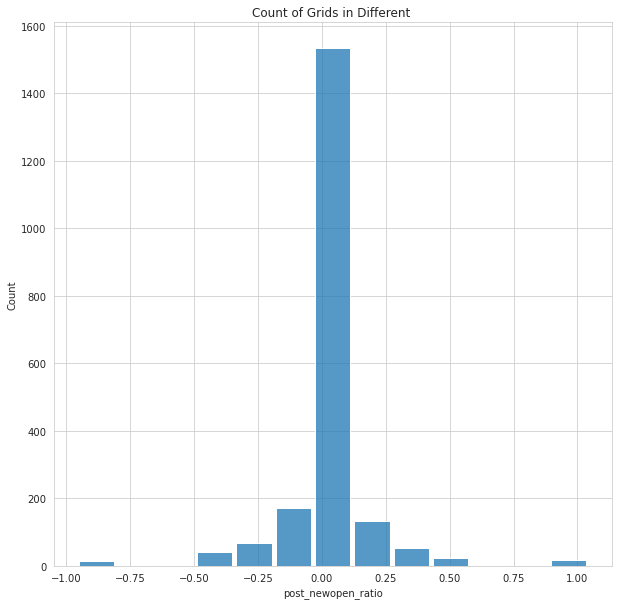

In [20]:
sns.color_palette("Paired")
f, ax = plt.subplots(figsize=(10,10))

ax.set_title('Count of Grids in Different ', fontsize = 12)
sns.set_style("whitegrid")
    

ax = sns.histplot(data=for_cluster, x='post_newopen_ratio', multiple="dodge", shrink=.9)
plt.show()

In [793]:
#筛选出相减后的数量而非比例
#for_cluster1.loc[:,~for_cluster1.columns.str.contains('ratio')]

# PCA降维

In [6]:
# 加载包
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics #用于模型结果指标输出

In [4]:
#lc1_all_grids_pca= for_cluster.filter(regex='lc1',axis=1)
#e1_all_grids_pca= for_cluster.filter(regex='e1',axis=1)
#lc2_all_grids_pca= for_cluster.filter(regex='lc2',axis=1)
#e2_all_grids_pca= for_cluster.filter(regex='e2',axis=1)
#recover_all_grids_pca= for_cluster.filter(regex='recover',axis=1)
#post_all_grids_pca= for_cluster.filter(regex='post',axis=1)

#lc_all_grids_pca= for_cluster.filter(regex='lc',axis=1)
#e_all_grids_pca= for_cluster.filter(regex='e',axis=1)

cls_pca= cls.filter(regex='Clusters',axis=1)

In [3]:
cls= pd.read_csv("cls汇总.csv", encoding = 'unicode_escape')
cls.info()

cls = cls.set_index('id')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2062 entries, 0 to 2061
Data columns (total 11 columns):
 #   Column                                                                           Non-Null Count  Dtype  
---  ------                                                                           --------------  -----  
 0   id                                                                               2062 non-null   int64  
 1   Station                                                                          2062 non-null   object 
 2   Clusters of Retail Environments during the First Easing Phase(2020.07-2020.10)   2062 non-null   int64  
 3   Clusters of Retail Environments during the First Lockdown(2020.03-2020.06)       2062 non-null   int64  
 4   Clusters of Retail Environments during the Second Lockdown(2020.11-2021.03)      2062 non-null   int64  
 5   Clusters of Retail Environments during the Second Easing Phase(2021.04-2021.07)  2062 non-null   int64  
 6   Clusters

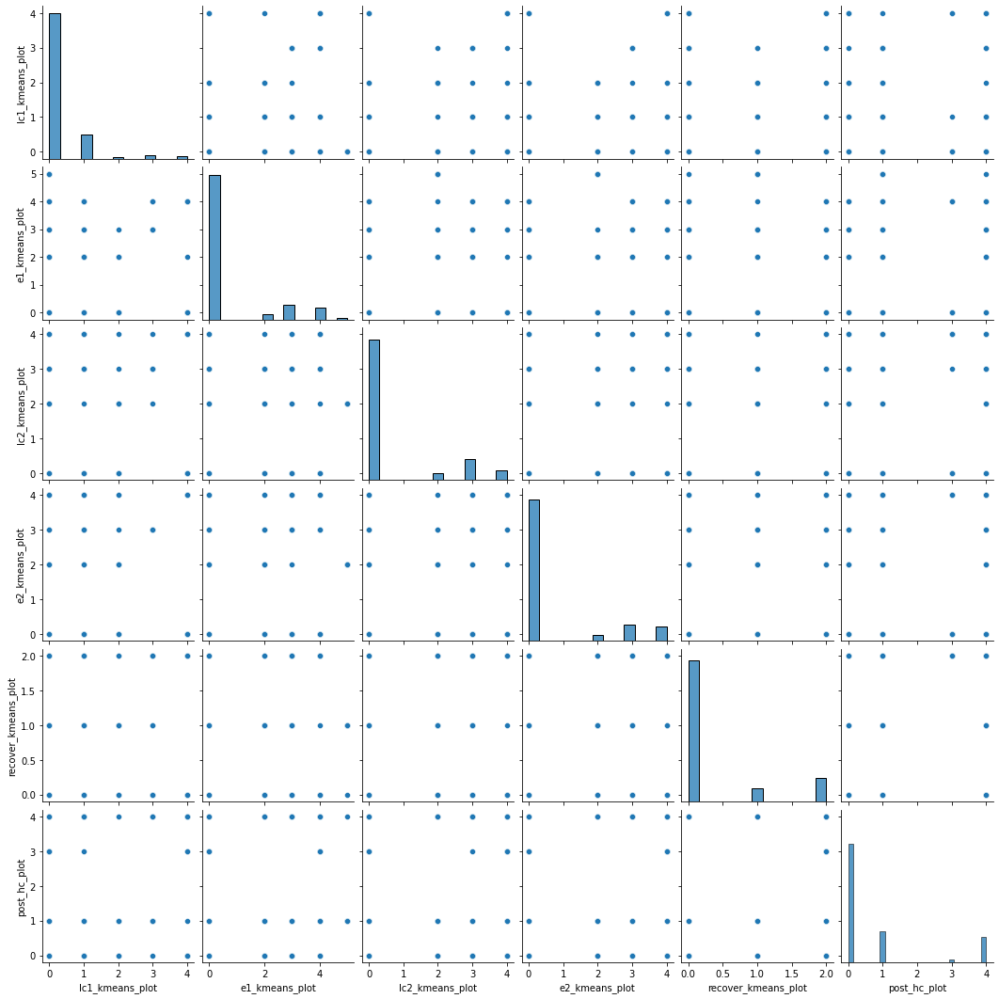

In [210]:
sns.pairplot(cls_new)

In [5]:
# Standardization
# scaler = StandardScaler() 
# scaler.fit(lc1_all_grids_pca) 
# X_scale = scaler.transform(lc1_all_grids_pca)
# df_scale = pd.DataFrame(X_scale, columns=lc1_all_grids_pca.columns,index=lc1_all_grids_pca.index) 
# df_scale.head()

x = cls_pca.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_scale = pd.DataFrame(x_scaled, columns=cls_pca.columns,index=cls_pca.index)
df_scale.head()

,Clusters of Retail Environments during the First Easing Phase(2020.07-2020.10),Clusters of Retail Environments during the First Lockdown(2020.03-2020.06),Clusters of Retail Environments during the Second Lockdown(2020.11-2021.03),Clusters of Retail Environments during the Second Easing Phase(2021.04-2021.07),Clusters of Retail Environments during the Recovering Phase(2021.08-2021.12),Clusters of Retail Environments during the Post-Covid-19Phase(2022.01-2022.05)
id,,,,,,
551,0.0,0.0,0.0,0.0,0.0,0.0
763,0.0,0.0,0.0,0.0,0.0,0.0
774,0.0,0.0,0.0,0.0,0.0,0.0
775,0.0,0.0,0.0,0.0,0.0,0.0
779,0.0,0.0,0.0,0.0,0.0,0.0


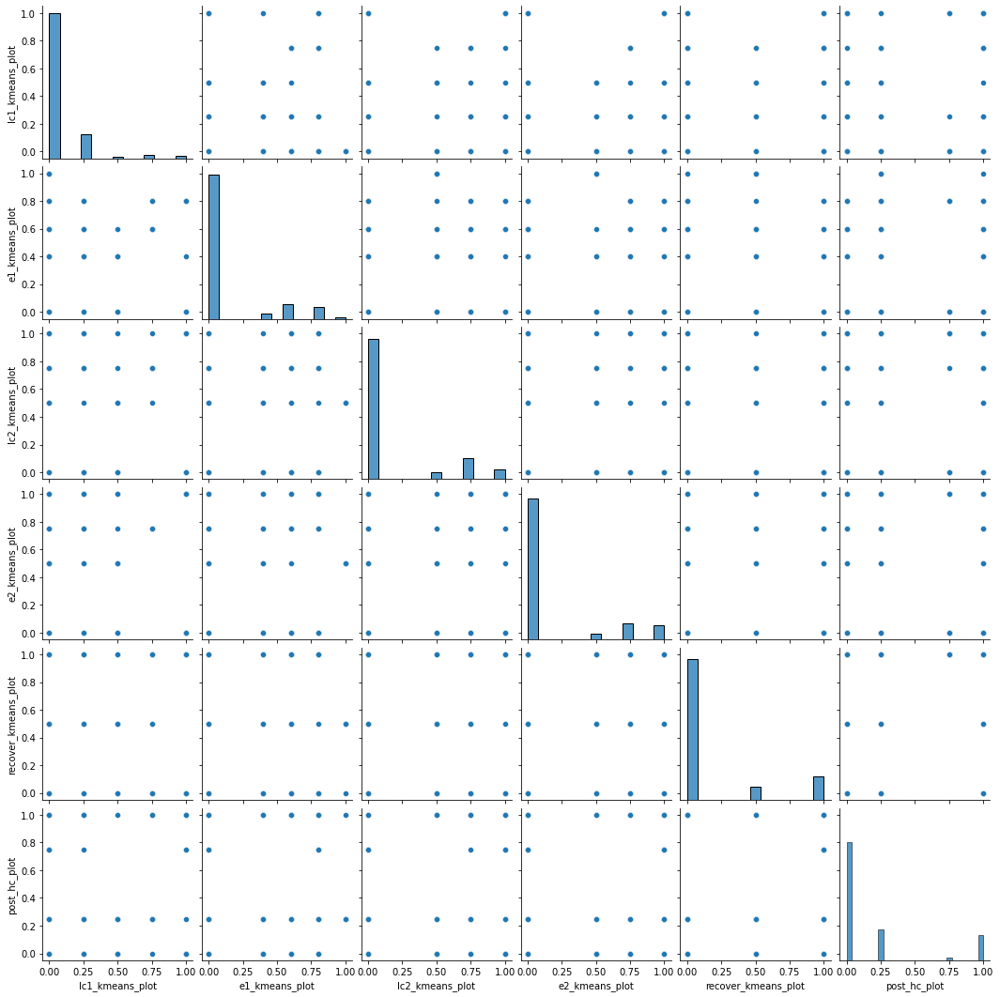

In [211]:
sns.pairplot(df_scale)

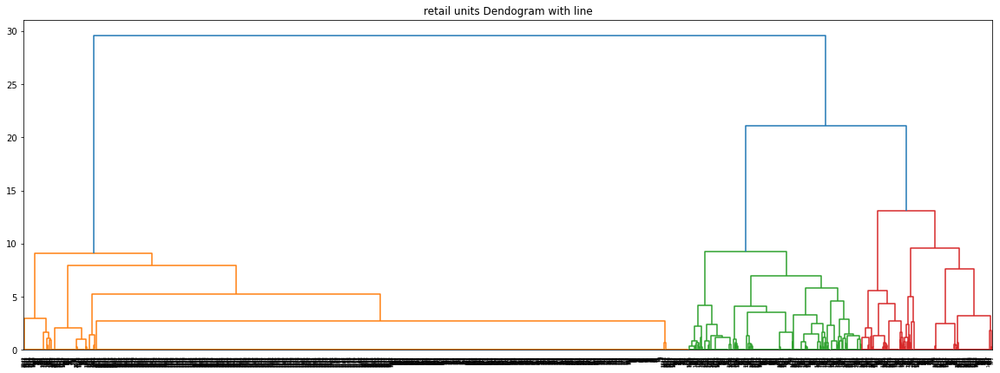

In [234]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(20, 7))
plt.title("retail units Dendogram with line")
clusters = shc.linkage(df_scale, 
            method='ward', 
            metric="euclidean")
shc.dendrogram(clusters)
plt.axhline(y = 125, color = 'r', linestyle = '-')

In [237]:
from sklearn.cluster import AgglomerativeClustering

clustering_model = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
clustering_model.fit(df_scale)
clustering_model.labels_

array([1, 1, 1, ..., 1, 1, 1])

In [238]:
print('Silhouette Score: {}'.format(silhouette_score(df_scale, clustering_model.labels_, metric='euclidean')))

Silhouette Score: 0.681517002639074


In [124]:

s = pd.Series(clustering_model.labels_, index=df_scale.index)
cls=pd.DataFrame([s])
cls.sample()

id,56039,32923,56072,32024,24184,11176,57171,25241,56720,34275,...,31827,21041,32947,11181,15405,14260,83524,83750,13613,33400
0,1,1,1,1,1,1,1,1,1,1,...,2,0,2,2,2,2,2,2,2,0


In [125]:
cls = cls.T
cls.head(5)

,0
id,
56039,1
32923,1
56072,1
32024,1
24184,1


In [126]:
cls = cls.reset_index()
cls.sample(10)

,id,0
442,11799,2
722,11184,0
1383,32498,0
738,11578,0
816,12918,0
1059,19397,0
1299,30698,0
1924,15181,2
1509,58532,0
650,4920,0


In [127]:
recover_cls = cls.merge(recover_all_grids_pca,how='left', on='id')

In [128]:
recover_cls= recover_cls.rename(columns={0: "recover_hc"})

In [129]:
recover_cls

,id,recover_hc,recover_vacantallthetime_ratio,recover_distance,SHDI_recover_open,recover_vacant_ratio_diff_GB,recover_vacant_ratio_diff_London,recover_newvacant_ratio,recover_closed_ratio,recover_open_ratio,recover_newopen_ratio
0,56039,1,0.0,898.370763,0.000000,-0.055151,0.014738,0.0,0.0,1.0,0.0
1,32923,1,0.0,656.503566,0.000000,-0.055151,0.014738,0.0,0.0,1.0,0.0
2,56072,1,0.0,713.060913,0.000000,-0.055151,0.014738,0.0,0.0,1.0,0.0
3,32024,1,0.0,566.930927,0.000000,-0.055151,0.014738,0.0,0.0,1.0,0.0
4,24184,1,0.0,679.977362,0.000000,-0.055151,0.014738,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2057,14260,2,0.0,-511.037516,0.000000,-0.055151,0.014738,0.0,0.0,-1.0,0.0
2058,83524,2,0.0,-792.931852,0.000000,-0.055151,0.014738,0.0,0.0,-1.0,0.0
2059,83750,2,0.0,-839.363067,-0.693147,-0.055151,0.014738,0.0,0.0,-1.0,0.0
2060,13613,2,0.0,-866.037094,-0.693147,-0.055151,0.014738,0.0,0.0,-1.0,0.0


In [142]:
recover_cls.to_csv(r'recover_cls.csv', index= False)

recover_hc
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
Name: recover_closed_ratio, dtype: object

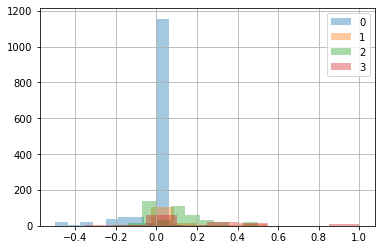

In [168]:
recover_cls.groupby('recover_hc').recover_closed_ratio.hist(alpha=0.4,legend=True)

In [131]:
recover_cls_123 = recover_cls[(recover_cls.recover_hc == 1)|(recover_cls.recover_hc == 2)|(recover_cls.recover_hc == 3)]

recover_hc
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
Name: recover_newvacant_ratio, dtype: object

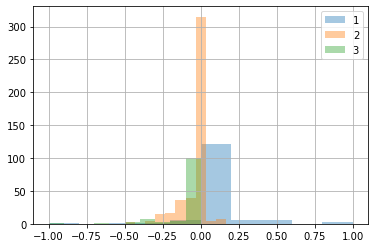

In [170]:
recover_cls_123.groupby('recover_hc').recover_newvacant_ratio.hist(alpha=0.4,legend=True)

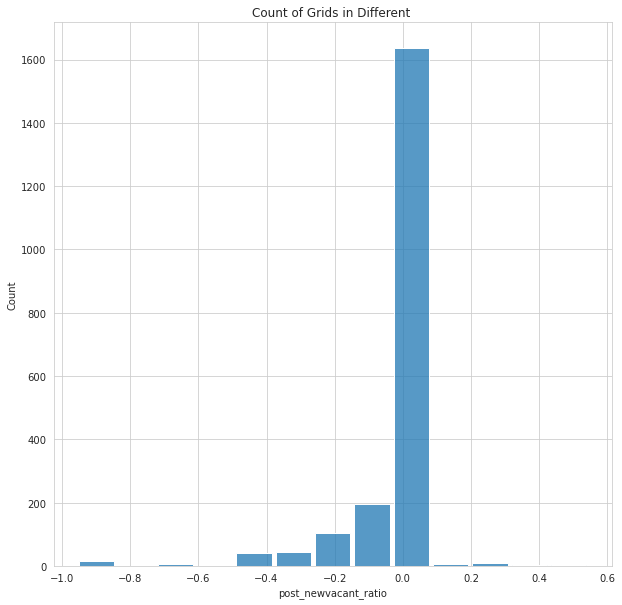

In [19]:
sns.color_palette("Paired")
f, ax = plt.subplots(figsize=(10,10))

ax.set_title('Count of Grids in Different ', fontsize = 12)
sns.set_style("whitegrid")
    

ax = sns.histplot(data=post_all_grids_pca, x='post_newvacant_ratio', multiple="dodge", shrink=.9)
plt.show()

In [562]:
df_scale.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 2062 entries, 56039.0 to 33400.0
Data columns (total 9 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   lc1_vacantallthetime_ratio    2062 non-null   float64
 1   lc1_vacant_ratio_diff_GB      2062 non-null   float64
 2   lc1_vacant_ratio_diff_London  2062 non-null   float64
 3   lc1_newvacant_ratio           2062 non-null   float64
 4   lc1_closed_ratio              2062 non-null   float64
 5   lc1_open_ratio                2062 non-null   float64
 6   lc1_newopen_ratio             2062 non-null   float64
 7   lc1_distance                  2062 non-null   float64
 8   SHDI_lc1_open                 2062 non-null   float64
dtypes: float64(9)
memory usage: 161.1 KB


Text(0, 0.5, 'Inertia')

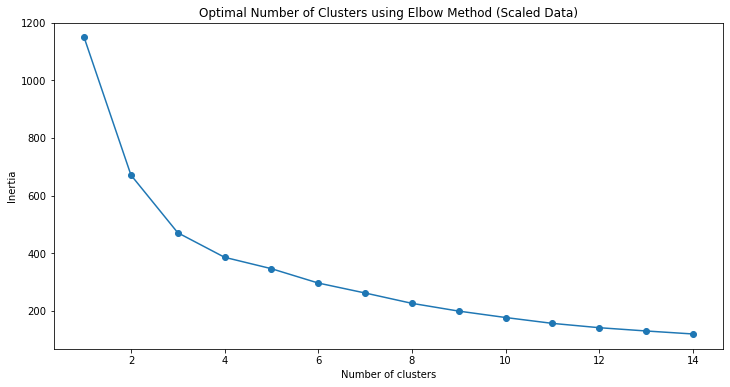

In [6]:
# KMeans on Original Dataset
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(df_scale)
    sse.append([k, km.inertia_])
    
oca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [7]:
df_scale2 = df_scale.copy()
kmeans_scale = KMeans(n_clusters=4, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(df_scale2)

print('KMeans Scaled Silhouette Score: {}'.format(silhouette_score(df_scale2, kmeans_scale.labels_, metric='euclidean')))


KMeans Scaled Silhouette Score: 0.6806012144161203


In [8]:
kmeans_scale
s = pd.Series(kmeans_scale.labels_, index=df_scale2.index)

In [9]:
print(s.value_counts())

0    1427
1     324
3     174
2     137
dtype: int64


In [10]:
cls=pd.DataFrame([s])
cls.sample()

id,551,763,774,775,779,780,987,988,991,1002,...,83728,83729,83733,83744,83750,83952,83953,83970,84195,84419
0,0,0,0,0,0,0,3,3,1,0,...,0,0,0,0,2,0,0,0,0,0


In [11]:
cls = cls.T
cls.head(5)

,0
id,
551,0
763,0
774,0
775,0
779,0


In [12]:
cls = cls.reset_index()
cls.sample(10)

,id,0
519,12916,1
550,13134,0
1534,31149,1
118,3694,0
1080,18956,3
366,11607,0
472,12515,0
243,6510,0
396,11839,0
1363,24313,0


In [13]:
cls_pca_1 = cls.merge(cls_pca,how='left', on='id')

In [14]:
cls_pca_1= cls_pca_1.rename(columns={0: "cls_kmeans"})
cls_pca_1.sample()
cls_pca_1.to_csv(r'cls_pca_1.csv', index= False)

cls_kmeans
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_kmeans_plot, dtype: object

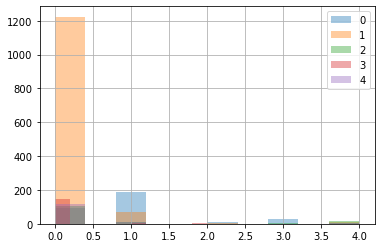

In [194]:
cls_new_1.groupby('cls_kmeans').lc1_kmeans_plot.hist(alpha=0.4,legend=True)

cls_kmeans
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
Name: e1_kmeans_plot, dtype: object

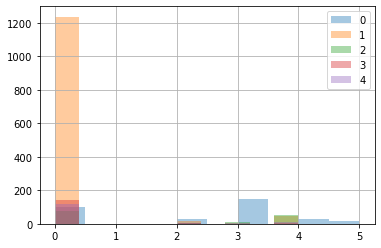

In [195]:
cls_new_1.groupby('cls_kmeans').e1_kmeans_plot.hist(alpha=0.4,legend=True)

In [1001]:
post_cls= post_cls.rename(columns={0: "post_kmeans"})
post_cls.to_csv(r'post_cls.csv', index= False)
post_cls.describe()

,id,post_kmeans,post_vacantallthetime_ratio,post_distance,SHDI_post_open,post_vacant_ratio_diff_GB,post_vacant_ratio_diff_London,post_newvacant_ratio,post_closed_ratio,post_open_ratio,post_newopen_ratio
count,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000
mean,22861.887973,0.133851,0.032908,4.975117,-0.032151,0.020559,0.085518,-0.048137,-0.001563,-0.019362,-0.009525
std,17117.614123,0.340574,0.214975,102.179377,0.249617,0.175051,0.175051,0.135887,0.122836,0.312882,0.181029
min,551.000000,0.000000,-1.000000,-866.037094,-2.025326,-0.551351,-0.486392,-1.000000,-0.500000,-1.000000,-1.000000
25%,12908.500000,0.000000,0.000000,0.000000,0.000000,-0.051351,0.013608,0.000000,0.000000,-0.026250,0.000000
50%,18286.500000,0.000000,0.000000,0.000000,0.000000,-0.051351,0.013608,0.000000,0.000000,0.000000,0.000000
75%,31357.750000,0.000000,0.001111,0.000000,0.000000,0.031983,0.096942,0.000000,0.000000,0.000000,0.000000
max,84419.000000,1.000000,1.000000,898.370763,1.098612,0.948649,1.013608,0.500000,1.000000,1.000000,1.000000


In [863]:
lc2_cls= lc2_cls.rename(columns={0: "lc2_kmeans"})
lc2_cls.to_csv(r'lc2_cls.csv', index= False)
lc2_cls.describe()

,id,lc2_kmeans,lc2_vacantallthetime_ratio,lc2_distance,SHDI_lc2_open,lc2_vacant_ratio_diff_GB,lc2_vacant_ratio_diff_London,lc2_newvacant_ratio,lc2_closed_ratio,lc2_open_ratio,lc2_newopen_ratio
count,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000
mean,22861.887973,1.210960,0.000844,3.140277,-0.022009,-0.032537,0.035331,-0.047229,0.009518,0.010615,-0.022648
std,17117.614123,0.714184,0.131299,72.790490,0.192383,0.098052,0.098052,0.135516,0.139268,0.234218,0.178613
min,551.000000,0.000000,-1.000000,-866.037094,-2.025326,-0.550130,-0.482262,-1.000000,-0.500000,-1.000000,-1.000000
25%,12908.500000,1.000000,0.000000,0.000000,0.000000,-0.050130,0.017738,0.000000,0.000000,0.000000,0.000000
50%,18286.500000,1.000000,0.000000,0.000000,0.000000,-0.050130,0.017738,0.000000,0.000000,0.000000,0.000000
75%,31357.750000,1.000000,0.000000,0.000000,0.000000,-0.050130,0.017738,0.000000,0.000000,0.000000,0.000000
max,84419.000000,3.000000,1.000000,898.370763,1.098612,0.949870,1.017738,0.500000,1.000000,1.000000,1.000000


In [708]:
#lc1_cls= lc1_cls.rename(columns={'lc1_cls': "lc1_kmeans"})
#lc1_cls.to_csv(r'lc1_cls.csv', index= True)
lc1_cls.describe()

,id,lc1_kmeans,lc1_vacantallthetime_ratio,lc1_distance,SHDI_lc1_open,lc1_vacant_ratio_diff_GB,lc1_vacant_ratio_diff_London,lc1_newvacant_ratio,lc1_closed_ratio,lc1_open_ratio,lc1_newopen_ratio
count,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000
mean,22861.887973,0.279340,0.002235,0.589083,-0.005515,0.000934,-0.000851,-0.047442,-0.014094,0.012689,-0.039783
std,17117.614123,0.732254,0.070733,19.121144,0.085242,0.060953,0.060953,0.139053,0.117755,0.121972,0.147676
min,551.000000,0.000000,-1.000000,-9.611550,-0.693147,-0.500732,-0.502517,-1.000000,-0.500000,-1.000000,-1.000000
25%,12908.500000,0.000000,0.000000,0.000000,0.000000,-0.000732,-0.002517,0.000000,0.000000,0.000000,0.000000
50%,18286.500000,0.000000,0.000000,0.000000,0.000000,-0.000732,-0.002517,0.000000,0.000000,0.000000,0.000000
75%,31357.750000,0.000000,0.000000,0.000000,0.000000,-0.000732,-0.002517,0.000000,0.000000,0.000000,0.000000
max,84419.000000,4.000000,0.500000,656.503566,1.098612,0.665935,0.664149,0.666667,1.000000,1.000000,1.000000


In [829]:
lc1_cls_1 = lc1_cls[(lc1_cls.lc1_kmeans == 1)]
lc1_cls_1.describe()

,id,lc1_kmeans,lc1_vacantallthetime_ratio,lc1_distance,SHDI_lc1_open,lc1_vacant_ratio_diff_GB,lc1_vacant_ratio_diff_London,lc1_newvacant_ratio,lc1_closed_ratio,lc1_open_ratio,lc1_newopen_ratio
count,280.000000,280.0,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000
mean,18412.507143,1.0,0.032698,-0.026641,0.000666,-0.038579,-0.040365,-0.224552,-0.193667,0.160290,-0.220190
std,11269.009450,0.0,0.075895,2.072457,0.038935,0.099693,0.099693,0.112701,0.126198,0.119291,0.111731
min,1675.000000,1.0,-0.083333,-9.611550,-0.209334,-0.500732,-0.502517,-0.500000,-0.500000,-0.030000,-0.500000
25%,12954.000000,1.0,0.000000,-0.945160,0.000000,-0.051501,-0.053286,-0.270000,-0.250000,0.095000,-0.262500
50%,14716.500000,1.0,0.003333,0.000000,0.000000,-0.000732,-0.002517,-0.200000,-0.170000,0.140000,-0.200000
75%,22063.000000,1.0,0.030769,0.909469,0.000000,-0.000732,-0.002517,-0.140000,-0.130000,0.195348,-0.140000
max,81924.000000,1.0,0.500000,9.561570,0.405465,0.169268,0.167483,0.000000,0.030000,0.500000,0.000000


In [830]:
lc1_cls_0 = lc1_cls[(lc1_cls.lc1_kmeans == 0)]
lc1_cls_0.describe()

,id,lc1_kmeans,lc1_vacantallthetime_ratio,lc1_distance,SHDI_lc1_open,lc1_vacant_ratio_diff_GB,lc1_vacant_ratio_diff_London,lc1_newvacant_ratio,lc1_closed_ratio,lc1_open_ratio,lc1_newopen_ratio
count,1688.000000,1688.0,1688.000000,1688.000000,1688.000000,1688.000000,1688.000000,1688.000000,1688.000000,1688.000000,1688.000000
mean,23466.712678,0.0,0.000243,0.731599,-0.001982,0.000529,-0.001256,-0.008234,0.001742,-0.000871,-0.002678
std,18035.746208,0.0,0.019649,21.113659,0.042312,0.015966,0.015966,0.036374,0.038682,0.053146,0.056288
min,551.000000,0.0,-0.200000,-5.921681,-0.432059,-0.124065,-0.125851,-0.500000,-0.330000,-0.500000,-0.250000
25%,12727.500000,0.0,0.000000,0.000000,0.000000,-0.000732,-0.002517,0.000000,0.000000,0.000000,0.000000
50%,18733.500000,0.0,0.000000,0.000000,0.000000,-0.000732,-0.002517,0.000000,0.000000,0.000000,0.000000
75%,31579.250000,0.0,0.000000,0.000000,0.000000,-0.000732,-0.002517,0.000000,0.000000,0.000000,0.000000
max,84419.000000,0.0,0.500000,656.503566,0.636514,0.249268,0.247483,0.166667,0.333333,1.000000,1.000000


AttributeError: 'AxesSubplot' object has no attribute 'subplot'

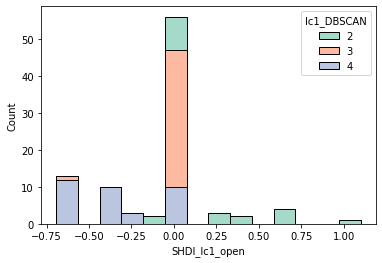

In [780]:

import matplotlib.gridspec as gridspec
gs = gridspec.GridSpec(3, 3)
ax1 = sns.histplot(data=lc1_cls_234, x="SHDI_lc1_open", hue="lc1_DBSCAN",multiple="stack",alpha=.6,palette="Set2").subplot(gs[0, :])
ax2 = plt.subplot(gs[1,:-1])
ax3 = plt.subplot(gs[1:, -1])
ax4 = plt.subplot(gs[-1,0])
ax5 = plt.subplot(gs[-1,-2])

<AxesSubplot:xlabel='SHDI_lc1_open', ylabel='Count'>

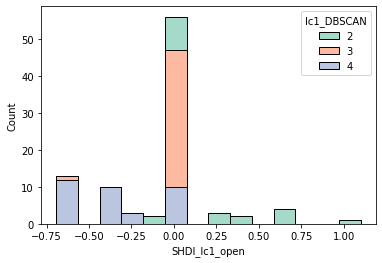

In [772]:
sns.histplot(data=lc1_cls_234, x="SHDI_lc1_open", hue="lc1_DBSCAN",multiple="stack",alpha=.6,palette="Set2") #,multiple="stack"

In [1002]:
#lc1_cls_1234 = lc1_cls[(lc1_cls.lc1_kmeans == 1)|(lc1_cls.lc1_kmeans == 2)|(lc1_cls.lc1_kmeans == 3)|(lc1_cls.lc1_kmeans == 4)]
#lc1_cls_234_sp = lc1_cls_sp[(lc1_cls_sp.lc1_DBSCAN == 2)|(lc1_cls_sp.lc1_DBSCAN == 3)|(lc1_cls_sp.lc1_DBSCAN == 4)]

#lc2_cls_1 = lc2_cls[(lc2_cls.lc2_kmeans == 1)]
#e1_cls_0234 = e1_cls[(e1_cls.e1_kmeans == 0)|(e1_cls.e1_kmeans == 2)|(e1_cls.e1_kmeans == 3)|(e1_cls.e1_kmeans == 4)]
#e2_cls_012 = e2_cls[(e2_cls.e2_kmeans == 0)|(e2_cls.e2_kmeans == 2)|(e2_cls.e2_kmeans == 1)]
# recover_cls_12 = recover_cls[(recover_cls.recover_kmeans ==1 )|(recover_cls.recover_kmeans == 2)]

post_cls_1 = post_cls[(post_cls.post_kmeans ==1)]

lc2_kmeans
1    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc2_distance, dtype: object

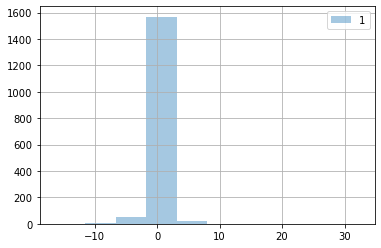

In [922]:
lc2_cls_1.groupby('lc2_kmeans').lc2_distance.hist(alpha=0.4,legend=True)

post_kmeans
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
Name: post_vacant_ratio_diff_London, dtype: object

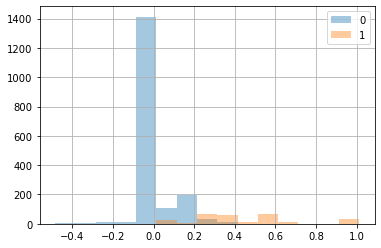

In [1014]:
post_cls.groupby('post_kmeans').post_vacant_ratio_diff_London.hist(alpha=0.4,legend=True)

lc1_DBSCAN
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_closed_ratio, dtype: object

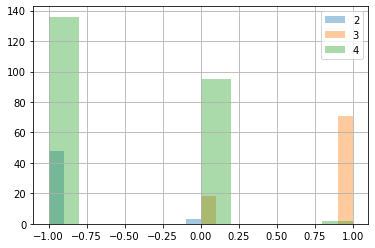

In [576]:
lc1_cls_234_sp.groupby('lc1_DBSCAN').lc1_closed_ratio.hist(alpha=0.4,legend=True)

lc1_kmeans
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_distance, dtype: object

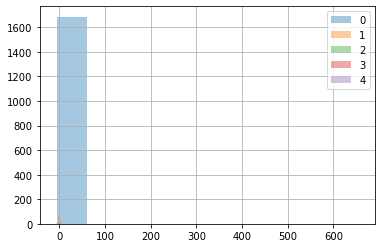

In [790]:
#lc1_cls_1234.groupby('lc1_kmeans').SHDI_lc1_open.hist(alpha=0.6,legend=True)
# lc1_cls_1234.groupby('lc1_kmeans').lc1_closed_ratio.hist(alpha=0.4,legend=True)
# lc1_cls_234.groupby('lc1_DBSCAN').lc1_vacantallthetime_ratio.hist(alpha=0.4,legend=True)
#lc1_cls_1234.groupby('lc1_kmeans').lc1_newvacant_ratio.hist(alpha=0.4,legend=True)
lc1_cls.groupby('lc1_kmeans').lc1_distance.hist(alpha=0.4,legend=True)

lc1_kmeans
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_open_ratio, dtype: object

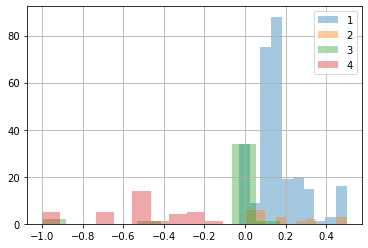

In [742]:
#
lc1_cls_1234.groupby('lc1_kmeans').lc1_open_ratio.hist(alpha=0.4,legend=True)

lc1_kmeans
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_newopen_ratio, dtype: object

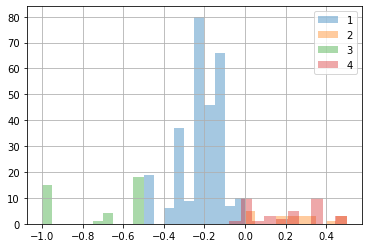

In [712]:
lc1_cls_1234.groupby('lc1_kmeans').lc1_newopen_ratio.hist(alpha=0.4,legend=True)

lc1_kmeans
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
Name: SHDI_lc1_open, dtype: object

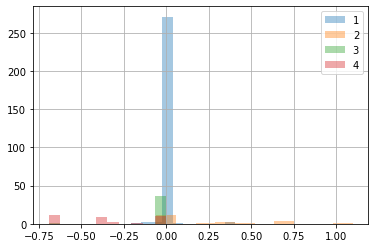

In [713]:
# lc1_cls_1234.groupby('lc1_kmeans').SHDI_lc1_open.hist(alpha=0.4,legend=True)

lc1_kmeans
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_vacant_ratio_diff_GB, dtype: object

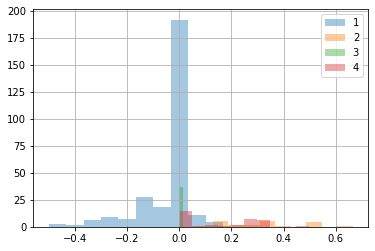

In [733]:
lc1_cls_1234.groupby('lc1_kmeans').lc1_vacant_ratio_diff_GB.hist(alpha=0.4,legend=True)

lc1_kmeans
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_vacant_ratio_diff_London, dtype: object

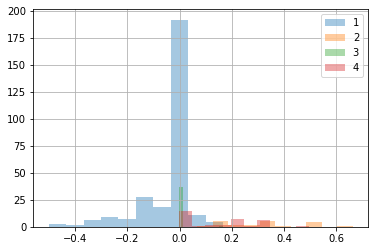

In [739]:
lc1_cls_1234.groupby('lc1_kmeans').lc1_vacant_ratio_diff_London.hist(alpha=0.4,legend=True)

lc1_DBSCAN
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_vacantallthetime_ratio, dtype: object

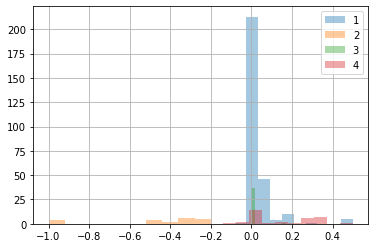

In [603]:
lc1_cls_1234.groupby('lc1_DBSCAN').lc1_vacantallthetime_ratio.hist(alpha=0.4,legend=True)

lc1_DBSCAN
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_newvacant_ratio, dtype: object

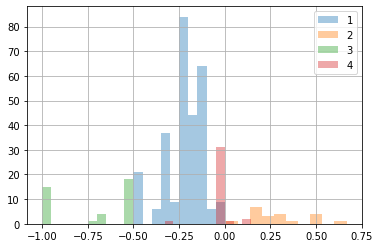

In [602]:
lc1_cls_1234.groupby('lc1_DBSCAN').lc1_newvacant_ratio.hist(alpha=0.4,legend=True)

lc1_DBSCAN
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_open_ratio, dtype: object

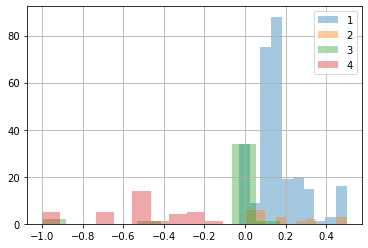

In [601]:
lc1_cls_1234.groupby('lc1_DBSCAN').lc1_open_ratio.hist(alpha=0.4,legend=True)

lc1_kmeans
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
Name: SHDI_lc1_open, dtype: object

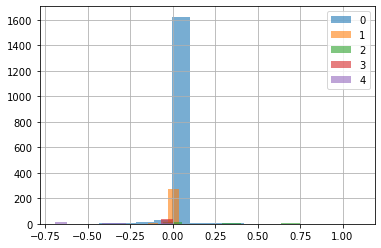

In [705]:
#lc1_cls.groupby('lc1_DBSCAN').plot(kind='hist',title=i,alpha=0.6)[1] and plt.legend() and plt.show() #for i in 'ABCD']

lc1_cls.groupby('lc1_kmeans').SHDI_lc1_open.hist(alpha=0.6,legend=True)

<AxesSubplot:xlabel='SHDI_lc1_open', ylabel='Count'>

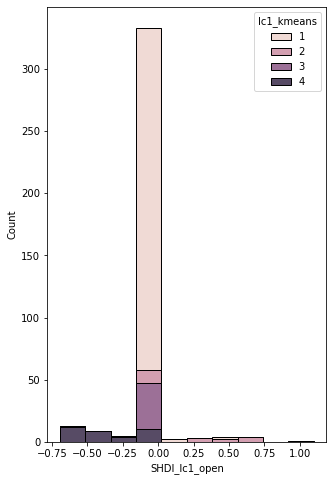

In [704]:
fig, axes = plt.subplots(figsize=(5, 8))
sns.histplot(data=lc1_cls_1234, x="SHDI_lc1_open", hue="lc1_kmeans",multiple="stack",alpha=.8)

lc1_DBSCAN
0    [[AxesSubplot(0.125,0.725918;0.215278x0.154082...
1    [[AxesSubplot(0.125,0.725918;0.215278x0.154082...
2    [[AxesSubplot(0.125,0.725918;0.215278x0.154082...
3    [[AxesSubplot(0.125,0.725918;0.215278x0.154082...
4    [[AxesSubplot(0.125,0.725918;0.215278x0.154082...
dtype: object

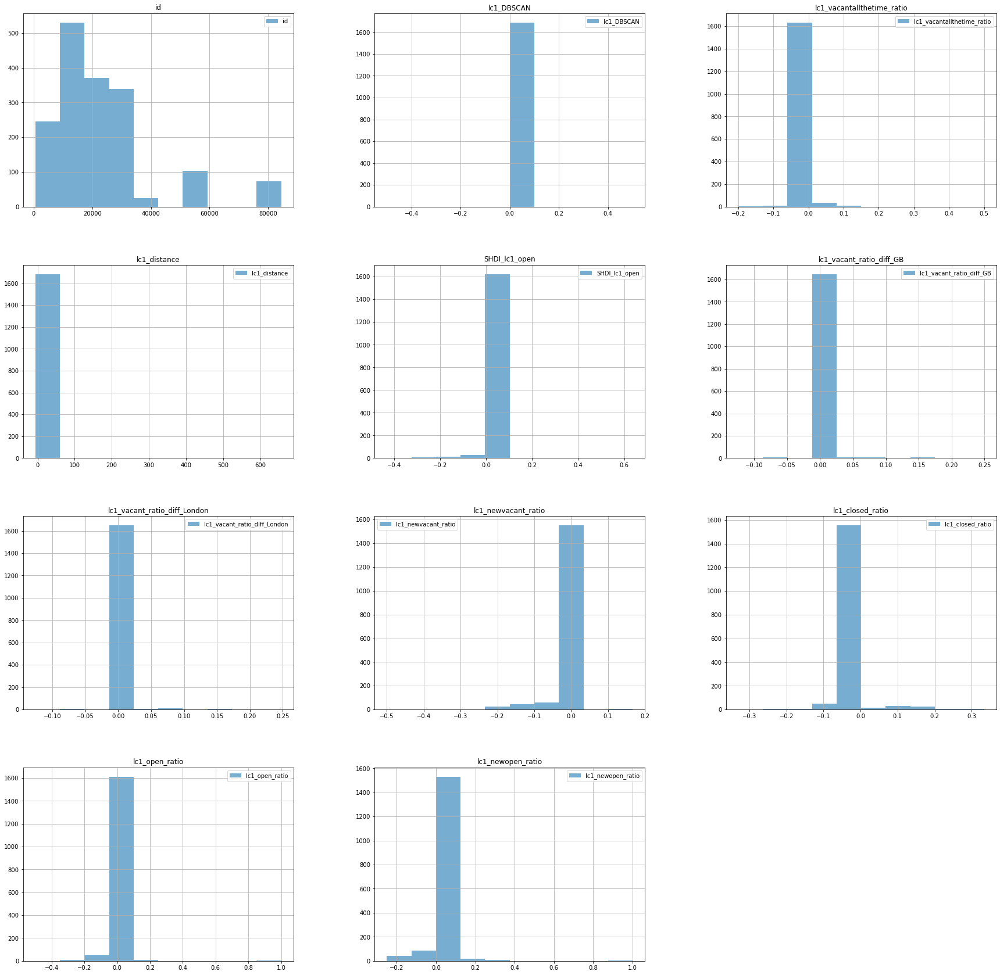

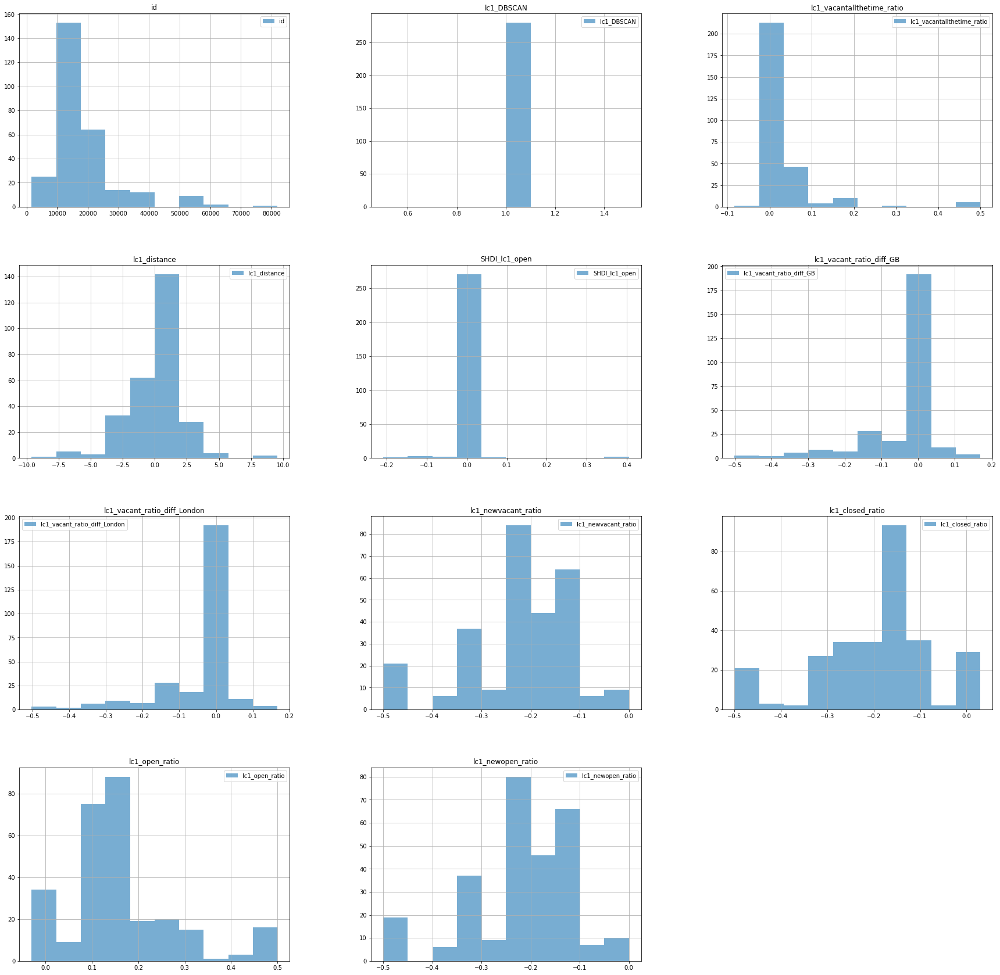

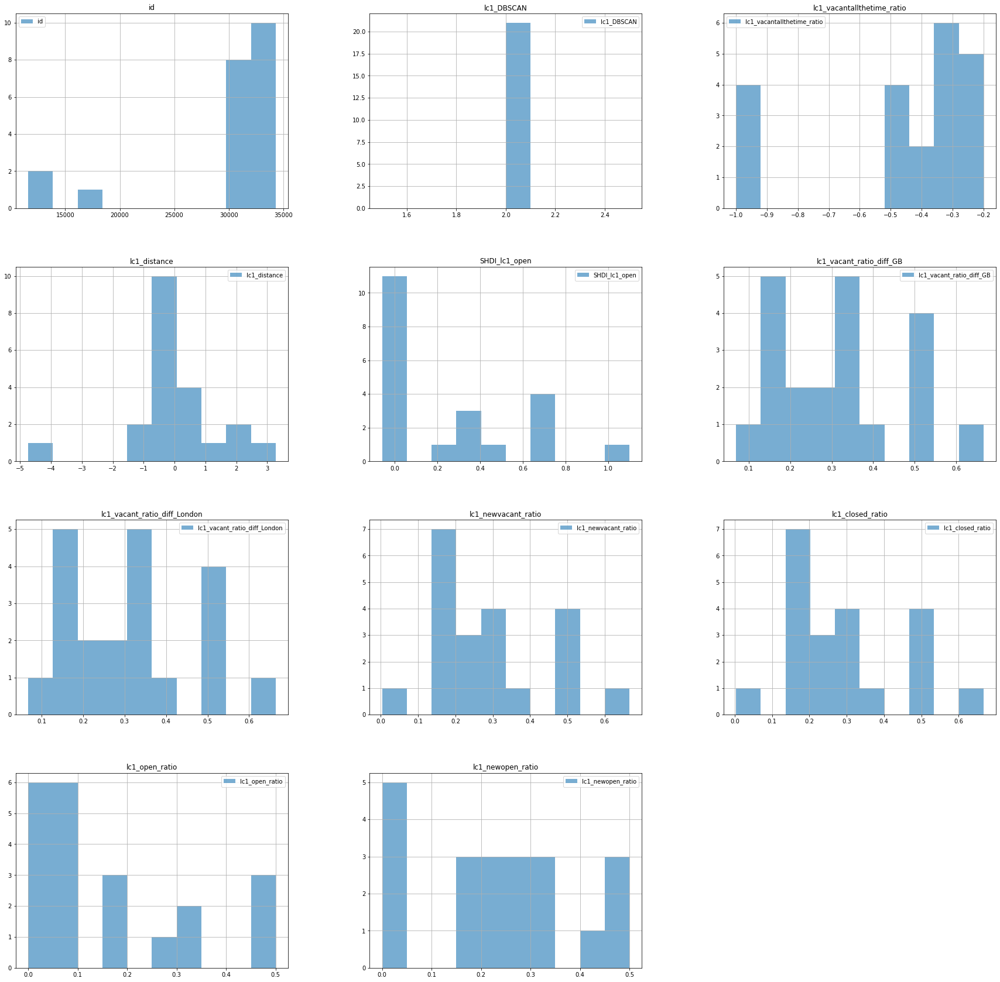

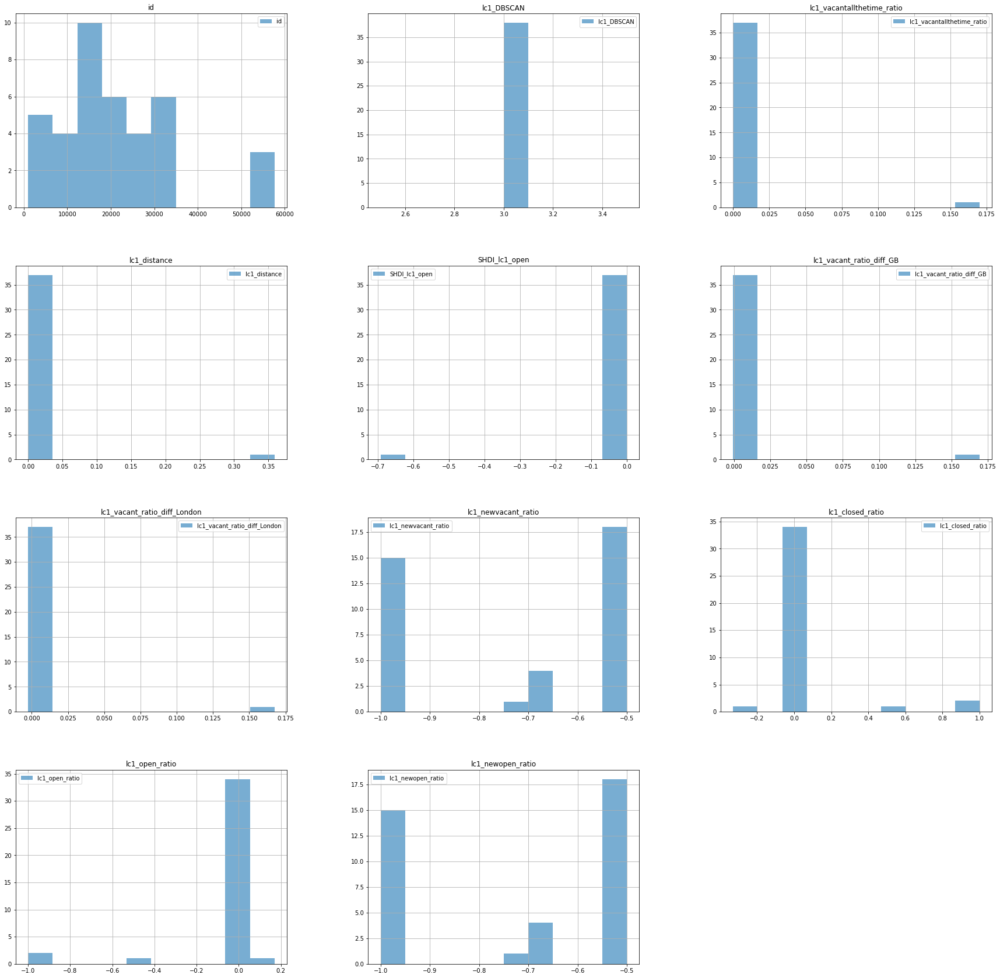

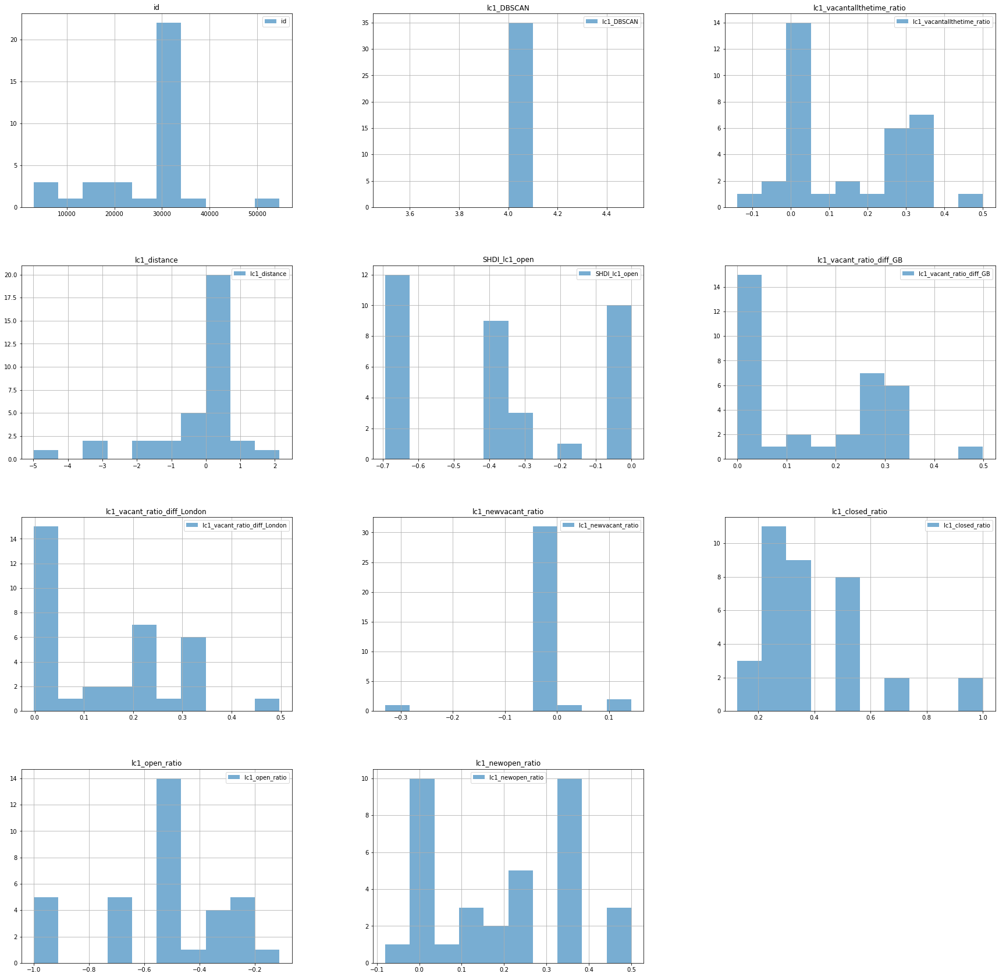

In [674]:
lc1_cls.groupby('lc1_DBSCAN').hist(alpha=0.6,legend=True,figsize=(30,30))

In [38]:
grid = gpd.read_file('geo/grids.shp')
grid = grid.to_crs('epsg:27700')

In [40]:
station = gpd.read_file('geo/station.shp')
station = station.to_crs('epsg:27700')
station = station.replace('Kings Cross St. Pancras','St. Pancras')

In [223]:
# e1_cls_plot = pd.read_csv('e1_cls.csv')
# e1_cls_plot.sample()

# lc1_cls_plot = pd.read_csv('lc1_cls.csv')
# lc1_cls_plot.sample()

# lc2_cls_plot = pd.read_csv('lc2_cls.csv')
# lc2_cls_plot.sample()

# e2_cls_plot = pd.read_csv('e2_cls.csv')
# e2_cls_plot.sample()

# recover_cls_plot = pd.read_csv('recover_cls.csv')
# recover_cls_plot.sample()

# post_cls_plot = pd.read_csv('post_cls.csv')
# post_cls_plot.sample()

cls_new_1_plot = pd.read_csv('cls_new_1.csv')
cls_new_1_plot.sample()

,id,cls_kmeans,color,lc1_kmeans_plot,e1_kmeans_plot,lc2_kmeans_plot,e2_kmeans_plot,recover_kmeans_plot,post_hc_plot
2027,82614,3,#A1CBE3,0,0,0,0,2,0


In [250]:
# post_cls_geo = post_cls_plot.merge(grid,on='id')
# post_cls_geo = gpd.GeoDataFrame(post_cls_geo, geometry='geometry', crs='EPSG:27700')
# recover_cls_geo = recover_cls_plot.merge(grid,on='id')
# recover_cls_geo = gpd.GeoDataFrame(recover_cls_geo, geometry='geometry', crs='EPSG:27700')
# e2_cls_geo = e2_cls_plot.merge(grid,on='id')
# e2_cls_geo = gpd.GeoDataFrame(e2_cls_geo, geometry='geometry', crs='EPSG:27700')
# lc1_cls_geo = lc1_cls.merge(grid,on='id')
# lc1_cls_geo = gpd.GeoDataFrame(lc1_cls_geo, geometry='geometry', crs='EPSG:27700')
# e1_cls_geo = e1_cls_plot.merge(grid,on='id')
# e1_cls_geo = gpd.GeoDataFrame(e1_cls_geo, geometry='geometry', crs='EPSG:27700')

cls_pca_1_geo = cls_pca_1.merge(grid,on='id')
cls_pca_1_geo = gpd.GeoDataFrame(cls_pca_1_geo, geometry='geometry', crs='EPSG:27700')

In [252]:
cls_pca_1_geo.sample()

,id,cls_kmeans,Clusters of Retail Environments during the First Easing Phase(2020.07-2020.10),Clusters of Retail Environments during the First Lockdown(2020.03-2020.06),Clusters of Retail Environments during the Second Lockdown(2020.11-2021.03),Clusters of Retail Environments during the Second Easing Phase(2021.04-2021.07),Clusters of Retail Environments during the Recovering Phase(2021.08-2021.12),Clusters of Retail Environments during the Post-Covid-19Phase(2022.01-2022.05),left,top,right,bottom,geometry
716,13868,0,0,1,3,0,0,0,529074.753934,178862.238032,529124.753934,178812.238032,"POLYGON ((529074.754 178862.238, 529124.754 17..."


cls_kmeans
0    [[AxesSubplot(0.125,0.670278;0.215278x0.209722...
1    [[AxesSubplot(0.125,0.670278;0.215278x0.209722...
2    [[AxesSubplot(0.125,0.670278;0.215278x0.209722...
3    [[AxesSubplot(0.125,0.670278;0.215278x0.209722...
4    [[AxesSubplot(0.125,0.670278;0.215278x0.209722...
dtype: object

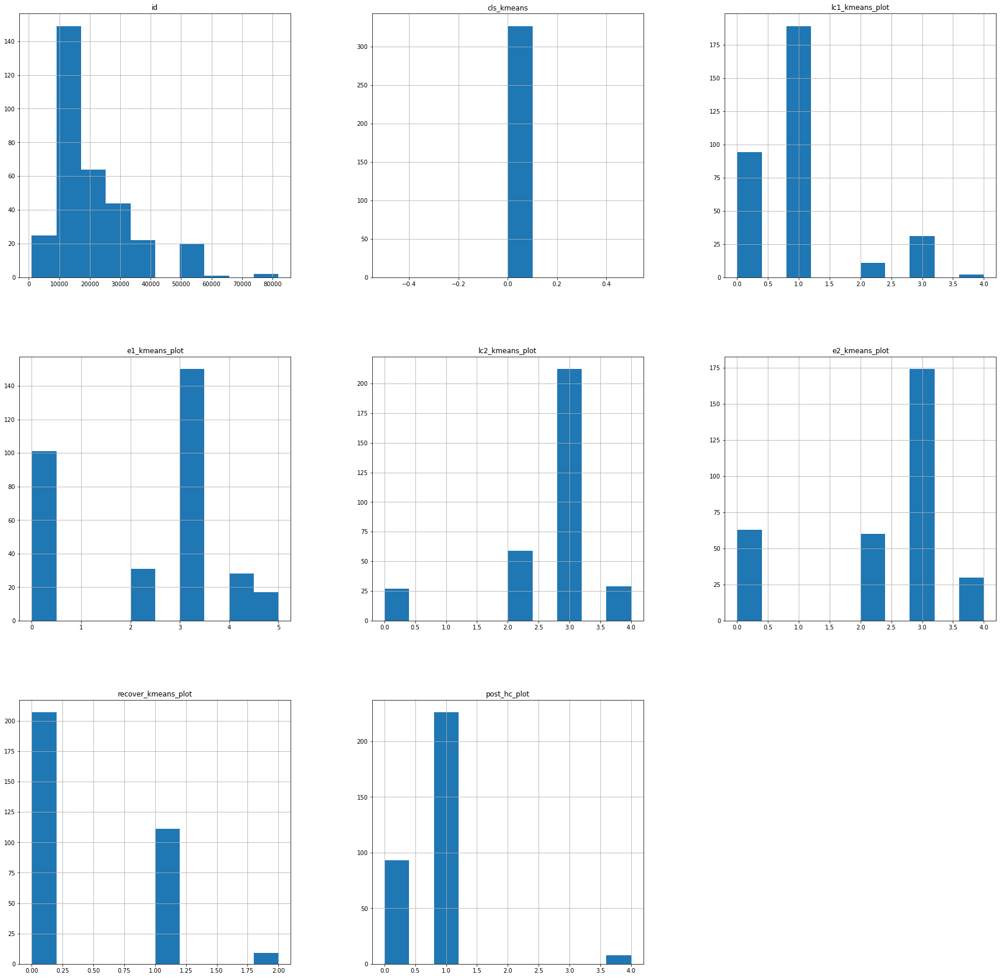

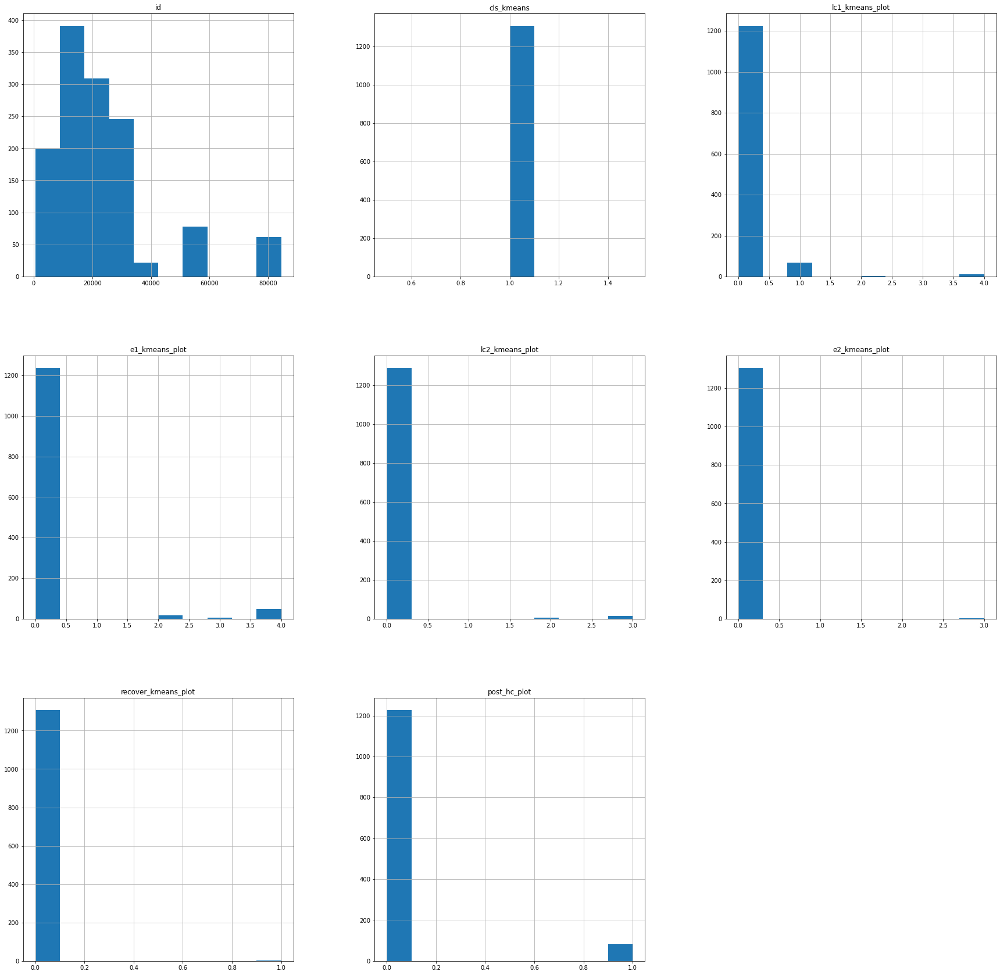

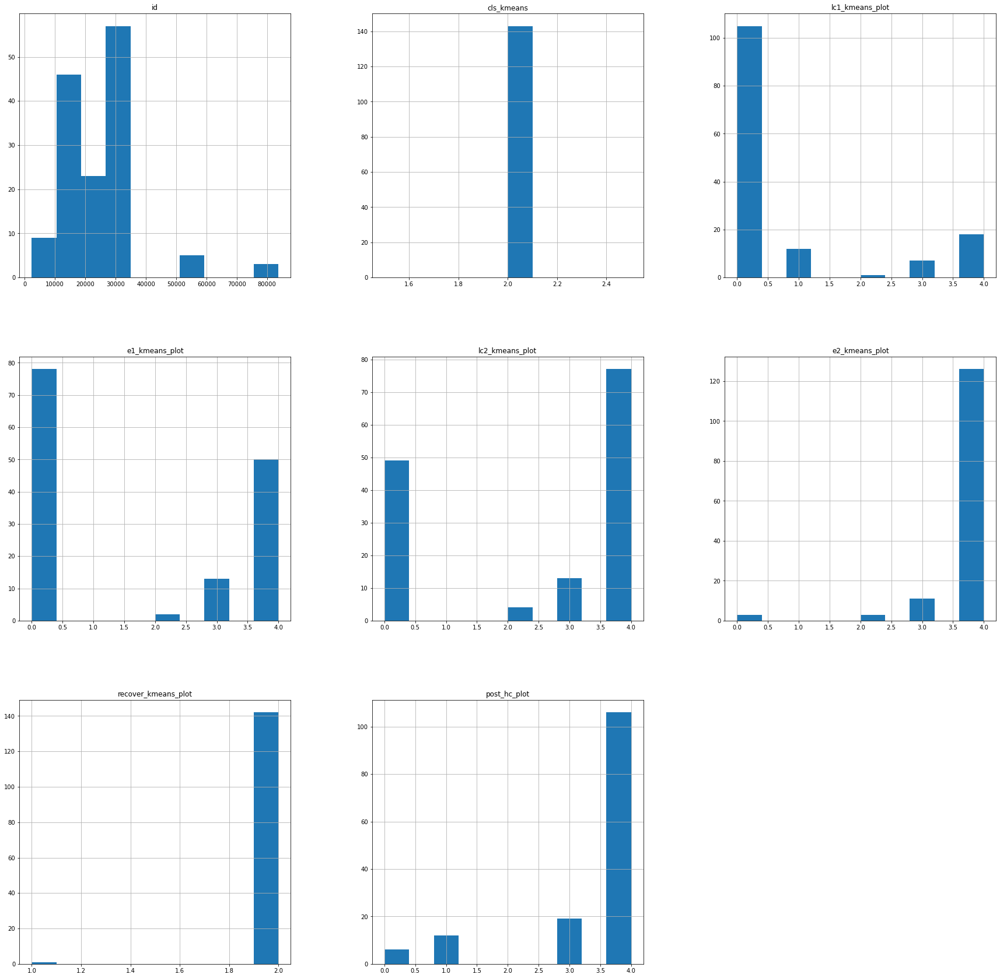

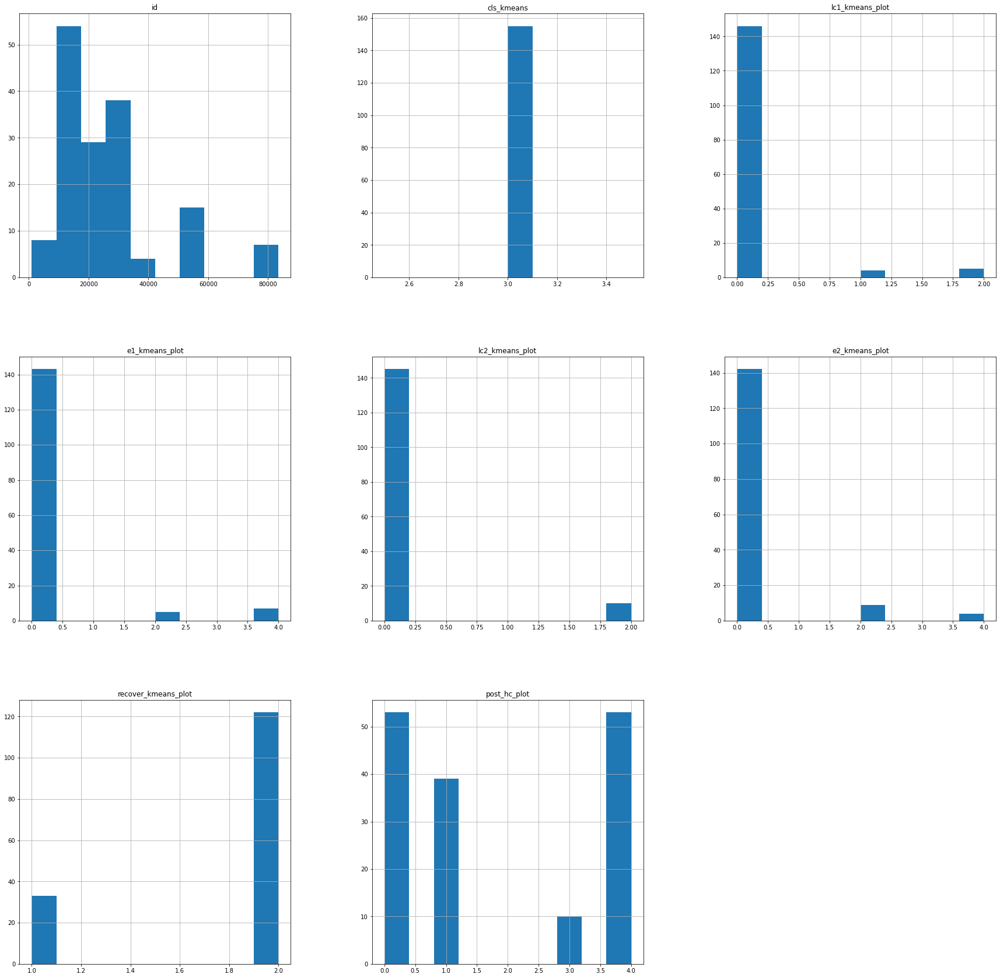

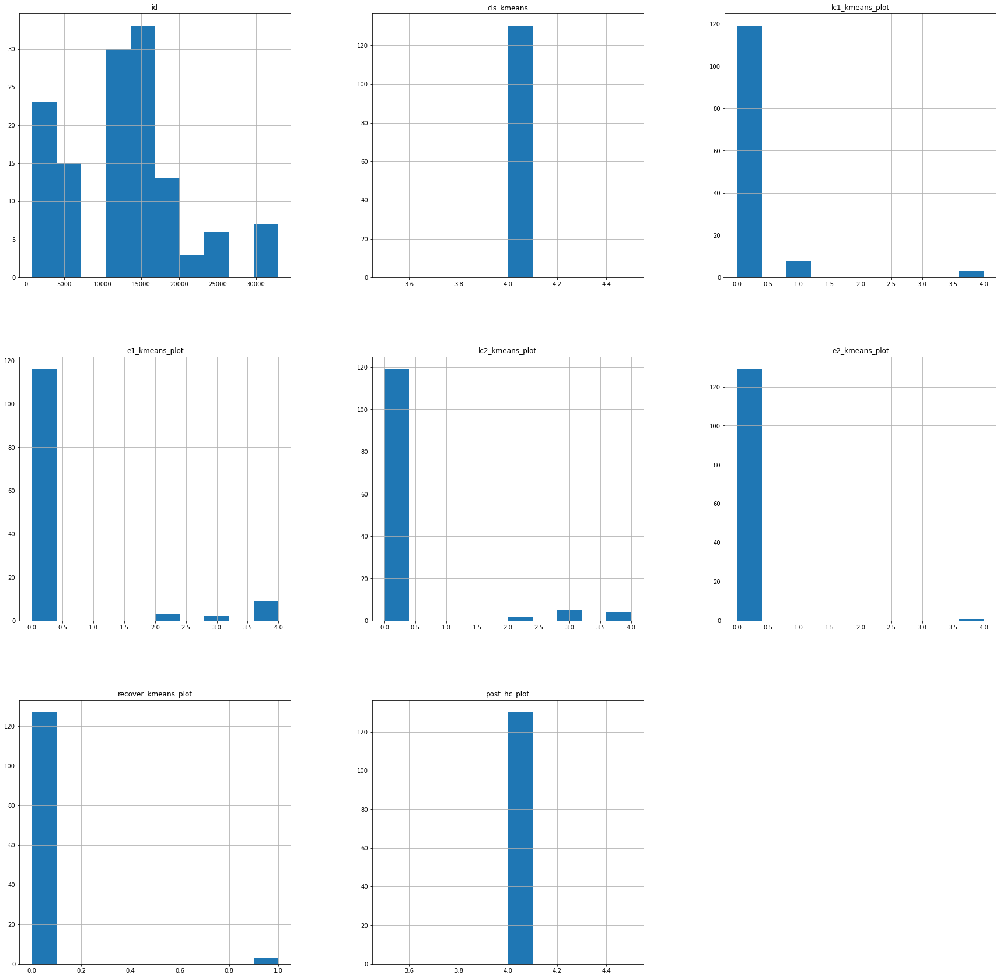

In [208]:
cls_new_1.groupby('cls_kmeans').hist(figsize=(30,30))

(525189.7539341656, 545759.7539341656, 174219.738032385, 186154.738032385)

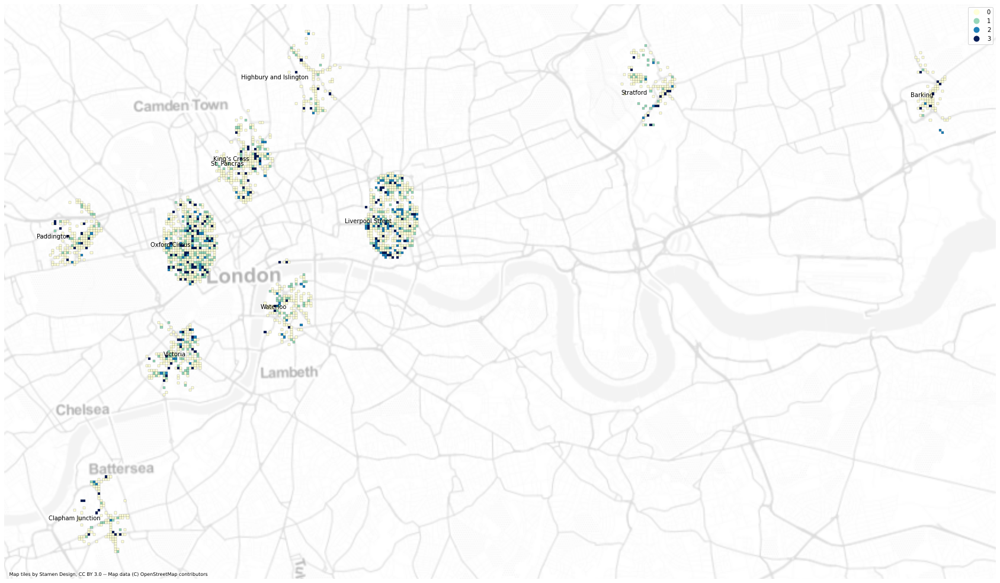

In [255]:

ax =cls_pca_1_geo.plot(figsize=(30,20), column='cls_kmeans', edgecolor="black", categorical=True,cmap='YlGnBu', 
                      linewidth = 0.15,legend=True);
#ax.set_title('Clusters of Retail Enviornments during the Post-Covid-19 Phrase(2022.01-2022.05)',fontsize=30)
cx.add_basemap(ax,zoom=12, crs=cls_pca_1_geo.crs.to_string(),source=cx.providers.Stamen.TonerLite, alpha=0.3)
station.apply(lambda x: ax.annotate(text=x['Station'], xy=x.geometry.centroid.coords[0], va="top",ha='right'),axis=1);

ax.axis('off')

/opt/conda/envs/sds2021/lib/python3.9/site-packages/geopandas/plotting.py:641: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


(525189.7539341656, 545759.7539341656, 174219.738032385, 186154.738032385)

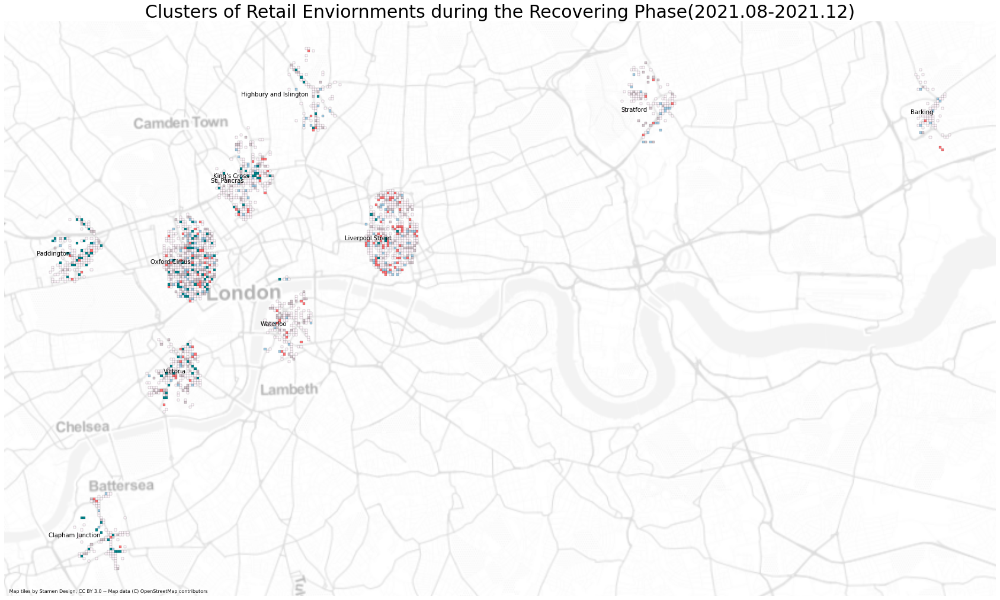

In [227]:
ax = cls_new_1_geo.plot(figsize=(30,20), column='cls_kmeans',edgecolor="black",color=cls_new_1_geo['color'],
                      linewidth = 0.15,legend=True,legend_kwds={'loc': 4});
ax.set_title('Clusters of Retail Enviornments during the Recovering Phase(2021.08-2021.12)',fontsize=30)
cx.add_basemap(ax,zoom=12, crs=cls_new_1_geo.crs.to_string(),source=cx.providers.Stamen.TonerLite, alpha=0.3)
station.apply(lambda x: ax.annotate(text=x['Station'], xy=x.geometry.centroid.coords[0], va="top",ha='right'),axis=1);

ax.axis('off')
#img=ax.get_figure()
#img.savefig('Clusters of Retail Enviornments during the Recovering Phase(2021.08-2021.12).jpg', format='jpg')

/opt/conda/envs/sds2021/lib/python3.9/site-packages/geopandas/plotting.py:641: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


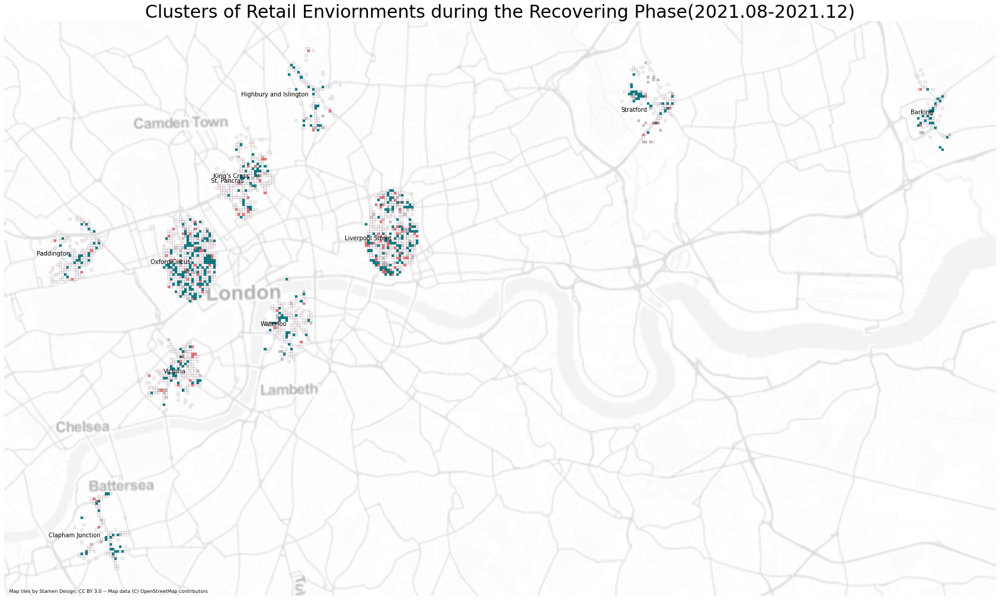

In [150]:
ax = recover_cls_geo.plot(figsize=(30,20), column='recover_hc_plot',edgecolor="black", color=recover_cls_geo['color'],
                      linewidth = 0.15,legend=True,legend_kwds={'loc': 4});
ax.set_title('Clusters of Retail Enviornments during the Recovering Phase(2021.08-2021.12)',fontsize=30)
cx.add_basemap(ax,zoom=12, crs=recover_cls_geo.crs.to_string(),source=cx.providers.Stamen.TonerLite, alpha=0.3)
station.apply(lambda x: ax.annotate(text=x['Station'], xy=x.geometry.centroid.coords[0], va="top",ha='right'),axis=1);

ax.axis('off')
img=ax.get_figure()
img.savefig('Clusters of Retail Enviornments during the Recovering Phase(2021.08-2021.12).jpg', format='jpg')

/opt/conda/envs/sds2021/lib/python3.9/site-packages/geopandas/plotting.py:641: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


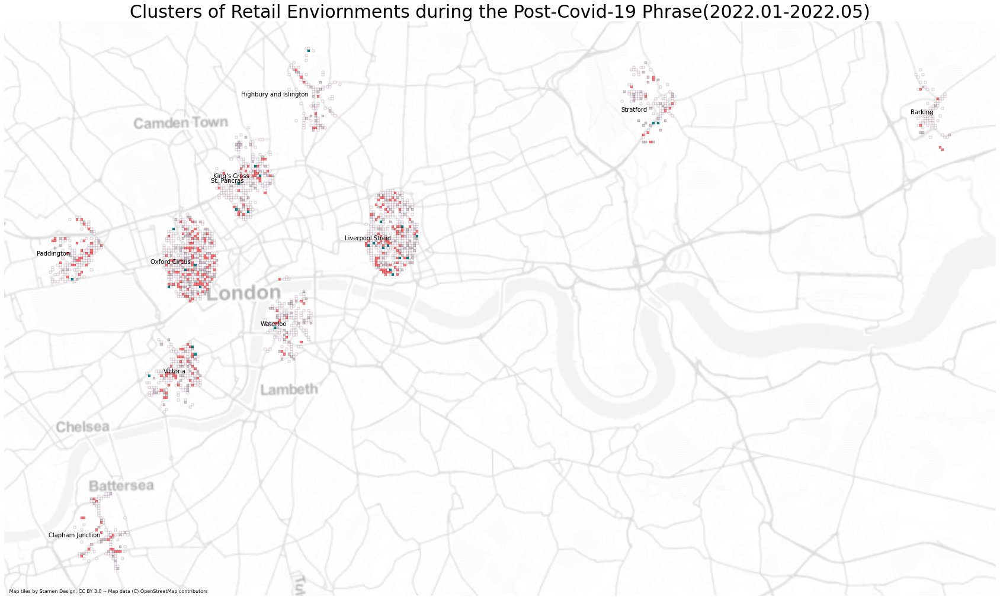

In [82]:
ax = post_cls_geo.plot(figsize=(30,20), column='post_hc_plot', color=post_cls_geo['color'], edgecolor="black", 
                      linewidth = 0.15,legend=True,legend_kwds={'loc': 4});
ax.set_title('Clusters of Retail Enviornments during the Post-Covid-19 Phrase(2022.01-2022.05)',fontsize=30)
cx.add_basemap(ax,zoom=12, crs=post_cls_geo.crs.to_string(),source=cx.providers.Stamen.TonerLite, alpha=0.3)
station.apply(lambda x: ax.annotate(text=x['Station'], xy=x.geometry.centroid.coords[0], va="top",ha='right'),axis=1);

ax.axis('off')
img=ax.get_figure()
img.savefig('Clusters of Retail Enviornments during the Post-Covid-19 Phrase(2022.01-2022.05).jpg', format='jpg')

/opt/conda/envs/sds2021/lib/python3.9/site-packages/geopandas/plotting.py:641: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



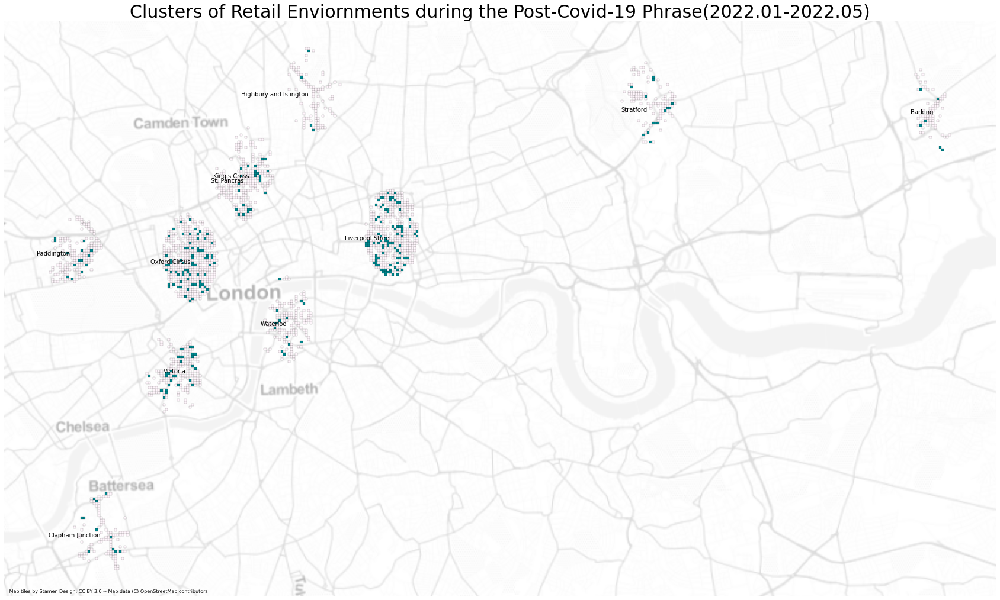

In [1017]:
ax = post_cls_geo.plot(figsize=(30,20), column='post_kmeans_plot', color=post_cls_geo['color'], edgecolor="black", 
                      linewidth = 0.15,legend=True,legend_kwds={'loc': 4});
ax.set_title('Clusters of Retail Enviornments during the Post-Covid-19 Phrase(2022.01-2022.05)',fontsize=30)
cx.add_basemap(ax,zoom=12, crs=post_cls_geo.crs.to_string(),source=cx.providers.Stamen.TonerLite, alpha=0.3)
station.apply(lambda x: ax.annotate(text=x['Station'], xy=x.geometry.centroid.coords[0], va="top",ha='right'),axis=1);

ax.axis('off')
img=ax.get_figure()
img.savefig('Clusters of Retail Enviornments during the Post-Covid-19 Phrase(2022.01-2022.05).jpg', format='jpg')

/opt/conda/envs/sds2021/lib/python3.9/site-packages/geopandas/plotting.py:641: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



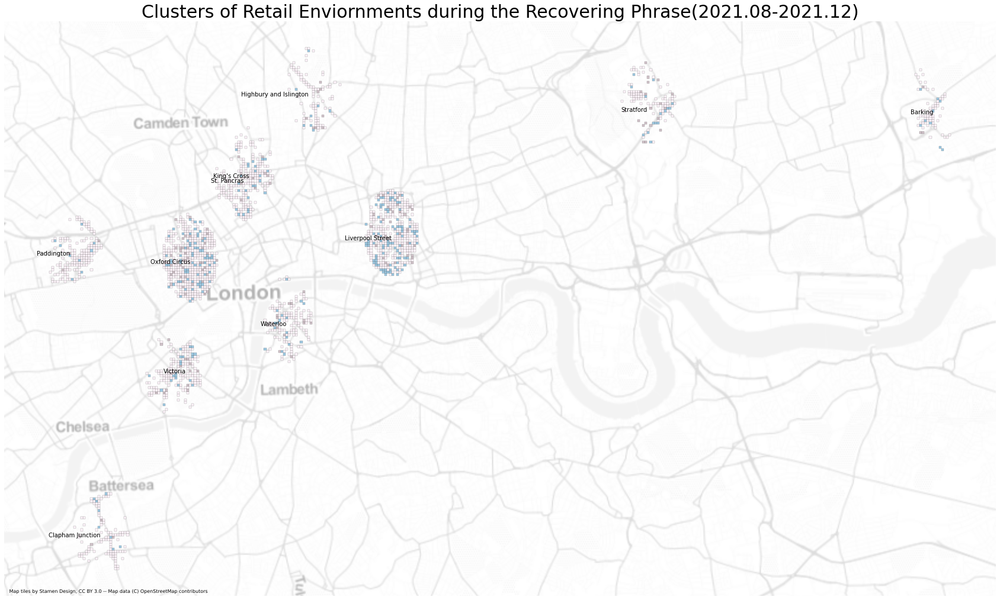

In [984]:
ax = recover_cls_geo.plot(figsize=(30,20), column='recover_kmeans_plot', color=recover_cls_geo['color'], edgecolor="black", 
                      linewidth = 0.15,legend=True,legend_kwds={'loc': 4});
ax.set_title('Clusters of Retail Enviornments during the Recovering Phrase(2021.08-2021.12)',fontsize=30)
cx.add_basemap(ax,zoom=12, crs=recover_cls_geo.crs.to_string(),source=cx.providers.Stamen.TonerLite, alpha=0.3)
station.apply(lambda x: ax.annotate(text=x['Station'], xy=x.geometry.centroid.coords[0], va="top",ha='right'),axis=1);

ax.axis('off')
img=ax.get_figure()
img.savefig('Clusters of Retail Enviornments during the Recovering Phrase(2021.08-2021.12).jpg', format='jpg')

/opt/conda/envs/sds2021/lib/python3.9/site-packages/geopandas/plotting.py:641: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



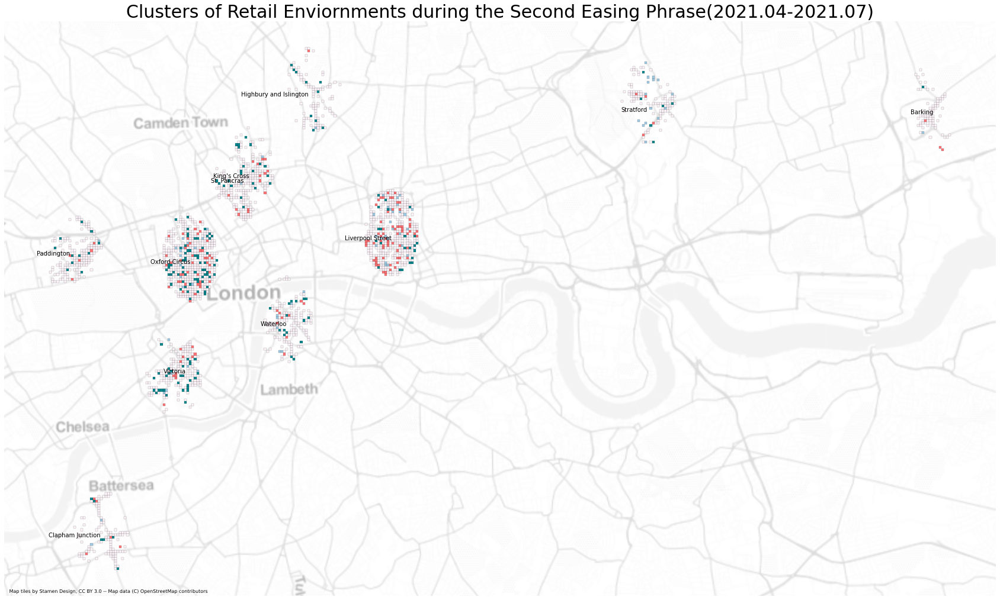

In [941]:
ax = e2_cls_geo.plot(figsize=(30,20), column='e2_kmeans_plot', color=e2_cls_geo['color'], edgecolor="black", 
                      linewidth = 0.15,legend=True,legend_kwds={'loc': 4});
ax.set_title('Clusters of Retail Enviornments during the Second Easing Phrase(2021.04-2021.07)',fontsize=30)
cx.add_basemap(ax,zoom=12, crs=e2_cls_geo.crs.to_string(),source=cx.providers.Stamen.TonerLite, alpha=0.3)
station.apply(lambda x: ax.annotate(text=x['Station'], xy=x.geometry.centroid.coords[0], va="top",ha='right'),axis=1);

ax.axis('off')
img=ax.get_figure()
img.savefig('Clusters of Retail Enviornments during the Second Easing Phrase(2021.04-2021.07).jpg', format='jpg')

/opt/conda/envs/sds2021/lib/python3.9/site-packages/geopandas/plotting.py:641: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



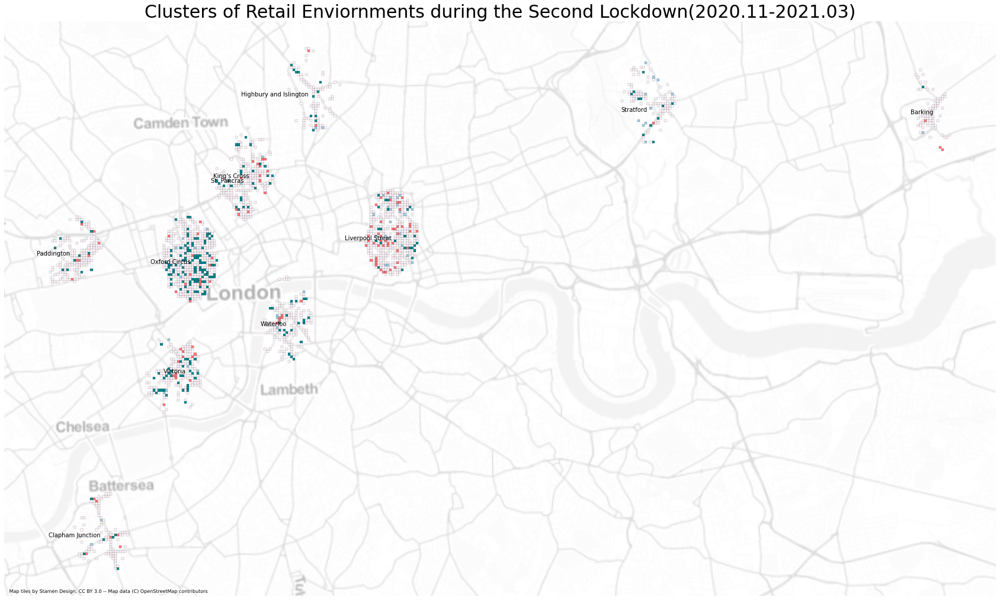

In [892]:
ax = lc2_cls_geo.plot(figsize=(30,20), column='lc2_kmeans_plot', color=lc2_cls_geo['color'], edgecolor="black", 
                      linewidth = 0.15,legend=True,legend_kwds={'loc': 4});
ax.set_title('Clusters of Retail Enviornments during the Second Lockdown(2020.11-2021.03)',fontsize=30)
cx.add_basemap(ax,zoom=12, crs=lc2_cls_geo.crs.to_string(),source=cx.providers.Stamen.TonerLite, alpha=0.3)
station.apply(lambda x: ax.annotate(text=x['Station'], xy=x.geometry.centroid.coords[0], va="top",ha='right'),axis=1);

ax.axis('off')
img=ax.get_figure()
img.savefig('Clusters of Retail Enviornments during the Second Lockdown(2020.11-2021.03).jpg', format='jpg')

/opt/conda/envs/sds2021/lib/python3.9/site-packages/geopandas/plotting.py:641: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



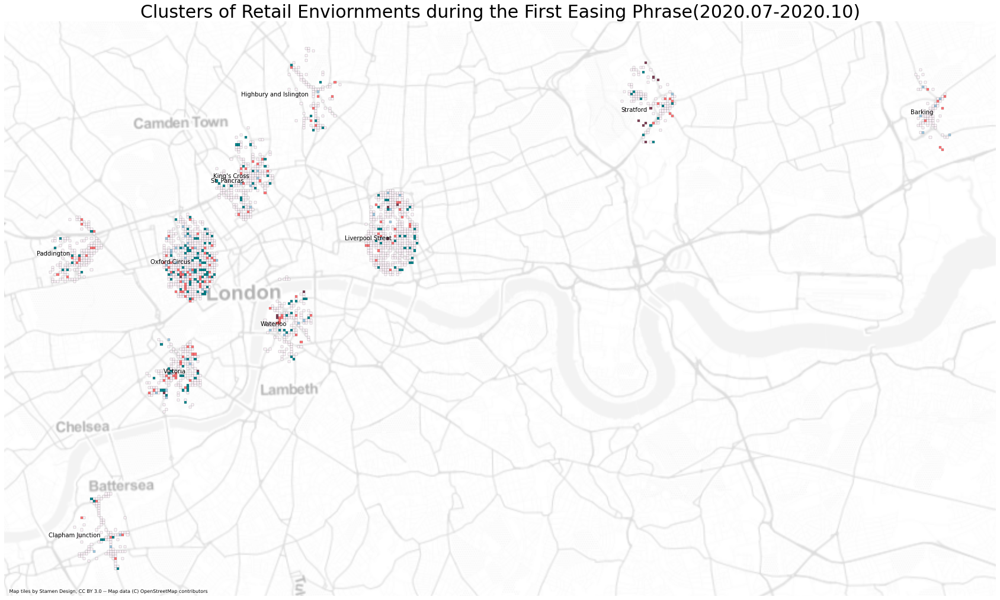

In [844]:
#e1_cls_geo['color'] = ['#C62828', '#C62828', '#283593', '#FF9800', '#283593']

ax = e1_cls_geo.plot(figsize=(30,20), column='e1_kmeans_plot', color=e1_cls_geo['color'], edgecolor="black", 
                      linewidth = 0.15,legend=True,legend_kwds={'loc': 4});
ax.set_title('Clusters of Retail Enviornments during the First Easing Phrase(2020.07-2020.10)',fontsize=30)
cx.add_basemap(ax,zoom=12, crs=e1_cls_geo.crs.to_string(),source=cx.providers.Stamen.TonerLite, alpha=0.3)
station.apply(lambda x: ax.annotate(text=x['Station'], xy=x.geometry.centroid.coords[0], va="top",ha='right'),axis=1);

ax.axis('off')
img=ax.get_figure()
img.savefig('Clusters of Retail Enviornments during the First Easing Phrase(2020.07-2020.10).jpg', format='jpg')

/opt/conda/envs/sds2021/lib/python3.9/site-packages/geopandas/plotting.py:641: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



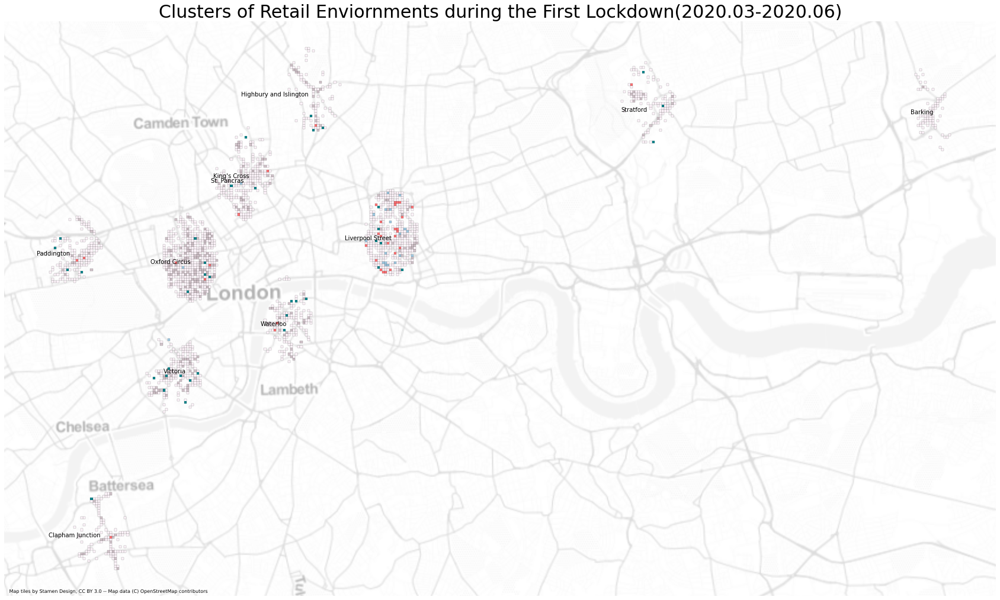

In [848]:
ax = lc1_cls_geo.plot(figsize=(30,20), column='lc1_DBSCAN', color=lc1_cls_geo['color'],edgecolor="black", 
                      linewidth = 0.15,legend=True,legend_kwds={'loc': 4});
ax.set_title('Clusters of Retail Enviornments during the First Lockdown(2020.03-2020.06)',fontsize=30)
cx.add_basemap(ax,zoom=12, crs=lc1_cls_geo.crs.to_string(),source=cx.providers.Stamen.TonerLite, alpha=0.3)
station.apply(lambda x: ax.annotate(text=x['Station'], xy=x.geometry.centroid.coords[0], va="top",ha='right'),axis=1);

ax.axis('off')
img=ax.get_figure()
img.savefig('Clusters of Retail Enviornments during the First Lockdown(2020.03-2020.06).jpg', format='jpg')

/opt/conda/envs/sds2021/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



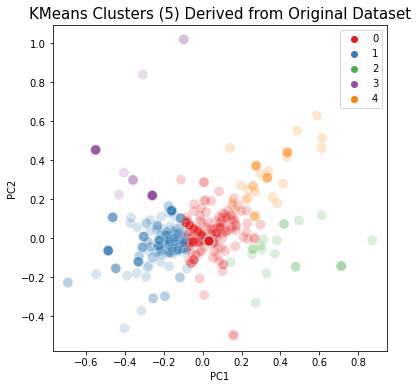

In [515]:
pca2d = pca2.transform(df_scale2)
plt.figure(figsize = (6,6)) 
sns.scatterplot(pca2d[:,0], pca2d[:,1], 
                hue=labels_scale, 
                palette='Set1', 
                s=100, alpha=0.2).set_title ('KMeans Clusters (5) Derived from Original Dataset', fontsize=15)
plt.legend() 
plt.ylabel('PC2') 
plt.xlabel('PC1') 
plt.show()

In [ ]:
lc1_cluster_pca_profile = lc1_com.merge(lc1_all_grids_pca,how='left', on='id')

cluster_pca_profile = pd.merge(lc1_all_grids_pca, clusters_pca_scale['pca_clusters'], left_index=True, right_index=True )
cluster_pca_profile.reset_index()

In [516]:
#import chart_studio.plotly as py
import plotly.graph_objs as go

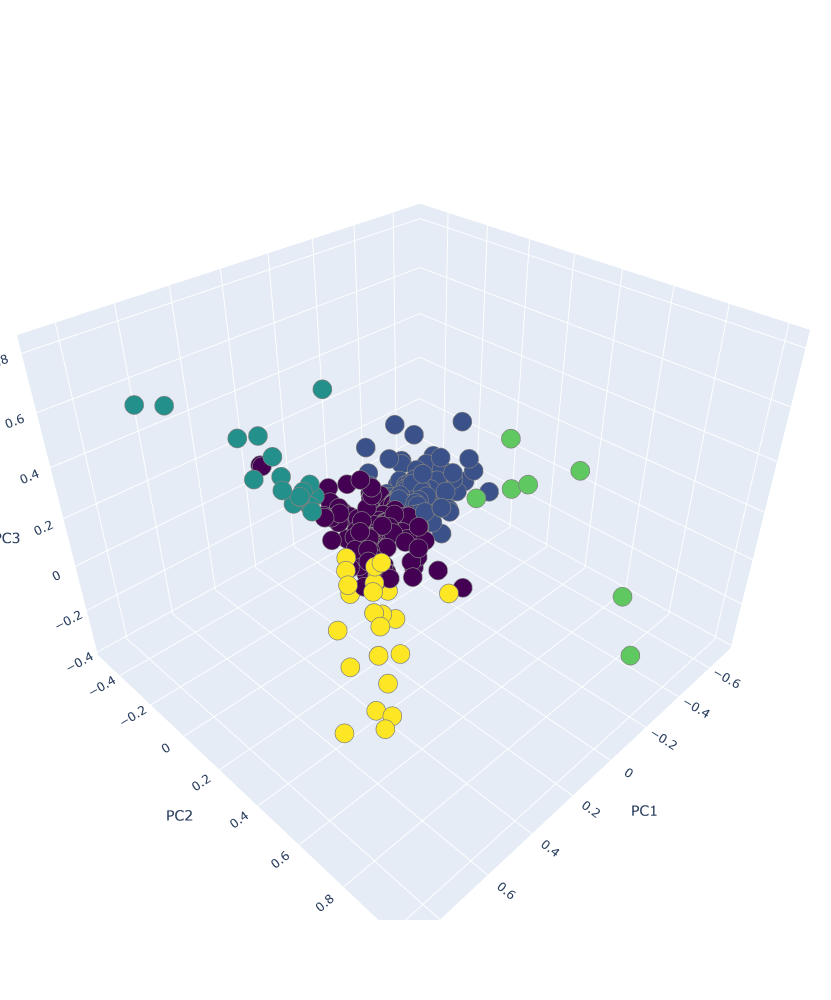

In [517]:
Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title  = 'PC3'))
labels = labels_scale
trace = go.Scatter3d(x=pca2d[:,0], y=pca2d[:,1], z=pca2d[:,2], mode='markers',marker=dict(color = labels, colorscale='Viridis', size = 10, line = dict(color = 'gray',width = 5)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

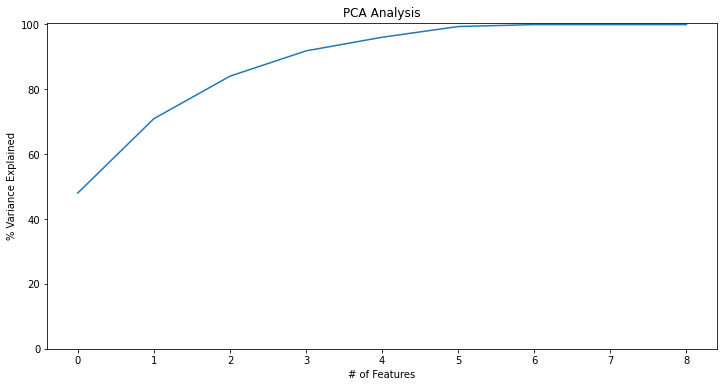

In [104]:
#n_components=9 because we have 9 features in the dataset
pca = PCA(n_components=9)
pca.fit(df_scale)
variance = pca.explained_variance_ratio_
var = np.cumsum(np.round(variance, 3)*100)
plt.figure(figsize=(12,6))
plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('PCA Analysis')
plt.ylim(0,100.5)
plt.plot(var)

In [105]:
pca = PCA(n_components=4)
pca_scale = pca.fit_transform(df_scale)
pca_df_scale = pd.DataFrame(pca_scale, columns=['pc1','pc2','pc3','pc4']) #,'pc5','pc6','pc7','pc8'
print(pca.explained_variance_ratio_)

[0.48037308 0.22909615 0.13086401 0.07766383]


Text(0, 0.5, 'Inertia')

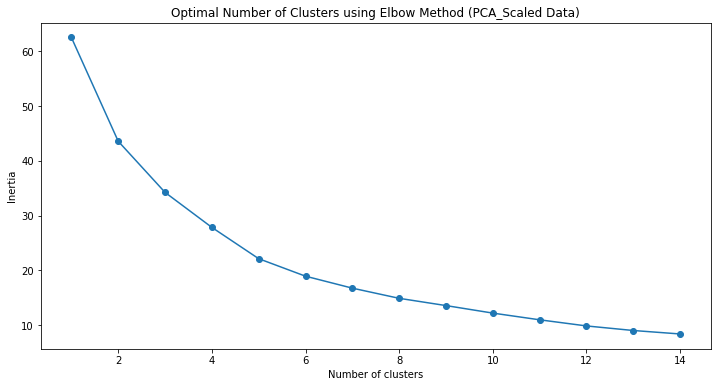

In [106]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(pca_df_scale)
    sse.append([k, km.inertia_])
    
pca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (PCA_Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [107]:
kmeans_pca_scale = KMeans(n_clusters=5, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(pca_df_scale)
print('KMeans PCA Scaled Silhouette Score: {}'.format(silhouette_score(pca_df_scale, kmeans_pca_scale.labels_, metric='euclidean')))
labels_pca_scale = kmeans_pca_scale.labels_
clusters_pca_scale = pd.concat([pca_df_scale, pd.DataFrame({'pca_clusters':labels_pca_scale})], axis=1)

KMeans PCA Scaled Silhouette Score: 0.7556564838676264


/opt/conda/envs/sds2021/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



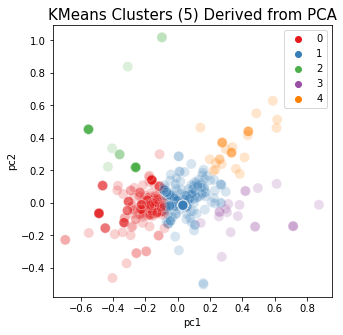

In [108]:
plt.figure(figsize = (5,5))
sns.scatterplot(clusters_pca_scale.iloc[:,0],clusters_pca_scale.iloc[:,1], hue=labels_pca_scale, palette='Set1', s=100, alpha=0.2).set_title('KMeans Clusters (5) Derived from PCA', fontsize=15)
plt.legend()
plt.show()

# Feature Reduction via t-SNE

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 2062 samples in 0.010s...
[t-SNE] Computed neighbors for 2062 samples in 0.176s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2062
[t-SNE] Computed conditional probabilities for sample 2000 / 2062
[t-SNE] Computed conditional probabilities for sample 2062 / 2062
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.380169
[t-SNE] KL divergence after 700 iterations: 1.343080


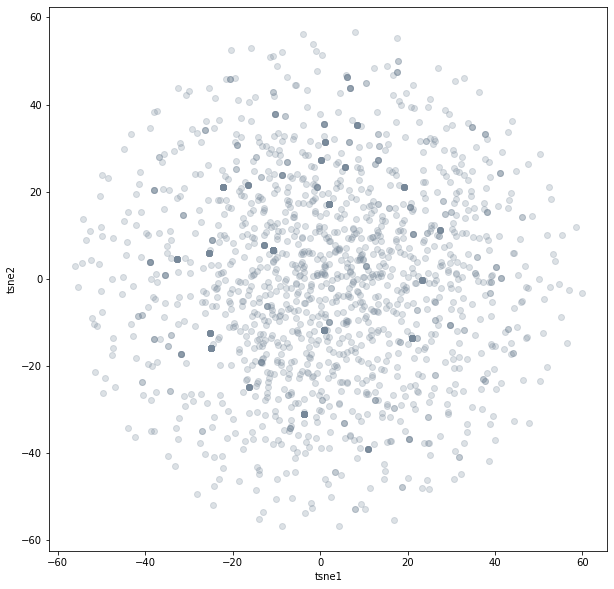

In [109]:
tsne = TSNE(n_components=3, verbose=1, perplexity=80, n_iter=5000, learning_rate=200)
tsne_scale_results = tsne.fit_transform(df_scale)
tsne_df_scale = pd.DataFrame(tsne_scale_results, columns=['tsne1', 'tsne2', 'tsne3'])
plt.figure(figsize = (10,10))
plt.scatter(tsne_df_scale.iloc[:,0],tsne_df_scale.iloc[:,1],alpha=0.25, facecolor='lightslategray')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.show()

Text(0, 0.5, 'Inertia')

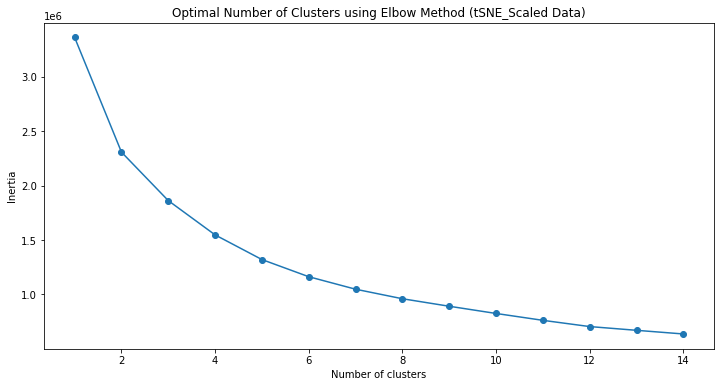

In [110]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(tsne_df_scale)
    sse.append([k, km.inertia_])
    
tsne_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (tSNE_Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [111]:
kmeans_tsne_scale = KMeans(n_clusters=5, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(tsne_df_scale)
print('KMeans tSNE Scaled Silhouette Score: {}'.format(silhouette_score(tsne_df_scale, kmeans_tsne_scale.labels_, metric='euclidean')))
labels_tsne_scale = kmeans_tsne_scale.labels_
clusters_tsne_scale = pd.concat([tsne_df_scale, pd.DataFrame({'tsne_clusters':labels_tsne_scale})], axis=1)

KMeans tSNE Scaled Silhouette Score: 0.2713521122932434


/opt/conda/envs/sds2021/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



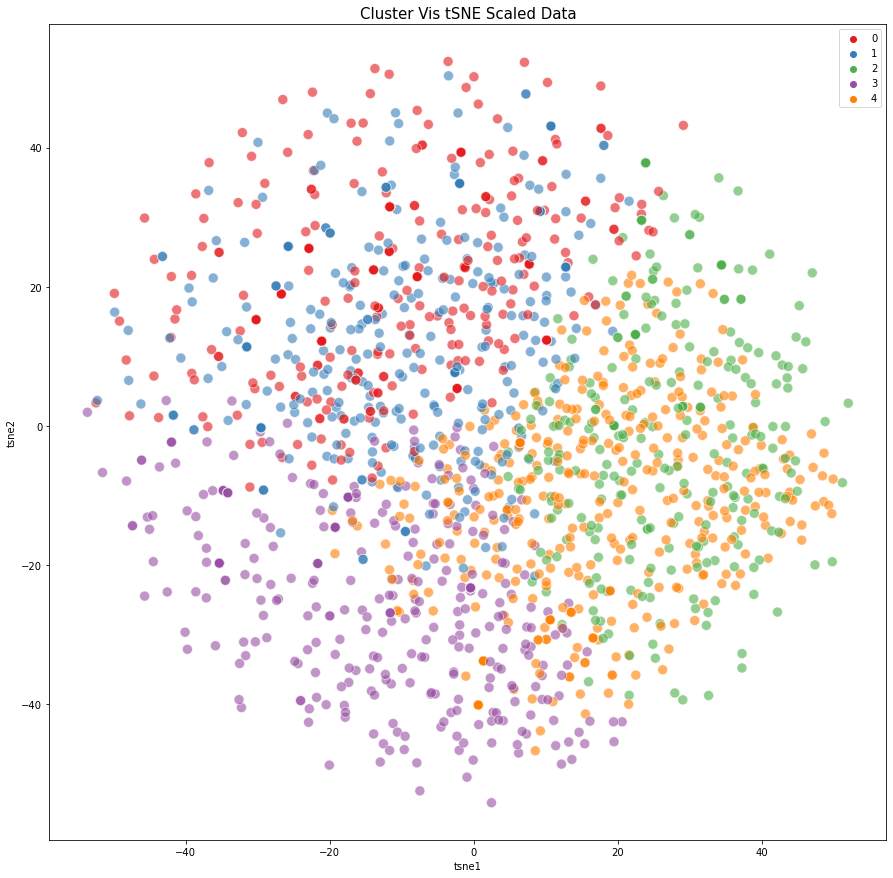

In [55]:
plt.figure(figsize = (15,15)) 
sns.scatterplot(clusters_tsne_scale.iloc[:,0],clusters_tsne_scale.iloc[:,1],hue=labels_tsne_scale, palette='Set1', s=100, alpha= 0.6).set_title('Cluster Vis tSNE Scaled Data', fontsize=15)
plt.legend() 
plt.show()

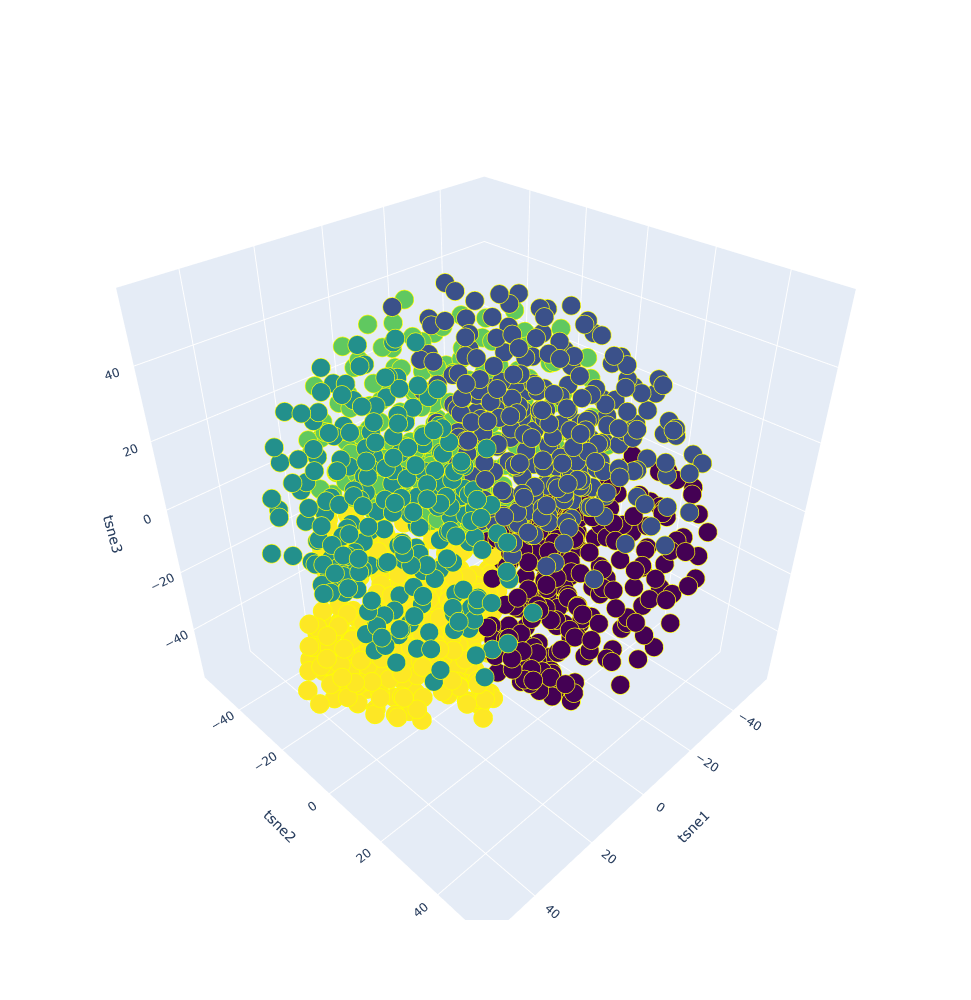

In [56]:
Scene = dict(xaxis = dict(title  = 'tsne1'),yaxis = dict(title  = 'tsne2'),zaxis = dict(title  = 'tsne3'))
labels = labels_tsne_scale
trace = go.Scatter3d(x=clusters_tsne_scale.iloc[:,0], y=clusters_tsne_scale.iloc[:,1], z=clusters_tsne_scale.iloc[:,2], mode='markers',marker=dict(color = labels, colorscale='Viridis', size = 10, line = dict(color = 'yellow',width = 5)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

In [112]:
clusters_pca_scale.sample(3)

,pc1,pc2,pc3,pc4,pca_clusters
1499,0.031371,-0.014683,-0.010782,0.002669,1
1098,0.031371,-0.014683,-0.010782,0.002669,1
1306,0.031371,-0.014683,-0.010782,0.002669,1


In [113]:
#cluster_tsne_profile = pd.merge(lc1_all_grids_pca, clusters_tsne_scale['tsne_clusters'], left_index=True, right_index=True )

lc1_all_grids_pca.reset_index(level='id')

,id,lc1_vacantallthetime_ratio,lc1_distance,SHDI_lc1_open,lc1_vacant_ratio_diff_GB,lc1_vacant_ratio_diff_London,lc1_newvacant_ratio,lc1_closed_ratio,lc1_open_ratio,lc1_newopen_ratio
0,56039,0.0,0.000000,0.0,-0.000732,-0.002517,0.0,0.0,0.0,0.0
1,32923,0.0,656.503566,0.0,-0.000732,-0.002517,0.0,0.0,1.0,1.0
2,56072,0.0,0.000000,0.0,-0.000732,-0.002517,0.0,0.0,0.0,0.0
3,32024,0.0,566.930927,0.0,-0.000732,-0.002517,0.0,0.0,1.0,1.0
4,24184,0.0,0.000000,0.0,-0.000732,-0.002517,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
2057,14260,0.0,0.000000,0.0,-0.000732,-0.002517,0.0,0.0,0.0,0.0
2058,83524,0.0,0.000000,0.0,-0.000732,-0.002517,0.0,0.0,0.0,0.0
2059,83750,0.0,0.000000,0.0,-0.000732,-0.002517,0.0,0.0,0.0,0.0
2060,13613,0.0,0.000000,0.0,-0.000732,-0.002517,0.0,0.0,0.0,0.0


In [114]:
lc1_all_grids_pca.sample(3)

,lc1_vacantallthetime_ratio,lc1_distance,SHDI_lc1_open,lc1_vacant_ratio_diff_GB,lc1_vacant_ratio_diff_London,lc1_newvacant_ratio,lc1_closed_ratio,lc1_open_ratio,lc1_newopen_ratio
id,,,,,,,,,
25690,0.030769,-1.141845,0.0,-0.000732,-0.002517,-0.13,-0.13,0.099231,-0.13
11845,0.000000,0.000000,0.0,-0.000732,-0.002517,0.00,0.00,0.000000,0.00
30915,0.000000,0.000000,0.0,-0.000732,-0.002517,0.00,0.00,0.000000,0.00


In [92]:
lc1_all_grids_pca.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2062 entries, 56039 to 33400
Data columns (total 9 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   lc1_vacantallthetime_ratio    2062 non-null   float64
 1   lc1_distance                  2062 non-null   float64
 2   SHDI_lc1_open                 2062 non-null   float64
 3   lc1_vacant_ratio_diff_GB      2062 non-null   float64
 4   lc1_vacant_ratio_diff_London  2062 non-null   float64
 5   lc1_newvacant_ratio           2062 non-null   float64
 6   lc1_closed_ratio              2062 non-null   float64
 7   lc1_open_ratio                2062 non-null   float64
 8   lc1_newopen_ratio             2062 non-null   float64
dtypes: float64(9)
memory usage: 225.6 KB


In [116]:
clusters_pca_scale.sample(3)

,pc1,pc2,pc3,pc4,pca_clusters
603,0.031371,-0.014683,-0.010782,0.002669,1
1344,-0.161332,0.139566,0.049681,0.042675,0
788,0.031371,-0.014683,-0.010782,0.002669,1


In [117]:
clusters_pca_scale.reset_index()

,index,pc1,pc2,pc3,pc4,pca_clusters
0,0,0.031371,-0.014683,-0.010782,0.002669,1
1,1,0.158543,-0.501993,0.086048,-0.122343,1
2,2,0.031371,-0.014683,-0.010782,0.002669,1
3,3,0.157411,-0.493850,0.083828,-0.117091,1
4,4,0.031371,-0.014683,-0.010782,0.002669,1
...,...,...,...,...,...,...
2057,2057,0.031371,-0.014683,-0.010782,0.002669,1
2058,2058,0.031371,-0.014683,-0.010782,0.002669,1
2059,2059,0.031371,-0.014683,-0.010782,0.002669,1
2060,2060,0.031371,-0.014683,-0.010782,0.002669,1


In [87]:
lc1_cluster_pca_profile = lc1_com.merge(lc1_all_grids_pca,how='left', on='id')

cluster_pca_profile = pd.merge(lc1_all_grids_pca, clusters_pca_scale['pca_clusters'], left_index=True, right_index=True )
cluster_pca_profile.reset_index()

,index,lc1_vacantallthetime_ratio,lc1_distance,SHDI_lc1_open,lc1_vacant_ratio_diff_GB,lc1_vacant_ratio_diff_London,lc1_newvacant_ratio,lc1_closed_ratio,lc1_open_ratio,lc1_newopen_ratio,pca_clusters
0,1902,0.000000,0.433781,0.0,-0.000732,-0.002517,-0.11,-0.11,0.110000,-0.11,3
1,1888,0.000000,0.000000,0.0,-0.000732,-0.002517,0.00,0.00,0.000000,0.00,0
2,1900,0.001818,0.000000,0.0,0.000178,-0.001608,-0.09,0.00,-0.001818,-0.09,1
3,551,0.000000,0.000000,0.0,-0.000732,-0.002517,0.00,0.00,0.000000,0.00,1
4,763,0.000000,0.000000,0.0,-0.000732,-0.002517,0.00,0.00,0.000000,0.00,0
5,774,0.000000,0.000000,0.0,-0.000732,-0.002517,0.00,0.00,0.000000,0.00,0
6,775,0.000000,0.000000,0.0,-0.000732,-0.002517,0.00,0.00,0.000000,0.00,0
7,779,0.000000,0.000000,0.0,-0.000732,-0.002517,0.00,0.00,0.000000,0.00,0
8,780,0.000000,0.000000,0.0,-0.000732,-0.002517,0.00,0.00,0.000000,0.00,0
9,987,0.000000,0.000000,0.0,-0.000732,-0.002517,0.00,0.00,0.000000,0.00,0


In [88]:
cluster_pca_profile.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37 entries, 1902 to 1227
Data columns (total 10 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   lc1_vacantallthetime_ratio    37 non-null     float64
 1   lc1_distance                  37 non-null     float64
 2   SHDI_lc1_open                 37 non-null     float64
 3   lc1_vacant_ratio_diff_GB      37 non-null     float64
 4   lc1_vacant_ratio_diff_London  37 non-null     float64
 5   lc1_newvacant_ratio           37 non-null     float64
 6   lc1_closed_ratio              37 non-null     float64
 7   lc1_open_ratio                37 non-null     float64
 8   lc1_newopen_ratio             37 non-null     float64
 9   pca_clusters                  37 non-null     int32  
dtypes: float64(9), int32(1)
memory usage: 3.0 KB


pca_clusters
0    [[AxesSubplot(0.125,0.725918;0.215278x0.154082...
1    [[AxesSubplot(0.125,0.725918;0.215278x0.154082...
3    [[AxesSubplot(0.125,0.725918;0.215278x0.154082...
4    [[AxesSubplot(0.125,0.725918;0.215278x0.154082...
dtype: object

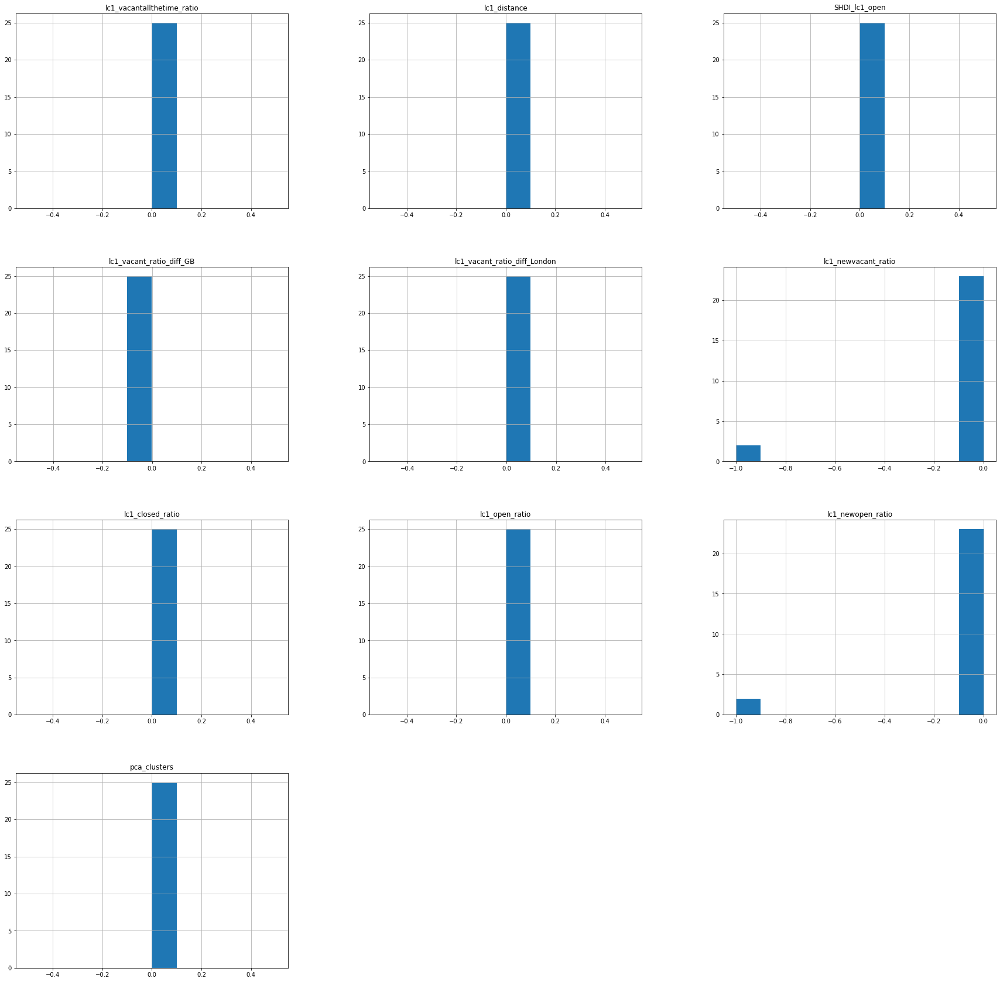

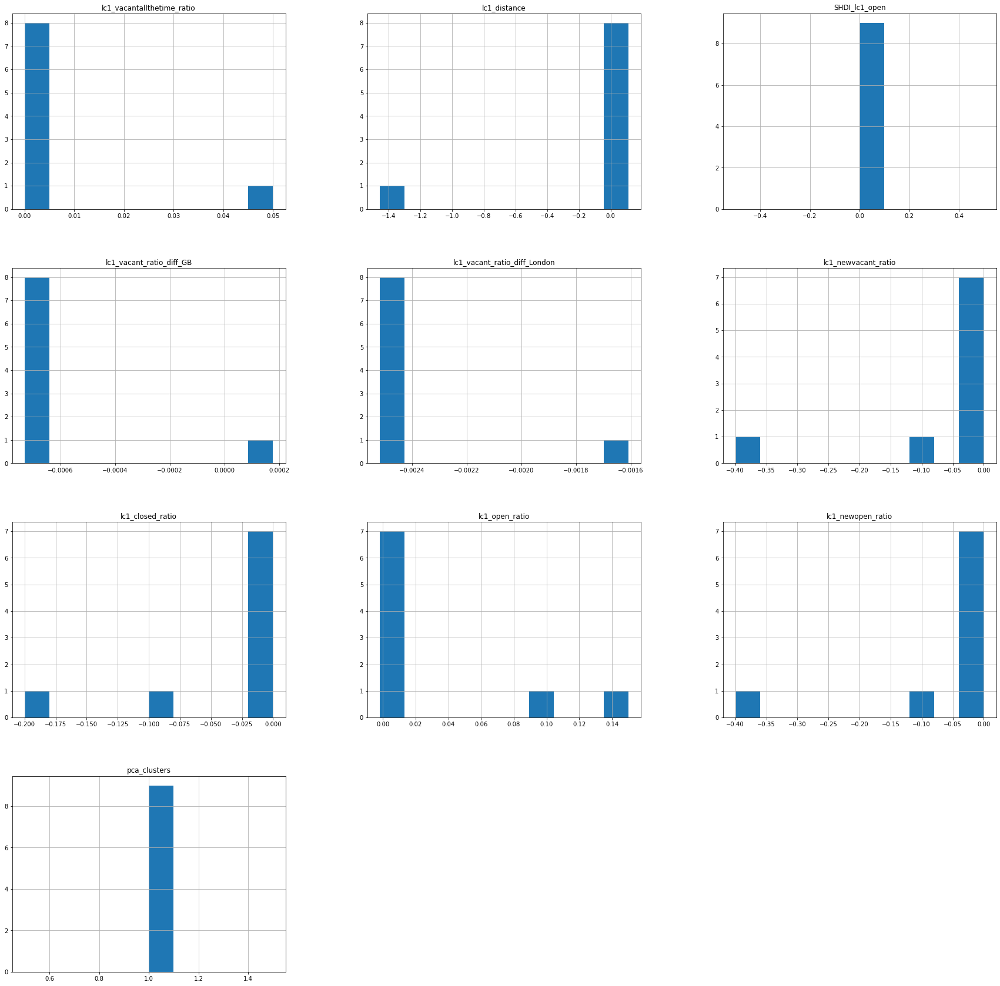

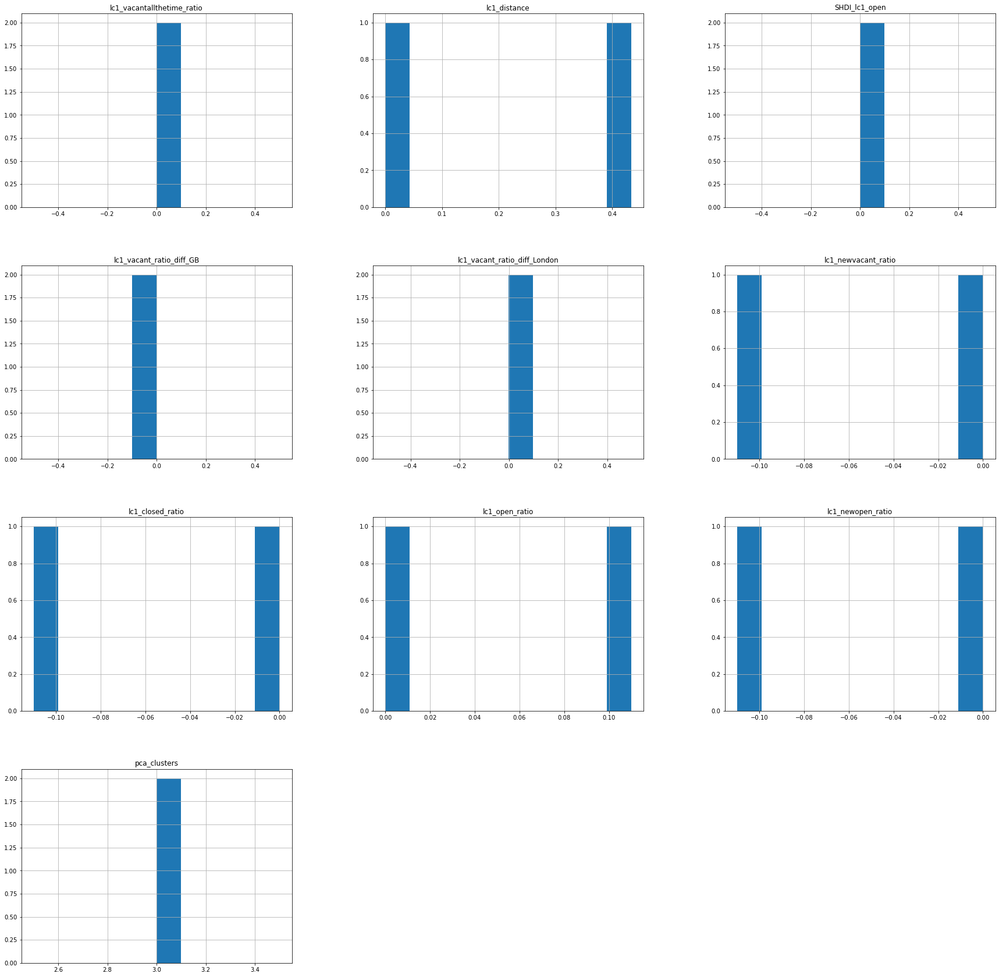

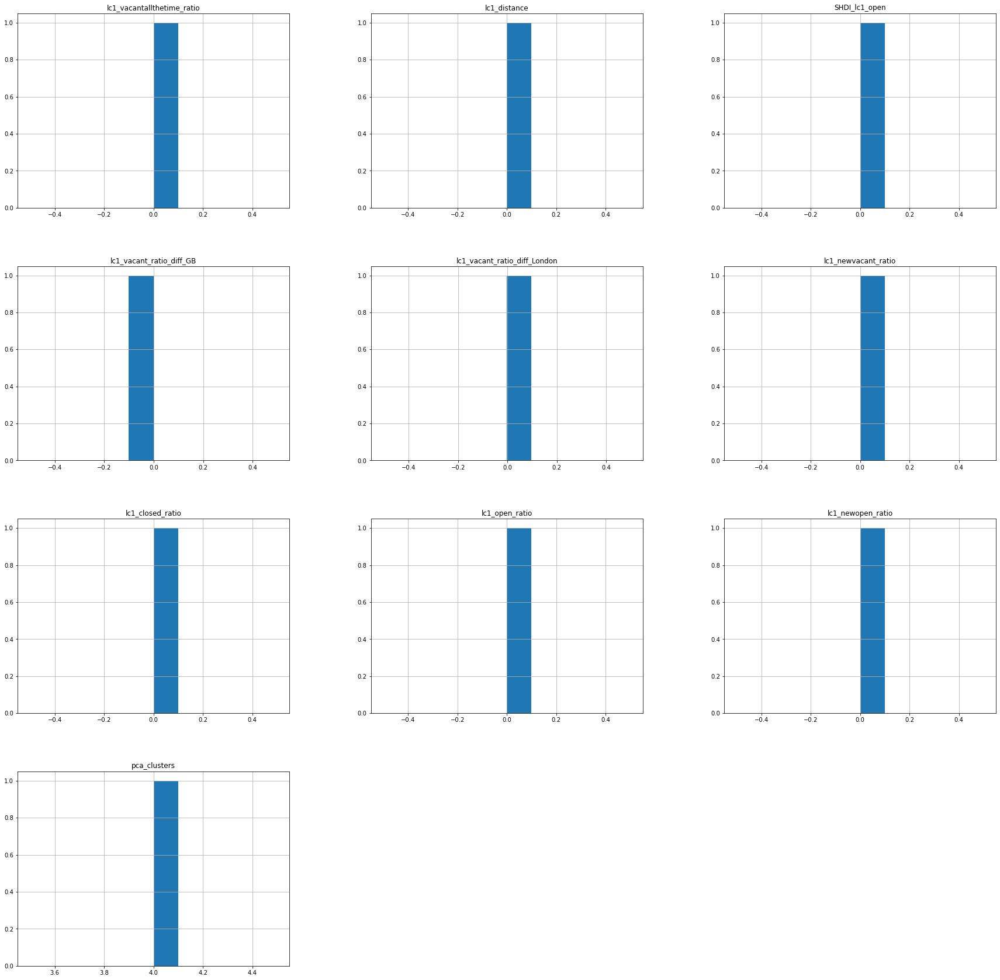

In [155]:
cluster_pca_profile.groupby('pca_clusters').hist(figsize=(30,30))

In [71]:
cluster_pca_profile.sample()

,lc1_vacantallthetime_ratio,lc1_distance,SHDI_lc1_open,lc1_vacant_ratio_diff_GB,lc1_vacant_ratio_diff_London,lc1_newvacant_ratio,lc1_closed_ratio,lc1_open_ratio,lc1_newopen_ratio,pca_clusters
1899,0.0,0.0,0.0,-0.000732,-0.002517,0.0,0.0,0.0,0.0,1


Text(0.5, 1.0, '(PCA) Clusters by lc1_closed_ratio and lc1_vacantallthetime_ratio')

<Figure size 1080x720 with 0 Axes>

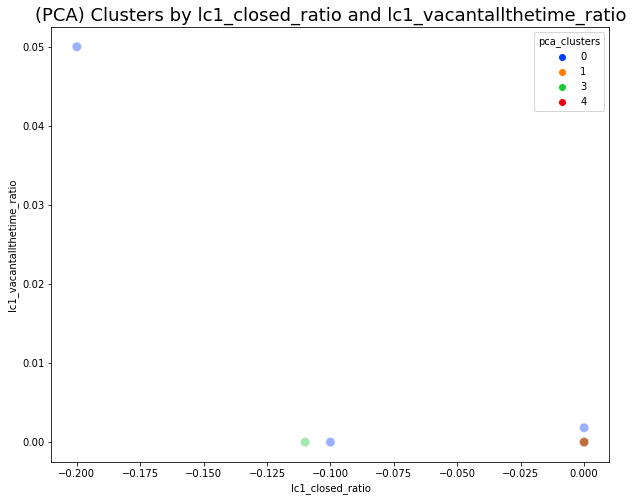

In [66]:
plt.figure(figsize=(15,10))
fig , ax = plt.subplots(figsize=(10,8))
sns.scatterplot(data=cluster_pca_profile, x='lc1_closed_ratio', y='lc1_vacantallthetime_ratio', 
                hue='pca_clusters', s=85, alpha=0.4, palette='bright', ax=ax).set_title(
    '(PCA) Clusters by lc1_closed_ratio and lc1_vacantallthetime_ratio',fontsize=18)

In [128]:
change_merged = pd.read_csv("change_merged.csv")

change_merged

,id,lc1_vacantallthetime_ratio,e1_vacantallthetime_ratio,lc2_vacantallthetime_ratio,e2_vacantallthetime_ratio,recover_vacantallthetime_ratio,post_vacantallthetime_ratio,e1_distance,lc1_distance,lc2_distance,...,lc2_open_ratio,e2_open_ratio,recover_open_ratio,post_open_ratio,lc1_newopen_ratio,e1_newopen_ratio,lc2_newopen_ratio,e2_newopen_ratio,recover_newopen_ratio,post_newopen_ratio
0,56039,0.0,0.0,0.0,0.0,0.0,0.0,898.370763,0.000000,898.370763,...,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
1,32923,0.0,0.0,0.0,0.0,0.0,0.0,656.503566,656.503566,656.503566,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2,56072,0.0,0.0,0.0,0.0,0.0,0.0,713.060913,0.000000,713.060913,...,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
3,32024,0.0,0.0,0.0,0.0,0.0,0.0,566.930927,566.930927,566.930927,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,24184,0.0,0.0,0.0,0.0,0.0,0.0,679.977362,0.000000,679.977362,...,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2057,14260,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,-511.037516,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0
2058,83524,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,-792.931852,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0
2059,83750,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,-839.363067,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0
2060,13613,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,-866.037094,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [129]:
change_merged.set_index('id')

,lc1_vacantallthetime_ratio,e1_vacantallthetime_ratio,lc2_vacantallthetime_ratio,e2_vacantallthetime_ratio,recover_vacantallthetime_ratio,post_vacantallthetime_ratio,e1_distance,lc1_distance,lc2_distance,e2_distance,...,lc2_open_ratio,e2_open_ratio,recover_open_ratio,post_open_ratio,lc1_newopen_ratio,e1_newopen_ratio,lc2_newopen_ratio,e2_newopen_ratio,recover_newopen_ratio,post_newopen_ratio
id,,,,,,,,,,,,,,,,,,,,,
56039,0.0,0.0,0.0,0.0,0.0,0.0,898.370763,0.000000,898.370763,898.370763,...,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
32923,0.0,0.0,0.0,0.0,0.0,0.0,656.503566,656.503566,656.503566,656.503566,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
56072,0.0,0.0,0.0,0.0,0.0,0.0,713.060913,0.000000,713.060913,713.060913,...,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
32024,0.0,0.0,0.0,0.0,0.0,0.0,566.930927,566.930927,566.930927,566.930927,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
24184,0.0,0.0,0.0,0.0,0.0,0.0,679.977362,0.000000,679.977362,679.977362,...,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14260,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,-511.037516,-511.037516,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0
83524,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,-792.931852,-792.931852,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0
83750,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,-839.363067,-839.363067,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [130]:
change_merged.describe()

,id,lc1_vacantallthetime_ratio,e1_vacantallthetime_ratio,lc2_vacantallthetime_ratio,e2_vacantallthetime_ratio,recover_vacantallthetime_ratio,post_vacantallthetime_ratio,e1_distance,lc1_distance,lc2_distance,...,lc2_open_ratio,e2_open_ratio,recover_open_ratio,post_open_ratio,lc1_newopen_ratio,e1_newopen_ratio,lc2_newopen_ratio,e2_newopen_ratio,recover_newopen_ratio,post_newopen_ratio
count,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,...,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000
mean,22861.887973,0.002235,-0.002775,0.000844,0.004186,0.016045,0.032908,3.074688,0.589083,3.140277,...,0.010615,-0.001267,-0.028587,-0.019362,-0.039783,-0.017828,-0.022648,-0.017278,0.011397,-0.009525
std,17117.614123,0.070733,0.105191,0.131299,0.157722,0.191412,0.214975,50.565554,19.121144,72.790490,...,0.234218,0.267869,0.305407,0.312882,0.147676,0.171776,0.178613,0.164625,0.192969,0.181029
min,551.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-741.528221,-9.611550,-866.037094,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,12908.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-0.030000,-0.026250,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,18286.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,31357.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001111,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,84419.000000,0.500000,1.000000,1.000000,1.000000,1.000000,1.000000,898.370763,656.503566,898.370763,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


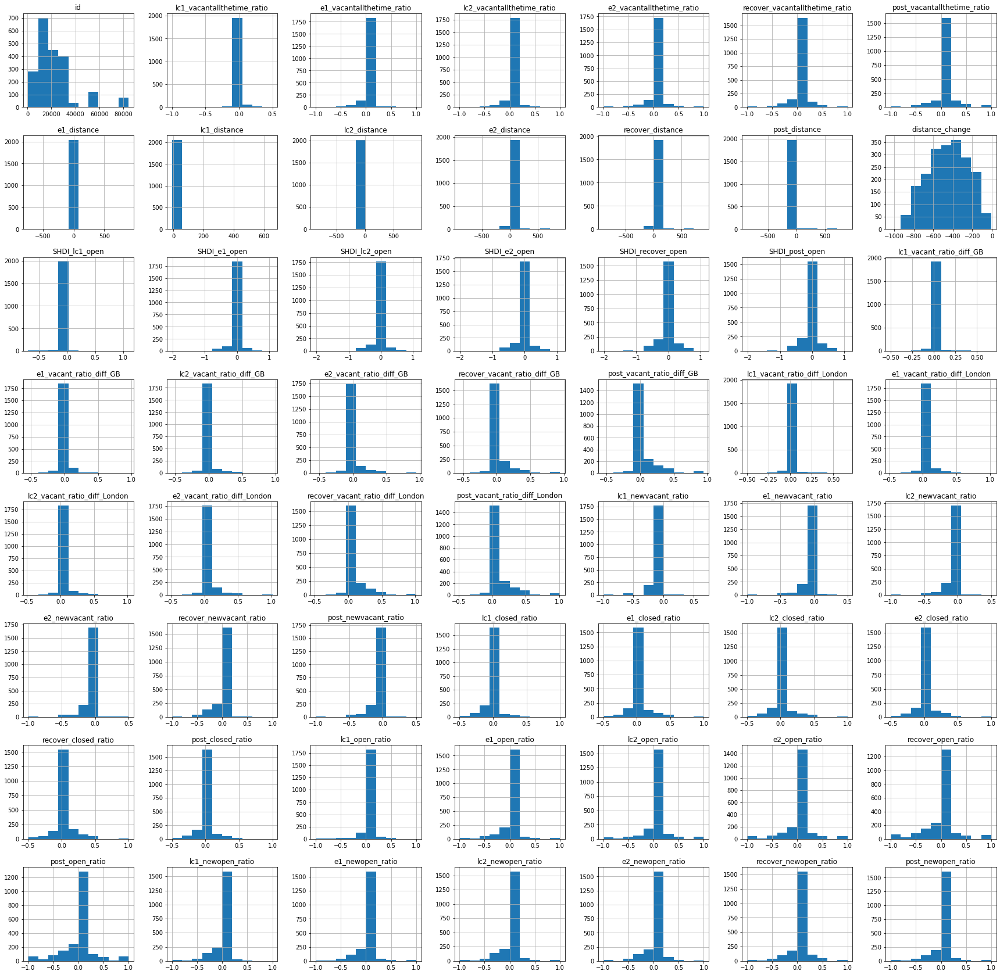

In [134]:
histograms = change_merged.hist (figsize=(30,30))

In [ ]:
#lc1_all_grids_pca= all_grids1.filter(regex='lc1',axis=1)
e1_all_grids_pca= all_grids1.filter(regex='e1',axis=1)
#lc2_all_grids_pca= all_grids1.filter(regex='lc2',axis=1)
#e2_all_grids_pca= all_grids1.filter(regex='e2',axis=1)
#recover_all_grids_pca= all_grids1.filter(regex='recover',axis=1)
#post_all_grids_pca= all_grids1.filter(regex='post',axis=1)

#lc_all_grids_pca= all_grids1.filter(regex='lc',axis=1)
#e_all_grids_pca= all_grids1.filter(regex='e',axis=1)

In [ ]:
x = e1_all_grids_pca.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
e1_all_grids_pca_scaler = pd.DataFrame(x_scaled, columns=e1_all_grids_pca.columns,index=e1_all_grids_pca.index)

In [135]:
dbs_change = pd.read_csv("dbs_change.csv")

dbs_change

,id,post_DBSCAN,recover_DBSCAN,e2_DBSCAN,lc2_DBSCAN,e1_DBSCAN,lc1_DBSCAN,lc_DBSCAN,e_DBSCAN,lc1_vacantallthetime_ratio,...,lc2_open_ratio,e2_open_ratio,recover_open_ratio,post_open_ratio,lc1_newopen_ratio,e1_newopen_ratio,lc2_newopen_ratio,e2_newopen_ratio,recover_newopen_ratio,post_newopen_ratio
0,56039,-1,-1,-1,-1,-1,0,-1,-1,0.0,...,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
1,32923,-1,-1,-1,-1,-1,-1,-1,-1,0.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2,56072,-1,-1,-1,-1,-1,0,-1,-1,0.0,...,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
3,32024,-1,-1,-1,-1,-1,-1,-1,-1,0.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,24184,-1,-1,-1,-1,-1,0,-1,-1,0.0,...,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2057,14260,-1,-1,-1,-1,-1,0,-1,-1,0.0,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0
2058,83524,-1,-1,-1,-1,-1,0,-1,-1,0.0,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0
2059,83750,-1,-1,-1,-1,-1,0,-1,-1,0.0,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0
2060,13613,-1,-1,-1,-1,-1,0,-1,-1,0.0,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [143]:
e1_dbs_change= dbs_change.filter(regex='e1',axis=1)

e1_dbs_change

,e1_DBSCAN,e1_vacantallthetime_ratio,e1_distance,SHDI_e1_open,e1_vacant_ratio_diff_GB,e1_vacant_ratio_diff_London,e1_newvacant_ratio,e1_closed_ratio,e1_open_ratio,e1_newopen_ratio
0,-1,0.0,898.370763,0.000000,-0.043988,0.021638,0.0,0.0,1.0,1.0
1,-1,0.0,656.503566,0.000000,-0.043988,0.021638,0.0,0.0,1.0,0.0
2,-1,0.0,713.060913,0.000000,-0.043988,0.021638,0.0,0.0,1.0,1.0
3,-1,0.0,566.930927,0.000000,-0.043988,0.021638,0.0,0.0,1.0,0.0
4,-1,0.0,679.977362,0.000000,-0.043988,0.021638,0.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...
2057,-1,0.0,0.000000,0.000000,-0.043988,0.021638,0.0,1.0,-1.0,0.0
2058,-1,0.0,0.000000,0.000000,-0.043988,0.021638,0.0,1.0,-1.0,0.0
2059,-1,0.0,0.000000,-0.693147,-0.043988,0.021638,0.0,1.0,-1.0,0.0
2060,-1,0.0,0.000000,-0.693147,-0.043988,0.021638,0.0,1.0,-1.0,0.0


e1_DBSCAN
-1    [[AxesSubplot(0.125,0.725918;0.215278x0.154082...
 0    [[AxesSubplot(0.125,0.725918;0.215278x0.154082...
 1    [[AxesSubplot(0.125,0.725918;0.215278x0.154082...
dtype: object

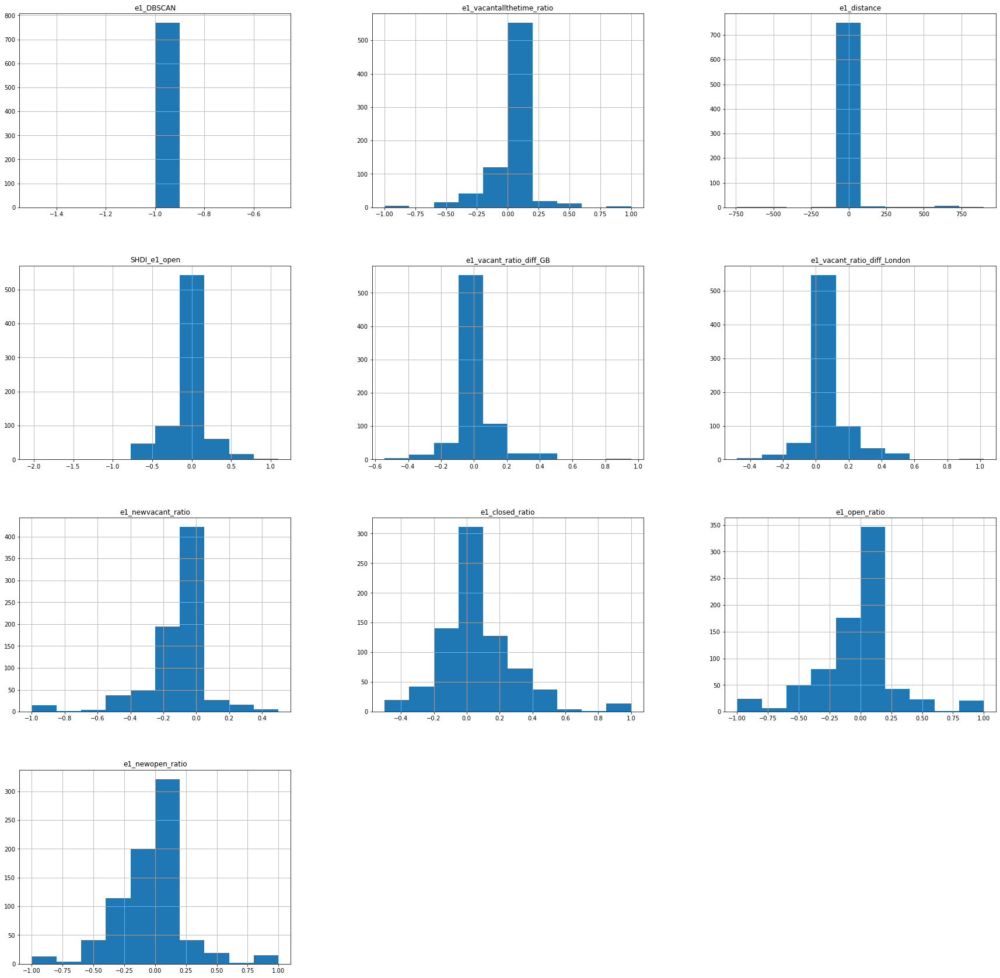

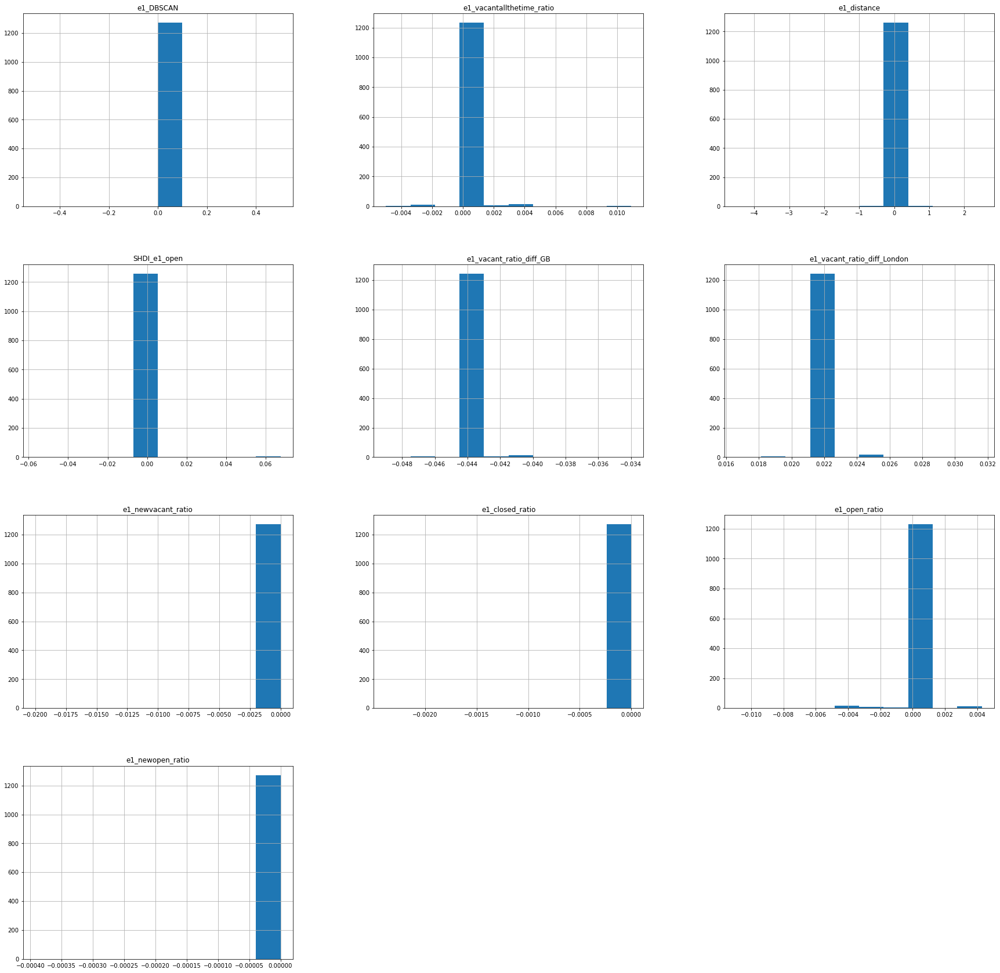

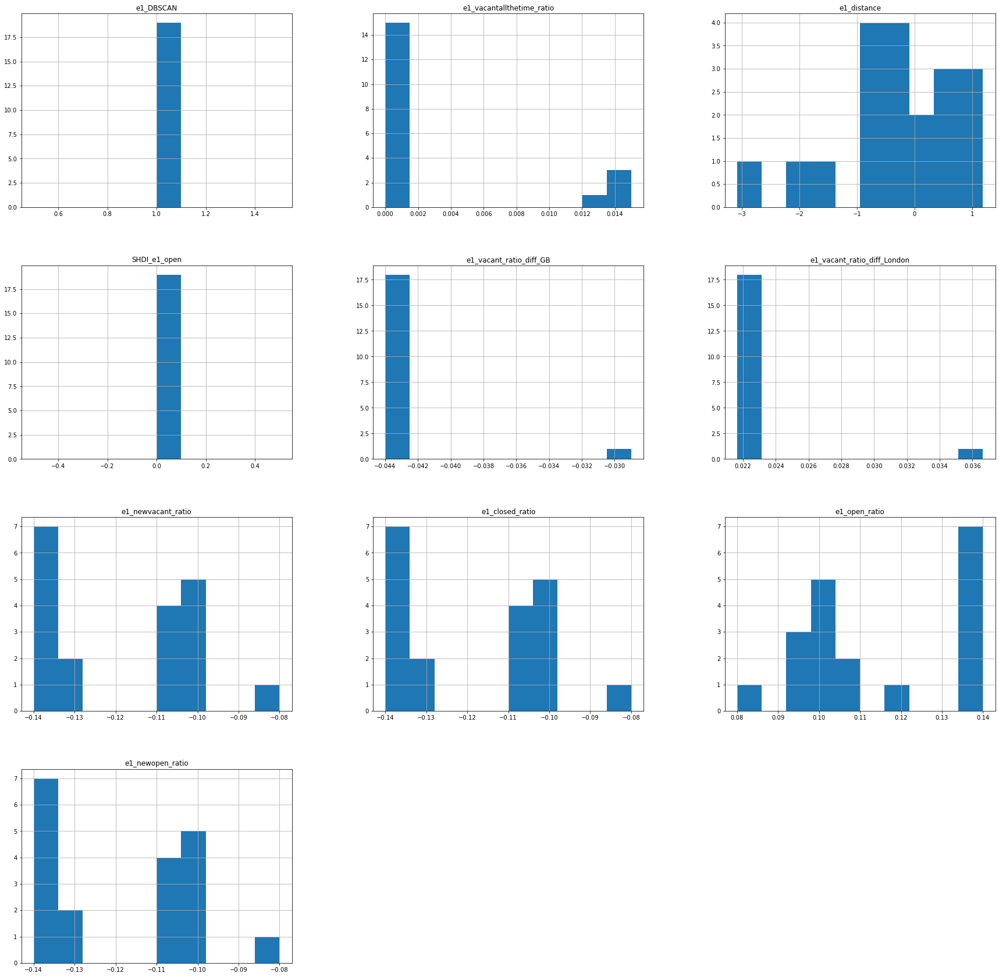

In [144]:
e1_dbs_change.groupby('e1_DBSCAN').hist(figsize=(30,30))

lc1_DBSCAN
-1    AxesSubplot(0.125,0.125;0.775x0.755)
 0    AxesSubplot(0.125,0.125;0.775x0.755)
 1    AxesSubplot(0.125,0.125;0.775x0.755)
 2    AxesSubplot(0.125,0.125;0.775x0.755)
 3    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_closed_ratio, dtype: object

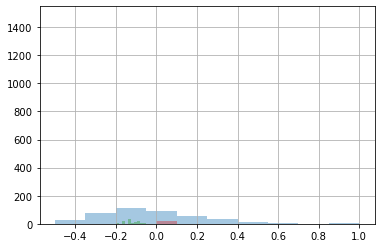

In [152]:
lc1_dbs_change.groupby('lc1_DBSCAN').lc1_closed_ratio.hist(alpha=0.4)

array([[<AxesSubplot:xlabel='lc1_DBSCAN', ylabel='lc1_DBSCAN'>,
        <AxesSubplot:xlabel='lc1_vacantallthetime_ratio', ylabel='lc1_DBSCAN'>,
        <AxesSubplot:xlabel='lc1_distance', ylabel='lc1_DBSCAN'>,
        <AxesSubplot:xlabel='SHDI_lc1_open', ylabel='lc1_DBSCAN'>,
        <AxesSubplot:xlabel='lc1_vacant_ratio_diff_GB', ylabel='lc1_DBSCAN'>,
        <AxesSubplot:xlabel='lc1_vacant_ratio_diff_London', ylabel='lc1_DBSCAN'>,
        <AxesSubplot:xlabel='lc1_newvacant_ratio', ylabel='lc1_DBSCAN'>,
        <AxesSubplot:xlabel='lc1_closed_ratio', ylabel='lc1_DBSCAN'>,
        <AxesSubplot:xlabel='lc1_open_ratio', ylabel='lc1_DBSCAN'>,
        <AxesSubplot:xlabel='lc1_newopen_ratio', ylabel='lc1_DBSCAN'>],
       [<AxesSubplot:xlabel='lc1_DBSCAN', ylabel='lc1_vacantallthetime_ratio'>,
        <AxesSubplot:xlabel='lc1_vacantallthetime_ratio', ylabel='lc1_vacantallthetime_ratio'>,
        <AxesSubplot:xlabel='lc1_distance', ylabel='lc1_vacantallthetime_ratio'>,
        <AxesSubplot:x

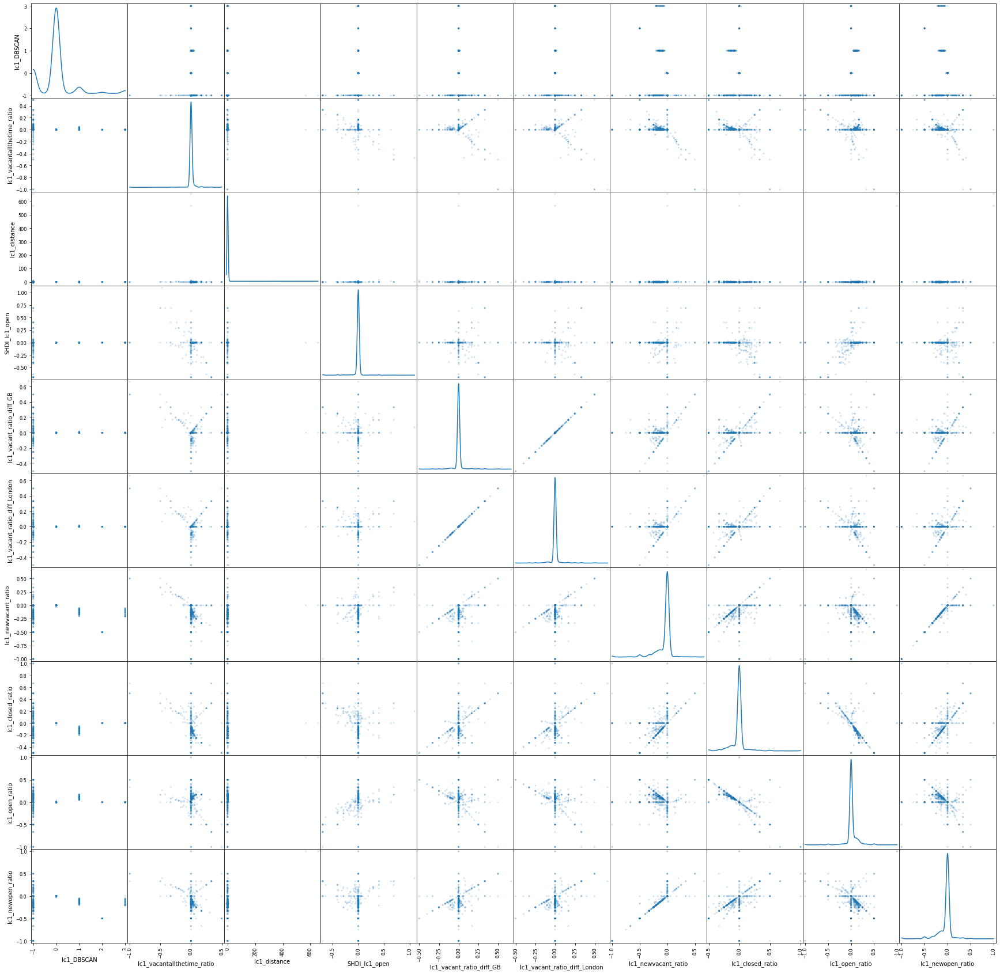

In [154]:
from pandas.plotting import scatter_matrix
scatter_matrix(lc1_dbs_change, alpha=0.2, figsize=(30, 30), diagonal='kde')

# 8.9 简化特征值

In [264]:
change_merged= pd.read_csv("change_merged.csv")
#change_merged.info()

In [346]:
SHID_dis= pd.read_csv("simplifed_SHID_distance.csv")
#change_merged.info()

In [351]:
SHID_dis.sample(5)

,id,e1_distance,lc1_distance,lc2_distance,e2_distance,recover_distance,post_distance,SHDI_lc1_open,SHDI_e1_open,SHDI_lc2_open,SHDI_e2_open,SHDI_recover_open,SHDI_post_open
1273,30237.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
362,11337.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
944,15845.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
918,14729.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
501,83279.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [348]:
SHID_dis[SHID_dis > 0] = 1

In [350]:
SHID_dis['id'] = SHID_dis['id'] / -1

In [353]:
change_merged_simplified.reset_index()

,id,lc1_vacantallthetime_ratio,e1_vacantallthetime_ratio,lc2_vacantallthetime_ratio,e2_vacantallthetime_ratio,recover_vacantallthetime_ratio,post_vacantallthetime_ratio,lc1_vacant_ratio_diff_GB,e1_vacant_ratio_diff_GB,lc2_vacant_ratio_diff_GB,...,lc2_open_ratio,e2_open_ratio,recover_open_ratio,post_open_ratio,lc1_newopen_ratio,e1_newopen_ratio,lc2_newopen_ratio,e2_newopen_ratio,recover_newopen_ratio,post_newopen_ratio
0,56039.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
1,32923.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2,56072.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
3,32024.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,24184.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2057,14260.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0
2058,83524.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0
2059,83750.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0
2060,13613.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [354]:
simplified = change_merged_simplified.merge(SHID_dis,on='id')

simplified.sample(5)

,id,lc1_vacantallthetime_ratio,e1_vacantallthetime_ratio,lc2_vacantallthetime_ratio,e2_vacantallthetime_ratio,recover_vacantallthetime_ratio,post_vacantallthetime_ratio,lc1_vacant_ratio_diff_GB,e1_vacant_ratio_diff_GB,lc2_vacant_ratio_diff_GB,...,lc2_distance,e2_distance,recover_distance,post_distance,SHDI_lc1_open,SHDI_e1_open,SHDI_lc2_open,SHDI_e2_open,SHDI_recover_open,SHDI_post_open
565,1670.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
938,15624.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1148,22603.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
995,17852.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
902,14313.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### kmeans

In [464]:
change_merged= pd.read_csv("change_merged.csv")

In [465]:
change_merged = change_merged.set_index('id')

In [466]:
change_merged.sample(5)

,lc1_vacantallthetime_ratio,e1_vacantallthetime_ratio,lc2_vacantallthetime_ratio,e2_vacantallthetime_ratio,recover_vacantallthetime_ratio,post_vacantallthetime_ratio,e1_distance,lc1_distance,lc2_distance,e2_distance,...,lc2_open_ratio,e2_open_ratio,recover_open_ratio,post_open_ratio,lc1_newopen_ratio,e1_newopen_ratio,lc2_newopen_ratio,e2_newopen_ratio,recover_newopen_ratio,post_newopen_ratio
id,,,,,,,,,,,,,,,,,,,,,
34736,0.0,0.0,0.0,0.5,1.0,1.0,0.000000,0.000000,0.000000,0.000000,...,0.0,-1.000000,-1.00,-1.00,0.0,0.0,0.0,0.5,0.0,0.00
55369,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00
17824,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00
15838,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,4.336070,4.336070,...,0.0,-0.333333,-0.25,0.00,0.0,0.0,0.0,0.0,0.5,0.25
14960,0.0,0.0,0.0,0.0,0.0,0.0,0.227611,0.227611,0.227611,0.227611,...,0.4,0.400000,0.40,0.15,-0.4,-0.4,-0.4,-0.4,-0.4,-0.15


### simplified result backup

In [557]:
#simplified.to_csv(r'simplified_result.csv', index= False)

PermissionError: [Errno 13] Permission denied: 'simplified_result.csv'

In [356]:
simplified = simplified.set_index('id')

In [357]:
simplified.sample(5)

,lc1_vacantallthetime_ratio,e1_vacantallthetime_ratio,lc2_vacantallthetime_ratio,e2_vacantallthetime_ratio,recover_vacantallthetime_ratio,post_vacantallthetime_ratio,lc1_vacant_ratio_diff_GB,e1_vacant_ratio_diff_GB,lc2_vacant_ratio_diff_GB,e2_vacant_ratio_diff_GB,...,lc2_distance,e2_distance,recover_distance,post_distance,SHDI_lc1_open,SHDI_e1_open,SHDI_lc2_open,SHDI_e2_open,SHDI_recover_open,SHDI_post_open
id,,,,,,,,,,,,,,,,,,,,,
19639.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
34516.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16943.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
19197.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14284.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,-1.0,0.0,-1.0,-1.0,-1.0,0.0,0.0


In [480]:
lc1_all_grids_pca= change_merged.filter(regex='lc1',axis=1)
#e1_all_grids_pca= change_merged_simplified.filter(regex='e1',axis=1)
#lc2_all_grids_pca= change_merged_simplified.filter(regex='lc2',axis=1)
#e2_all_grids_pca= change_merged_simplified.filter(regex='e2',axis=1)
#recover_all_grids_pca= change_merged_simplified.filter(regex='recover',axis=1)
#post_all_grids_pca= change_merged_simplified.filter(regex='post',axis=1)

#lc_all_grids_pca= change_merged_simplified.filter(regex='lc',axis=1)
#e_all_grids_pca= change_merged_simplified.filter(regex='e',axis=1)

In [481]:
X = lc1_all_grids_pca

In [483]:
cols = X.columns

In [485]:
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(X)
X_scaler = pd.DataFrame(x_scaled, columns=lc1_all_grids_pca.columns,index=lc1_all_grids_pca.index)

In [486]:
X.head()

,lc1_vacantallthetime_ratio,lc1_distance,SHDI_lc1_open,lc1_vacant_ratio_diff_GB,lc1_vacant_ratio_diff_London,lc1_newvacant_ratio,lc1_closed_ratio,lc1_open_ratio,lc1_newopen_ratio
id,,,,,,,,,
56039,0.0,0.000000,0.0,-0.000732,-0.002517,0.0,0.0,0.0,0.0
32923,0.0,656.503566,0.0,-0.000732,-0.002517,0.0,0.0,1.0,1.0
56072,0.0,0.000000,0.0,-0.000732,-0.002517,0.0,0.0,0.0,0.0
32024,0.0,566.930927,0.0,-0.000732,-0.002517,0.0,0.0,1.0,1.0
24184,0.0,0.000000,0.0,-0.000732,-0.002517,0.0,0.0,0.0,0.0


In [491]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=0) 

kmeans.fit(X)

KMeans(n_clusters=4, random_state=0)

In [492]:
kmeans.cluster_centers_

array([[ 1.31972596e-03,  1.12484338e-01, -4.25294237e-03,
         3.33175118e-04, -1.45252288e-03, -4.32339089e-02,
        -9.80265261e-03,  8.36647095e-03, -3.78327959e-02],
       [ 0.00000000e+00,  5.66930927e+02,  0.00000000e+00,
        -7.31528000e-04, -2.51722600e-03,  0.00000000e+00,
         0.00000000e+00,  1.00000000e+00,  1.00000000e+00],
       [ 0.00000000e+00,  6.56503566e+02,  0.00000000e+00,
        -7.31528000e-04, -2.51722600e-03,  0.00000000e+00,
         0.00000000e+00,  1.00000000e+00,  1.00000000e+00],
       [ 2.35503072e-02, -2.71650094e+00, -3.49612239e-02,
         1.49425999e-02,  1.31569019e-02, -1.46327566e-01,
        -1.14144811e-01,  8.98886216e-02, -1.09556576e-01]])

In [493]:
kmeans.inertia_

1372.3873740284341

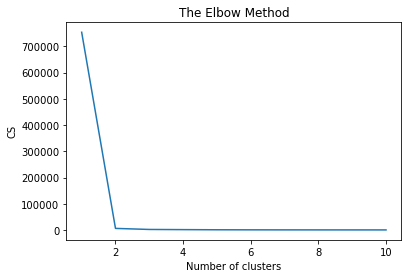

In [494]:
from sklearn.cluster import KMeans
cs = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(X)
    cs.append(kmeans.inertia_)
plt.plot(range(1, 11), cs)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('CS')
plt.show()

In [495]:
y_kmeans = kmeans.fit_predict(X)

In [497]:
y_kmeans

array([3, 2, 3, ..., 3, 3, 9], dtype=int32)

In [501]:
s = pd.Series(y_kmeans.labels_, index=X.index)
#rs[c_nm] = s
print(s.value_counts())
cls=pd.DataFrame([s])

AttributeError: 'numpy.ndarray' object has no attribute 'labels_'

In [498]:
plt.scatter(X[y_kmeans==0, 0], X[y_kmeans==0, 1], s=100, c='red', label ='Cluster 1')
plt.scatter(X[y_kmeans==1, 0], X[y_kmeans==1, 1], s=100, c='blue', label ='Cluster 2')
plt.scatter(X[y_kmeans==2, 0], X[y_kmeans==2, 1], s=100, c='green', label ='Cluster 3')
plt.scatter(X[y_kmeans==3, 0], X[y_kmeans==3, 1], s=100, c='cyan', label ='Cluster 4')
plt.scatter(X[y_kmeans==4, 0], X[y_kmeans==4, 1], s=100, c='magenta', label ='Cluster 5')

plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='yellow', label = 'Centroids')
plt.title('Clusters of Customers')
plt.xlabel('Annual Income(k$)')
plt.ylabel('Spending Score(1-100')
plt.show()

TypeError: '(array([False, False, False, ..., False, False, False]), 0)' is an invalid key

In [ ]:
dbs = DBSCAN(eps=3, min_samples=18).fit(cldf2)
s = pd.Series(dbs.labels_, index=cldf2.index, name=c_nm)
#rs[c_nm] = s
#print(s.value_counts())
cls=pd.DataFrame([s])
cls.sample()

In [358]:
simplified.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 2062 entries, 56039.0 to 33400.0
Data columns (total 54 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   lc1_vacantallthetime_ratio        2062 non-null   float64
 1   e1_vacantallthetime_ratio         2062 non-null   float64
 2   lc2_vacantallthetime_ratio        2062 non-null   float64
 3   e2_vacantallthetime_ratio         2062 non-null   float64
 4   recover_vacantallthetime_ratio    2062 non-null   float64
 5   post_vacantallthetime_ratio       2062 non-null   float64
 6   lc1_vacant_ratio_diff_GB          2062 non-null   float64
 7   e1_vacant_ratio_diff_GB           2062 non-null   float64
 8   lc2_vacant_ratio_diff_GB          2062 non-null   float64
 9   e2_vacant_ratio_diff_GB           2062 non-null   float64
 10  recover_vacant_ratio_diff_GB      2062 non-null   float64
 11  post_vacant_ratio_diff_GB         2062 non-null   float64


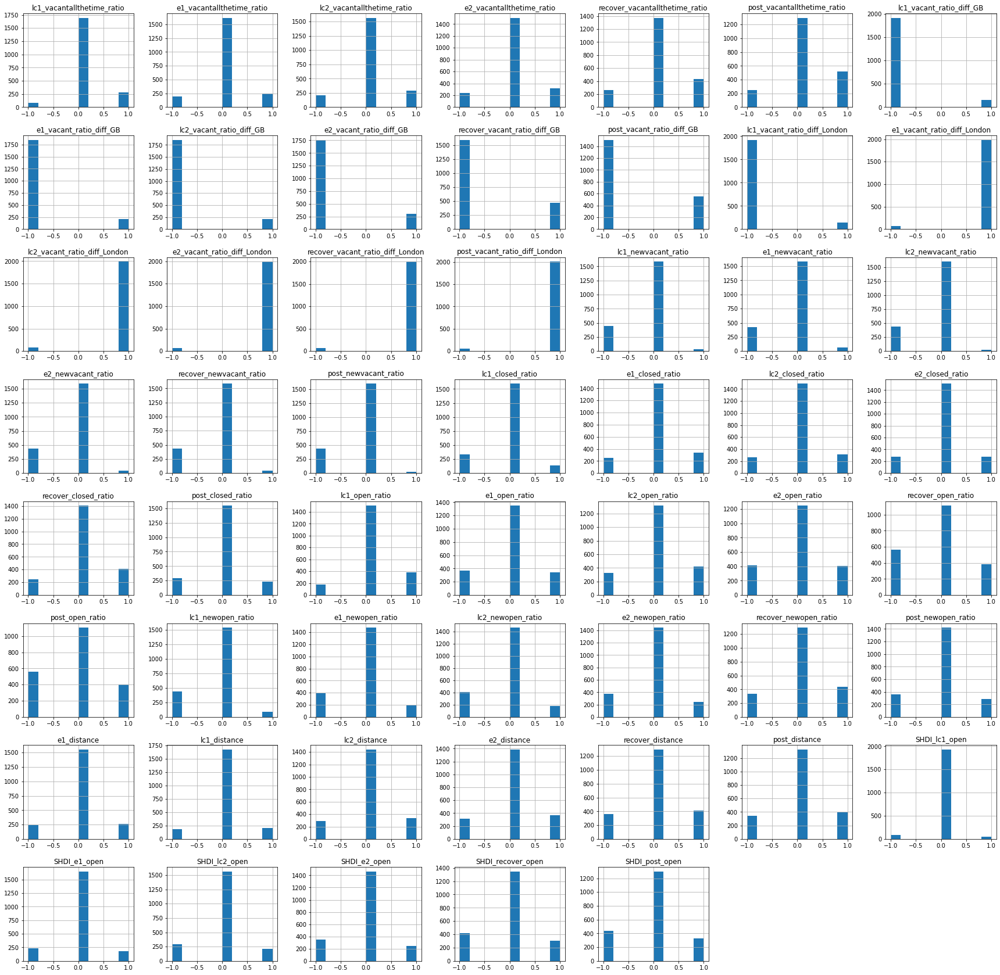

In [359]:
histograms = simplified.hist (figsize=(30,30))

In [250]:
change_merged = pd.read_csv("change_merged_simplified.csv")
#change_merged.info()

In [352]:
change_merged_simplified.sample(5)

,lc1_vacantallthetime_ratio,e1_vacantallthetime_ratio,lc2_vacantallthetime_ratio,e2_vacantallthetime_ratio,recover_vacantallthetime_ratio,post_vacantallthetime_ratio,lc1_vacant_ratio_diff_GB,e1_vacant_ratio_diff_GB,lc2_vacant_ratio_diff_GB,e2_vacant_ratio_diff_GB,...,lc2_open_ratio,e2_open_ratio,recover_open_ratio,post_open_ratio,lc1_newopen_ratio,e1_newopen_ratio,lc2_newopen_ratio,e2_newopen_ratio,recover_newopen_ratio,post_newopen_ratio
id,,,,,,,,,,,,,,,,,,,,,
3244.0,0.0,0.0,0.0,0.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,...,1.0,1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
6068.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
56068.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13597.0,1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,...,1.0,1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0
24984.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [253]:
change_merged_simplified[change_merged_simplified > 0] = 1

In [ ]:
change_merged_simplified['id'] = change_merged_simplified['id'] / -1

In [256]:
change_merged_simplified = change_merged_simplified.drop(columns=['id_ratio'] 
change_merged_simplified.sample(5)

,id,lc1_vacantallthetime_ratio,e1_vacantallthetime_ratio,lc2_vacantallthetime_ratio,e2_vacantallthetime_ratio,recover_vacantallthetime_ratio,post_vacantallthetime_ratio,lc1_vacant_ratio_diff_GB,e1_vacant_ratio_diff_GB,lc2_vacant_ratio_diff_GB,...,lc2_open_ratio,e2_open_ratio,recover_open_ratio,post_open_ratio,lc1_newopen_ratio,e1_newopen_ratio,lc2_newopen_ratio,e2_newopen_ratio,recover_newopen_ratio,post_newopen_ratio
266,-14059,1.0,-1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
1293,-30682,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1465,-54917,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1783,-15850,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,1.0,0.0,1.0
174,-18524,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,...,1.0,1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0


In [260]:
#change_merged_simplified['id'] = change_merged_simplified['id'] / -1
#df.Weight = df.Weight.astype('int64')
change_merged_simplified = change_merged_simplified.set_index('id')
change_merged_simplified.sample(5)

,lc1_vacantallthetime_ratio,e1_vacantallthetime_ratio,lc2_vacantallthetime_ratio,e2_vacantallthetime_ratio,recover_vacantallthetime_ratio,post_vacantallthetime_ratio,lc1_vacant_ratio_diff_GB,e1_vacant_ratio_diff_GB,lc2_vacant_ratio_diff_GB,e2_vacant_ratio_diff_GB,...,lc2_open_ratio,e2_open_ratio,recover_open_ratio,post_open_ratio,lc1_newopen_ratio,e1_newopen_ratio,lc2_newopen_ratio,e2_newopen_ratio,recover_newopen_ratio,post_newopen_ratio
id,,,,,,,,,,,,,,,,,,,,,
18303.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,...,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3681.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,1.0,-1.0,-1.0,...,1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0
22409.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
57406.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
12523.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [262]:
change_merged_simplified.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 2062 entries, 56039.0 to 33400.0
Data columns (total 42 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   lc1_vacantallthetime_ratio        2062 non-null   float64
 1   e1_vacantallthetime_ratio         2062 non-null   float64
 2   lc2_vacantallthetime_ratio        2062 non-null   float64
 3   e2_vacantallthetime_ratio         2062 non-null   float64
 4   recover_vacantallthetime_ratio    2062 non-null   float64
 5   post_vacantallthetime_ratio       2062 non-null   float64
 6   lc1_vacant_ratio_diff_GB          2062 non-null   float64
 7   e1_vacant_ratio_diff_GB           2062 non-null   float64
 8   lc2_vacant_ratio_diff_GB          2062 non-null   float64
 9   e2_vacant_ratio_diff_GB           2062 non-null   float64
 10  recover_vacant_ratio_diff_GB      2062 non-null   float64
 11  post_vacant_ratio_diff_GB         2062 non-null   float64


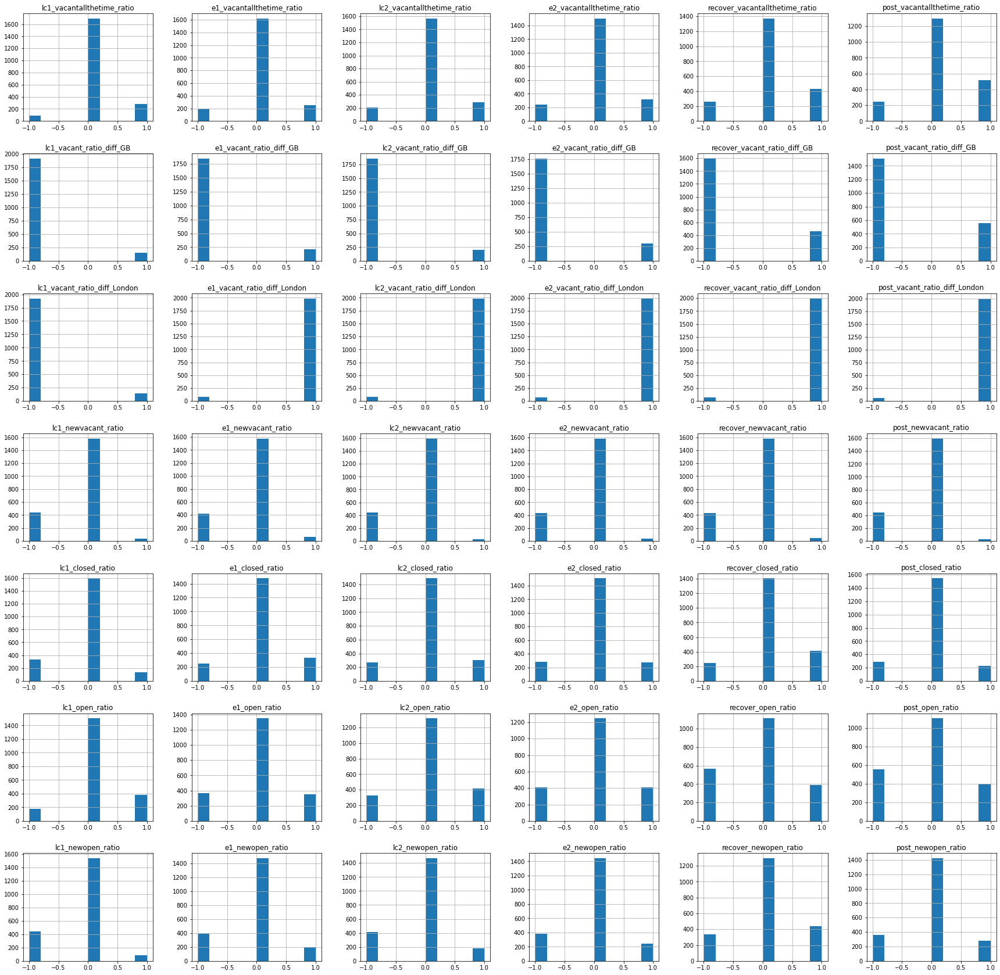

In [261]:
histograms = change_merged_simplified.hist (figsize=(30,30))

In [421]:
lc1_all_grids_pca= simplified.filter(regex='lc1',axis=1)
#e1_all_grids_pca= change_merged_simplified.filter(regex='e1',axis=1)
#lc2_all_grids_pca= change_merged_simplified.filter(regex='lc2',axis=1)
#e2_all_grids_pca= change_merged_simplified.filter(regex='e2',axis=1)
#recover_all_grids_pca= change_merged_simplified.filter(regex='recover',axis=1)
#post_all_grids_pca= change_merged_simplified.filter(regex='post',axis=1)

#lc_all_grids_pca= change_merged_simplified.filter(regex='lc',axis=1)
#e_all_grids_pca= change_merged_simplified.filter(regex='e',axis=1)

In [394]:
lc1_all_grids_pca.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 2062 entries, 56039.0 to 33400.0
Data columns (total 9 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   lc1_vacantallthetime_ratio    2062 non-null   float64
 1   lc1_vacant_ratio_diff_GB      2062 non-null   float64
 2   lc1_vacant_ratio_diff_London  2062 non-null   float64
 3   lc1_newvacant_ratio           2062 non-null   float64
 4   lc1_closed_ratio              2062 non-null   float64
 5   lc1_open_ratio                2062 non-null   float64
 6   lc1_newopen_ratio             2062 non-null   float64
 7   lc1_distance                  2062 non-null   float64
 8   SHDI_lc1_open                 2062 non-null   float64
dtypes: float64(9)
memory usage: 225.6 KB


In [273]:
# x = lc1_all_grids_pca.values #returns a numpy array
# min_max_scaler = preprocessing.MinMaxScaler()
# x_scaled = min_max_scaler.fit_transform(x)
# lc1_all_grids_pca = pd.DataFrame(x_scaled, columns=lc1_all_grids_pca.columns,index=lc1_all_grids_pca.index)

In [446]:
# from sklearn.decomposition import PCA 

# pca = PCA(n_components=9, whiten=True) 

# pca.fit(lc1_all_grids_pca)

# explained_variance = pca.explained_variance_ratio_
# singular_values = pca.singular_values_

from sklearn.decomposition import PCA 

pca = PCA(n_components=9, whiten=True) 

pca.fit(lc1_2ndcls)

explained_variance = pca.explained_variance_ratio_
singular_values = pca.singular_values_

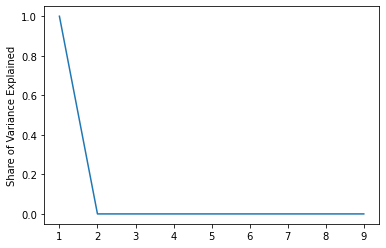

In [447]:
x = np.arange(1,len(explained_variance)+1)
plt.plot(x, explained_variance)
plt.ylabel('Share of Variance Explained')
plt.show()

In [448]:
for i in range(0, 9):
    print(f"Component {i:>2} accounts for {explained_variance[i]*100:>2.2f}% of variance")

Component  0 accounts for 100.00% of variance
Component  1 accounts for 0.00% of variance
Component  2 accounts for 0.00% of variance
Component  3 accounts for 0.00% of variance
Component  4 accounts for 0.00% of variance
Component  5 accounts for 0.00% of variance
Component  6 accounts for 0.00% of variance
Component  7 accounts for 0.00% of variance
Component  8 accounts for 0.00% of variance


In [398]:
keep_n_components = 4

# If we weren't changing the number of components we
# could re-use the pca object created above. 
pca = PCA(n_components=keep_n_components, whiten=True)

X_train = pca.fit_transform(lc1_all_grids_pca)

# Notice that we get the _same_ values out,
# so this is a *deterministic* process that
# is fully replicable (allowing for algorithmic
# and programming language differences).
for i in range(0, keep_n_components):
    print(f"Component {i:>2} accounts for {pca.explained_variance_ratio_[i]*100:>2.2f}% of variance")

# Notice...
print(len(X_train))
print(lc1_all_grids_pca.shape[0])
# So each observation has a row in X_train and there is 
# 1 column for each component. This defines the mapping
# of the original data space into the reduced one
print(len(X_train[0])) 

Component  0 accounts for 37.45% of variance
Component  1 accounts for 28.44% of variance
Component  2 accounts for 12.08% of variance
Component  3 accounts for 10.17% of variance
2062
2062
4


In [400]:
for x in [X_train]:
    new_columns = []
    
    for i in range(0,keep_n_components):
        new_columns.append([])

    for i in x:
        for j in range(0,keep_n_components):
            new_columns[j].append(i[j])

    for i in range(0,keep_n_components):
        lc1_all_grids_pca[f"Component {i+1}"] = new_columns[i]

In [401]:
lc1_com= lc1_all_grids_pca.filter(regex="Component")
lc1_com.sample(9)

,Component 1,Component 2,Component 3,Component 4
id,,,,
12907.0,0.310843,-0.342591,0.110530,0.021409
3594.0,0.310843,-0.342591,0.110530,0.021409
7417.0,0.310843,-0.342591,0.110530,0.021409
3368.0,0.310843,-0.342591,0.110530,0.021409
12969.0,-0.828358,-0.115948,-1.178778,-0.009861
13413.0,-1.936236,-0.010673,-0.004087,2.713319
4368.0,0.310843,-0.342591,0.110530,0.021409
17169.0,0.310843,-0.342591,0.110530,0.021409
13634.0,0.310843,-0.342591,0.110530,0.021409


In [450]:
# cldf2 = lc1_com
# cldf2 = lc1_all_grids_pca
# cldf2.info()

cldf2 = lc1_2ndcls.set_index('id')
cldf2.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 662 entries, 32923.0 to 33400.0
Data columns (total 9 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   lc1_vacantallthetime_ratio    662 non-null    float64
 1   lc1_vacant_ratio_diff_GB      662 non-null    float64
 2   lc1_vacant_ratio_diff_London  662 non-null    float64
 3   lc1_newvacant_ratio           662 non-null    float64
 4   lc1_closed_ratio              662 non-null    float64
 5   lc1_open_ratio                662 non-null    float64
 6   lc1_newopen_ratio             662 non-null    float64
 7   lc1_distance                  662 non-null    float64
 8   SHDI_lc1_open                 662 non-null    float64
dtypes: float64(9)
memory usage: 51.7 KB


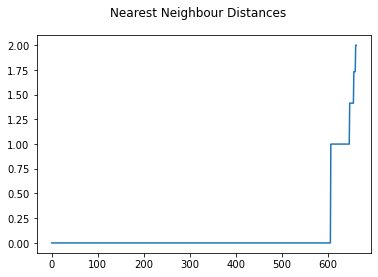

In [451]:
nbrs = NearestNeighbors(n_neighbors=2).fit(cldf2)
distances, indices = nbrs.kneighbors(cldf2)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
plt.gcf().suptitle("Nearest Neighbour Distances");

In [455]:
dbs = DBSCAN(eps=0.5, min_samples=80).fit(cldf2)
s = pd.Series(dbs.labels_, index=cldf2.index)

print(s.value_counts())
cls=pd.DataFrame([s])
cls.sample()

-1    581
 0     81
dtype: int64


id,32923.0,32024.0,18961.0,25017.0,13187.0,14725.0,18289.0,10501.0,14497.0,14954.0,...,19414.0,32255.0,13612.0,12293.0,18285.0,33378.0,23747.0,6286.0,21041.0,33400.0
0,-1,-1,-1,0,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [456]:
cls = cls.T
cls.head(10)

,0
id,
32923.0,-1
32024.0,-1
18961.0,-1
25017.0,0
13187.0,-1
14725.0,-1
18289.0,-1
10501.0,-1
14497.0,-1


In [457]:
cls = cls.reset_index()
cls.sample(10)

,id,0
9,14954.0,-1
658,23747.0,-1
527,21950.0,-1
165,32936.0,-1
221,14960.0,-1
51,15176.0,-1
173,32713.0,-1
493,13160.0,-1
399,5388.0,0
459,13607.0,-1


In [458]:
lc1_2ndcls = cls.merge(lc1_2ndcls,on='id')
lc1_2ndcls.sample(2)

,id,0,lc1_vacantallthetime_ratio,lc1_vacant_ratio_diff_GB,lc1_vacant_ratio_diff_London,lc1_newvacant_ratio,lc1_closed_ratio,lc1_open_ratio,lc1_newopen_ratio,lc1_distance,SHDI_lc1_open
463,6960.0,-1,-1.0,1.0,1.0,-1.0,0.0,1.0,-1.0,0.0,0.0
362,30913.0,0,0.0,-1.0,-1.0,-1.0,0.0,0.0,-1.0,0.0,0.0


In [459]:
#分类结果重命名
#post_com = post_com.rename(columns={"DBSCAN": "post_DBSCAN"})
#recover_com = recover_com.rename(columns={"DBSCAN": "recover_DBSCAN"})
#e2_com = e2_com.rename(columns={"DBSCAN": "e2_DBSCAN"})
#lc2_com = lc2_com.rename(columns={"DBSCAN": "lc2_DBSCAN"})
# e1_com = e1_com.rename(columns={"DBSCAN": "e1_DBSCAN"})
# lc1_all_grids_pca = lc1_all_grids_pca.rename(columns={0: "lc1_DBSCAN"})
lc1_2ndcls = lc1_2ndcls.rename(columns={0: "lc1_2nd_DBSCAN"})

#lc_com = lc_com.rename(columns={"DBSCAN": "lc_DBSCAN"})
#e_com = e_com.rename(columns={"DBSCAN": "e_DBSCAN"})

In [431]:
lc1_all_grids_pca.reset_index('id')

KeyError: 'Requested level (id) does not match index name (None)'

In [411]:
lc1_cluster_pca_profile= lc1_com.merge(lc1_all_grids_pca,how='left', on='id')

lc1_DBSCAN
-1    AxesSubplot(0.125,0.125;0.775x0.755)
 0    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_closed_ratio, dtype: object

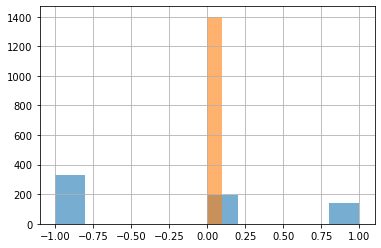

In [435]:
lc1_all_grids_pca.groupby('lc1_DBSCAN').lc1_closed_ratio.hist(alpha=0.6)

lc1_2nd_DBSCAN
-1    AxesSubplot(0.125,0.125;0.775x0.755)
 0    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_closed_ratio, dtype: object

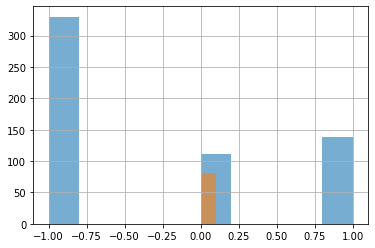

In [460]:
lc1_2ndcls.groupby('lc1_2nd_DBSCAN').lc1_closed_ratio.hist(alpha=0.6)

lc1_2nd_DBSCAN
-1    AxesSubplot(0.125,0.125;0.775x0.755)
 0    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_newopen_ratio, dtype: object

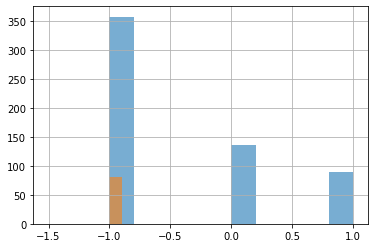

In [461]:
lc1_2ndcls.groupby('lc1_2nd_DBSCAN').lc1_newopen_ratio.hist(alpha=0.6)

lc1_2nd_DBSCAN
-1    AxesSubplot(0.125,0.125;0.775x0.755)
 0    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_vacantallthetime_ratio, dtype: object

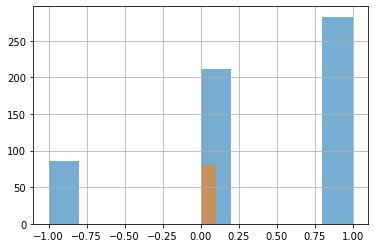

In [462]:
lc1_2ndcls.groupby('lc1_2nd_DBSCAN').lc1_vacantallthetime_ratio.hist(alpha=0.6)

lc1_DBSCAN
-1    AxesSubplot(0.125,0.125;0.775x0.755)
 0    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_newopen_ratio, dtype: object

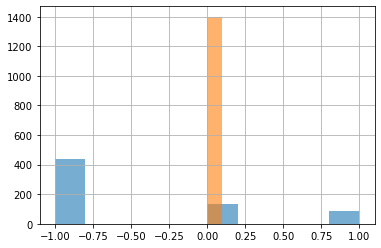

In [436]:
lc1_all_grids_pca.groupby('lc1_DBSCAN').lc1_newopen_ratio.hist(alpha=0.6)

lc1_DBSCAN
-1    AxesSubplot(0.125,0.125;0.775x0.755)
 0    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_vacantallthetime_ratio, dtype: object

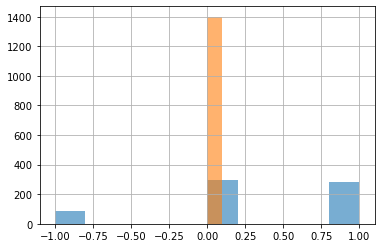

In [414]:
lc1_cluster_pca_profile.groupby('lc1_DBSCAN').lc1_vacantallthetime_ratio.hist(alpha=0.6)

lc1_DBSCAN
-1    AxesSubplot(0.125,0.125;0.775x0.755)
 0    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_newvacant_ratio, dtype: object

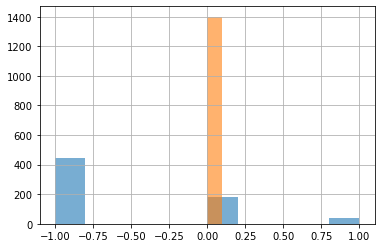

In [415]:
lc1_cluster_pca_profile.groupby('lc1_DBSCAN').lc1_newvacant_ratio.hist(alpha=0.6)

lc1_DBSCAN
-1    AxesSubplot(0.125,0.125;0.775x0.755)
 0    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_vacant_ratio_diff_GB, dtype: object

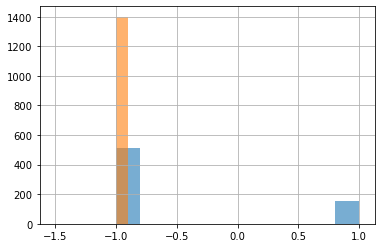

In [416]:
lc1_cluster_pca_profile.groupby('lc1_DBSCAN').lc1_vacant_ratio_diff_GB.hist(alpha=0.6)

lc1_DBSCAN
-1    AxesSubplot(0.125,0.125;0.775x0.755)
 0    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_vacant_ratio_diff_London, dtype: object

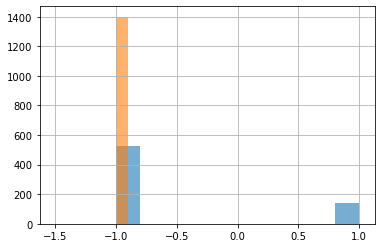

In [417]:
lc1_cluster_pca_profile.groupby('lc1_DBSCAN').lc1_vacant_ratio_diff_London.hist(alpha=0.6)

lc1_DBSCAN
-1    AxesSubplot(0.125,0.125;0.775x0.755)
 0    AxesSubplot(0.125,0.125;0.775x0.755)
Name: lc1_distance, dtype: object

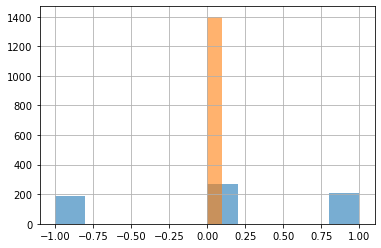

In [418]:
lc1_cluster_pca_profile.groupby('lc1_DBSCAN').lc1_distance.hist(alpha=0.6)

lc1_DBSCAN
-1    AxesSubplot(0.125,0.125;0.775x0.755)
 0    AxesSubplot(0.125,0.125;0.775x0.755)
Name: SHDI_lc1_open, dtype: object

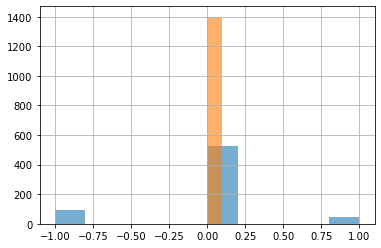

In [419]:
lc1_cluster_pca_profile.groupby('lc1_DBSCAN').SHDI_lc1_open.hist(alpha=0.6)

In [443]:
lc1_2ndcls = lc1_all_grids_pca[(lc1_all_grids_pca.lc1_DBSCAN == -1)]
lc1_2ndcls

,id,lc1_DBSCAN,lc1_vacantallthetime_ratio,lc1_vacant_ratio_diff_GB,lc1_vacant_ratio_diff_London,lc1_newvacant_ratio,lc1_closed_ratio,lc1_open_ratio,lc1_newopen_ratio,lc1_distance,SHDI_lc1_open
1,32923.0,-1,0.0,-1.0,-1.0,0.0,0.0,1.0,1.0,1.0,0.0
3,32024.0,-1,0.0,-1.0,-1.0,0.0,0.0,1.0,1.0,1.0,0.0
51,18961.0,-1,0.0,-1.0,-1.0,0.0,0.0,0.0,1.0,1.0,1.0
53,25017.0,-1,0.0,-1.0,-1.0,-1.0,0.0,0.0,-1.0,0.0,0.0
55,13187.0,-1,1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2031,33378.0,-1,0.0,-1.0,-1.0,0.0,1.0,-1.0,0.0,0.0,0.0
2036,23747.0,-1,1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,0.0
2045,6286.0,-1,0.0,-1.0,-1.0,0.0,1.0,-1.0,1.0,0.0,0.0
2053,21041.0,-1,0.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,0.0,0.0


In [445]:
lc1_2ndcls = lc1_2ndcls.drop(columns=['lc1_DBSCAN'])

lc1_2ndcls.set_index('id')                         

,lc1_vacantallthetime_ratio,lc1_vacant_ratio_diff_GB,lc1_vacant_ratio_diff_London,lc1_newvacant_ratio,lc1_closed_ratio,lc1_open_ratio,lc1_newopen_ratio,lc1_distance,SHDI_lc1_open
id,,,,,,,,,
32923.0,0.0,-1.0,-1.0,0.0,0.0,1.0,1.0,1.0,0.0
32024.0,0.0,-1.0,-1.0,0.0,0.0,1.0,1.0,1.0,0.0
18961.0,0.0,-1.0,-1.0,0.0,0.0,0.0,1.0,1.0,1.0
25017.0,0.0,-1.0,-1.0,-1.0,0.0,0.0,-1.0,0.0,0.0
13187.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...
33378.0,0.0,-1.0,-1.0,0.0,1.0,-1.0,0.0,0.0,0.0
23747.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,0.0
6286.0,0.0,-1.0,-1.0,0.0,1.0,-1.0,1.0,0.0,0.0
